In [28]:
import pandas as pd
import folium
import sqlite3
import matplotlib.pyplot as plt  #for data visualization operations
import seaborn as sns
from datetime import datetime, timedelta

# to show all rows and columns 
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.options.display.float_format = '{:.2f}'.format

In [2]:
def dict_factory(cursor, row):
    fields = [column[0] for column in cursor.description]
    return {key: value for key, value in zip(fields, row)}

In [3]:
con = sqlite3.connect("pegelstaende.db")
con.row_factory = dict_factory
cur = con.cursor()
con.execute('PRAGMA foreign_keys = ON;')

In [4]:
def run(sql):
    r = cur.execute(sql)
    return(r.fetchall())

In [10]:
data = (pd.DataFrame(run("""SELECT
        r.name AS fluss,
        *
    FROM rivers r
    LEFT JOIN stations s ON r.id = s.river_id
    LEFT JOIN timeseries ts ON s.uuid = ts.uuid
    WHERE ts.date IS NOT NULL
    """)))
data["km"] = data["km"].astype(float)
display(data.head())
display(data.tail())

,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
0,Aller,1,Eitze,47174d8f-1b8e-4599-8a59-b580dd55bc87,1,48900237,9.56,Verden,52.90,9.28,2023-06-13 09:40:29,2023-05-15,0,W,00:15,286
1,Aller,1,Eitze,47174d8f-1b8e-4599-8a59-b580dd55bc87,1,48900237,9.56,Verden,52.90,9.28,2023-06-13 09:40:29,2023-05-15,1,W,00:30,286
2,Aller,1,Eitze,47174d8f-1b8e-4599-8a59-b580dd55bc87,1,48900237,9.56,Verden,52.90,9.28,2023-06-13 09:40:29,2023-05-15,2,W,00:45,286
3,Aller,1,Eitze,47174d8f-1b8e-4599-8a59-b580dd55bc87,1,48900237,9.56,Verden,52.90,9.28,2023-06-13 09:40:29,2023-05-15,3,W,01:00,286
4,Aller,1,Eitze,47174d8f-1b8e-4599-8a59-b580dd55bc87,1,48900237,9.56,Verden,52.90,9.28,2023-06-13 09:40:29,2023-05-15,4,W,01:15,286


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
13091702,Wümme,99,Borgfeld,aac49cf2-5d3f-4c69-9847-027fecaeef30,99,4940010,0.27,Bremen,53.13,8.89,2023-06-13 09:40:29,2023-06-13,549,W,09:10,526
13091703,Wümme,99,Borgfeld,aac49cf2-5d3f-4c69-9847-027fecaeef30,99,4940010,0.27,Bremen,53.13,8.89,2023-06-13 09:40:29,2023-06-13,550,W,09:11,526
13091704,Wümme,99,Borgfeld,aac49cf2-5d3f-4c69-9847-027fecaeef30,99,4940010,0.27,Bremen,53.13,8.89,2023-06-13 09:40:29,2023-06-13,551,W,09:12,526
13091705,Wümme,99,Borgfeld,aac49cf2-5d3f-4c69-9847-027fecaeef30,99,4940010,0.27,Bremen,53.13,8.89,2023-06-13 09:40:29,2023-06-13,552,W,09:13,526
13091706,Wümme,99,Borgfeld,aac49cf2-5d3f-4c69-9847-027fecaeef30,99,4940010,0.27,Bremen,53.13,8.89,2023-06-13 09:40:29,2023-06-13,553,W,09:14,526


In [22]:
data['value'] = data['value'].str.replace(',', '.').fillna(data['value'])

In [29]:
# Increment the 'date' column by one day for rows where 'key' was "24:00"
mask = data['key'] == "24:00"  # Create a mask for rows where 'key' is "00:00"

# Create a new column 'timestamp' by combining 'date' and 'key' fields
data.loc[mask, 'key'] = data.loc[mask, 'key'].replace("24:00", "00:00")
data.loc[mask, 'date'] = str(pd.to_datetime(pd.to_datetime(data.loc[mask, 'date']) + timedelta(days=1)).dt.date)

Compress timeseries for the type W for Kachlet Up  on river Donau


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
119452,Donau,8,Kachlet Up,0fd56e0a-e32e-4b56-9cda-e0ce93d715c4,8,10090708,2230.32,Standort Regensburg,48.58,13.41,2023-06-13 09:40:29,2023-06-13,448,W,07:29,132,2023-06-13 07:29:00
119453,Donau,8,Kachlet Up,0fd56e0a-e32e-4b56-9cda-e0ce93d715c4,8,10090708,2230.32,Standort Regensburg,48.58,13.41,2023-06-13 09:40:29,2023-06-13,449,W,07:30,132,2023-06-13 07:30:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4112,2023-06-13 07:15:00,Donau,8,Kachlet Up,0fd56e0a-e32e-4b56-9cda-e0ce93d715c4,8,10090708,2230.32,Standort Regensburg,48.58,13.41,2023-06-13 09:40:29,2023-06-13,434,W,07:15,133.40
4113,2023-06-13 07:30:00,Donau,8,Kachlet Up,0fd56e0a-e32e-4b56-9cda-e0ce93d715c4,8,10090708,2230.32,Standort Regensburg,48.58,13.41,2023-06-13 09:40:29,2023-06-13,449,W,07:30,132.00


Compress timeseries for the type W for Herbrum Hafendamm  on river Dortmund-Ems-Kanal


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
302311,Dortmund-Ems-Kanal,9,Herbrum Hafendamm,8177a148-5674-4b8f-8ded-050907f640f3,9,3770030,213.07,Standort Meppen,53.04,7.32,2023-06-13 09:40:29,2023-06-13,453,W,07:34,642,2023-06-13 07:34:00
302312,Dortmund-Ems-Kanal,9,Herbrum Hafendamm,8177a148-5674-4b8f-8ded-050907f640f3,9,3770030,213.07,Standort Meppen,53.04,7.32,2023-06-13 09:40:29,2023-06-13,454,W,07:35,643,2023-06-13 07:35:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4112,2023-06-13 07:15:00,Dortmund-Ems-Kanal,9,Herbrum Hafendamm,8177a148-5674-4b8f-8ded-050907f640f3,9,3770030,213.07,Standort Meppen,53.04,7.32,2023-06-13 09:40:29,2023-06-13,434,W,07:15,640.73
4113,2023-06-13 07:30:00,Dortmund-Ems-Kanal,9,Herbrum Hafendamm,8177a148-5674-4b8f-8ded-050907f640f3,9,3770030,213.07,Standort Meppen,53.04,7.32,2023-06-13 09:40:29,2023-06-13,449,W,07:30,641.83


Compress timeseries for the type W for Rhede  on river Dortmund-Ems-Kanal


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
239943,Dortmund-Ems-Kanal,9,Rhede,16508b11-4349-48f7-be51-1227b7888585,9,3770040,217.86,Standort Meppen,53.07,7.29,2023-06-13 09:40:29,2023-06-13,454,W,07:35,641,2023-06-13 07:35:00
239944,Dortmund-Ems-Kanal,9,Rhede,16508b11-4349-48f7-be51-1227b7888585,9,3770040,217.86,Standort Meppen,53.07,7.29,2023-06-13 09:40:29,2023-06-13,455,W,07:36,640,2023-06-13 07:36:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4106,2023-06-13 07:15:00,Dortmund-Ems-Kanal,9,Rhede,16508b11-4349-48f7-be51-1227b7888585,9,3770040,217.86,Standort Meppen,53.07,7.29,2023-06-13 09:40:29,2023-06-13,434,W,07:15,634.53
4107,2023-06-13 07:30:00,Dortmund-Ems-Kanal,9,Rhede,16508b11-4349-48f7-be51-1227b7888585,9,3770040,217.86,Standort Meppen,53.07,7.29,2023-06-13 09:40:29,2023-06-13,449,W,07:30,639.86


Compress timeseries for the type W for Lexfähre Unterwasser  on river Eider


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
626548,Eider,12,Lexfähre Oberwasser,86c5688f-2fac-4d58-a245-ad8ce14cafbf,12,9520020,26.09,Standort Tönning,54.22,9.44,2023-06-13 09:40:29,2023-06-13,451,W,07:32,474,2023-06-13 07:32:00
626549,Eider,12,Lexfähre Oberwasser,86c5688f-2fac-4d58-a245-ad8ce14cafbf,12,9520020,26.09,Standort Tönning,54.22,9.44,2023-06-13 09:40:29,2023-06-13,452,W,07:33,474,2023-06-13 07:33:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
8204,2023-06-13 07:15:00,Eider,12,Lexfähre Oberwasser,86c5688f-2fac-4d58-a245-ad8ce14cafbf,12,9520020,26.09,Standort Tönning,54.22,9.44,2023-06-13 09:40:29,2023-06-13,434,W,07:15,459.67
8205,2023-06-13 07:30:00,Eider,12,Lexfähre Oberwasser,86c5688f-2fac-4d58-a245-ad8ce14cafbf,12,9520020,26.09,Standort Tönning,54.22,9.44,2023-06-13 09:40:29,2023-06-13,449,W,07:30,459.12


Compress timeseries for the type W for Nordfeld Oberwasser  on river Eider


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
439477,Eider,12,Nordfeld Oberwasser,61394669-3f1b-44e5-ae37-50fd2512f4fa,12,9520040,78.19,Standort Tönning,54.34,9.14,2023-06-13 09:40:29,2023-06-13,451,W,07:32,462,2023-06-13 07:32:00
439478,Eider,12,Nordfeld Oberwasser,61394669-3f1b-44e5-ae37-50fd2512f4fa,12,9520040,78.19,Standort Tönning,54.34,9.14,2023-06-13 09:40:29,2023-06-13,452,W,07:33,462,2023-06-13 07:33:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4097,2023-06-13 07:15:00,Eider,12,Nordfeld Oberwasser,61394669-3f1b-44e5-ae37-50fd2512f4fa,12,9520040,78.19,Standort Tönning,54.34,9.14,2023-06-13 09:40:29,2023-06-13,434,W,07:15,461.73
4098,2023-06-13 07:30:00,Eider,12,Nordfeld Oberwasser,61394669-3f1b-44e5-ae37-50fd2512f4fa,12,9520040,78.19,Standort Tönning,54.34,9.14,2023-06-13 09:40:29,2023-06-13,449,W,07:30,462.00


Compress timeseries for the type W for Nordfeld Unterwasser  on river Eider


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
751268,Eider,12,Nordfeld Unterwasser,cb93548e-c1ce-43f6-b3a1-6903f8835b33,12,9520050,78.31,Standort Tönning,54.34,9.14,2023-06-13 09:40:29,2023-06-13,451,W,07:32,484,2023-06-13 07:32:00
751269,Eider,12,Nordfeld Unterwasser,cb93548e-c1ce-43f6-b3a1-6903f8835b33,12,9520050,78.31,Standort Tönning,54.34,9.14,2023-06-13 09:40:29,2023-06-13,452,W,07:33,485,2023-06-13 07:33:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4112,2023-06-13 07:15:00,Eider,12,Nordfeld Unterwasser,cb93548e-c1ce-43f6-b3a1-6903f8835b33,12,9520050,78.31,Standort Tönning,54.34,9.14,2023-06-13 09:40:29,2023-06-13,434,W,07:15,475.93
4113,2023-06-13 07:30:00,Eider,12,Nordfeld Unterwasser,cb93548e-c1ce-43f6-b3a1-6903f8835b33,12,9520050,78.31,Standort Tönning,54.34,9.14,2023-06-13 09:40:29,2023-06-13,449,W,07:30,483.50


Compress timeseries for the type W for Friedrichstadt Strassenbrücke  on river Eider


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
501850,Eider,12,Friedrichstadt Strassenbrücke,721313e7-935a-4bb8-8c6d-0e014211b2ec,12,9520060,83.14,Standort Tönning,54.37,9.09,2023-06-13 09:40:29,2023-06-13,451,W,07:32,446,2023-06-13 07:32:00
501851,Eider,12,Friedrichstadt Strassenbrücke,721313e7-935a-4bb8-8c6d-0e014211b2ec,12,9520060,83.14,Standort Tönning,54.37,9.09,2023-06-13 09:40:29,2023-06-13,452,W,07:33,447,2023-06-13 07:33:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Eider,12,Friedrichstadt Strassenbrücke,721313e7-935a-4bb8-8c6d-0e014211b2ec,12,9520060,83.14,Standort Tönning,54.37,9.09,2023-06-13 09:40:29,2023-06-13,434,W,07:15,439.07
4114,2023-06-13 07:30:00,Eider,12,Friedrichstadt Strassenbrücke,721313e7-935a-4bb8-8c6d-0e014211b2ec,12,9520060,83.14,Standort Tönning,54.37,9.09,2023-06-13 09:40:29,2023-06-13,449,W,07:30,445.75


Compress timeseries for the type W for Tönning  on river Eider


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
377132,Eider,12,Tönning,00e386ac-e35c-4a6e-80dd-f8cd8a9e7a62,12,9520070,99.80,Standort Tönning,54.31,8.95,2023-06-13 09:40:29,2023-06-13,451,W,07:32,541,2023-06-13 07:32:00
377133,Eider,12,Tönning,00e386ac-e35c-4a6e-80dd-f8cd8a9e7a62,12,9520070,99.80,Standort Tönning,54.31,8.95,2023-06-13 09:40:29,2023-06-13,452,W,07:33,541,2023-06-13 07:33:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4100,2023-06-13 07:15:00,Eider,12,Tönning,00e386ac-e35c-4a6e-80dd-f8cd8a9e7a62,12,9520070,99.80,Standort Tönning,54.31,8.95,2023-06-13 09:40:29,2023-06-13,434,W,07:15,529.93
4101,2023-06-13 07:30:00,Eider,12,Tönning,00e386ac-e35c-4a6e-80dd-f8cd8a9e7a62,12,9520070,99.80,Standort Tönning,54.31,8.95,2023-06-13 09:40:29,2023-06-13,449,W,07:30,539.75


Compress timeseries for the type W for Eider-Sperrwerk Bp  on river Eider


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
688908,Eider,12,Eider-Sperrwerk Bp,8ac85e6c-6167-496c-b16f-fa94f81cd94a,12,9520081,110.10,Standort Tönning,54.27,8.85,2023-06-13 09:40:29,2023-06-13,451,W,07:32,552,2023-06-13 07:32:00
688909,Eider,12,Eider-Sperrwerk Bp,8ac85e6c-6167-496c-b16f-fa94f81cd94a,12,9520081,110.10,Standort Tönning,54.27,8.85,2023-06-13 09:40:29,2023-06-13,452,W,07:33,553,2023-06-13 07:33:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4112,2023-06-13 07:15:00,Eider,12,Eider-Sperrwerk Bp,8ac85e6c-6167-496c-b16f-fa94f81cd94a,12,9520081,110.10,Standort Tönning,54.27,8.85,2023-06-13 09:40:29,2023-06-13,434,W,07:15,545.47
4113,2023-06-13 07:30:00,Eider,12,Eider-Sperrwerk Bp,8ac85e6c-6167-496c-b16f-fa94f81cd94a,12,9520081,110.10,Standort Tönning,54.27,8.85,2023-06-13 09:40:29,2023-06-13,449,W,07:30,551.50


Compress timeseries for the type W for Dömitz  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
1657912,Elbe,13,Dömitz,6e3ea719-48b1-408a-bc55-0986c1e94cd5,13,5910025,504.70,Standort Lauenburg,53.14,11.24,2023-06-13 09:40:29,2023-06-13,450,W,07:31,82,2023-06-13 07:31:00
1657913,Elbe,13,Dömitz,6e3ea719-48b1-408a-bc55-0986c1e94cd5,13,5910025,504.70,Standort Lauenburg,53.14,11.24,2023-06-13 09:40:29,2023-06-13,451,W,07:32,82,2023-06-13 07:32:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Dömitz,6e3ea719-48b1-408a-bc55-0986c1e94cd5,13,5910025,504.70,Standort Lauenburg,53.14,11.24,2023-06-13 09:40:29,2023-06-13,434,W,07:15,82.00
4114,2023-06-13 07:30:00,Elbe,13,Dömitz,6e3ea719-48b1-408a-bc55-0986c1e94cd5,13,5910025,504.70,Standort Lauenburg,53.14,11.24,2023-06-13 09:40:29,2023-06-13,449,W,07:30,82.00


Compress timeseries for the type W for Damnatz  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
2571280,Elbe,13,Damnatz,c233674f-259a-4304-b81f-dce1f415d85b,13,5910030,509.35,Standort Lauenburg,53.14,11.18,2023-06-13 09:40:29,2023-06-13,450,W,07:31,177,2023-06-13 07:31:00
2571281,Elbe,13,Damnatz,c233674f-259a-4304-b81f-dce1f415d85b,13,5910030,509.35,Standort Lauenburg,53.14,11.18,2023-06-13 09:40:29,2023-06-13,451,W,07:32,177,2023-06-13 07:32:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Damnatz,c233674f-259a-4304-b81f-dce1f415d85b,13,5910030,509.35,Standort Lauenburg,53.14,11.18,2023-06-13 09:40:29,2023-06-13,434,W,07:15,177.00
4114,2023-06-13 07:30:00,Elbe,13,Damnatz,c233674f-259a-4304-b81f-dce1f415d85b,13,5910030,509.35,Standort Lauenburg,53.14,11.18,2023-06-13 09:40:29,2023-06-13,449,W,07:30,177.00


Compress timeseries for the type W for Hitzacker  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
2117944,Elbe,13,Hitzacker,a26e57c9-1cb8-4fca-ba80-9e02abc81df8,13,5920010,522.64,Standort Lauenburg,53.15,11.05,2023-06-13 09:40:29,2023-06-13,450,W,07:31,136,2023-06-13 07:31:00
2117945,Elbe,13,Hitzacker,a26e57c9-1cb8-4fca-ba80-9e02abc81df8,13,5920010,522.64,Standort Lauenburg,53.15,11.05,2023-06-13 09:40:29,2023-06-13,451,W,07:32,136,2023-06-13 07:32:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Hitzacker,a26e57c9-1cb8-4fca-ba80-9e02abc81df8,13,5920010,522.64,Standort Lauenburg,53.15,11.05,2023-06-13 09:40:29,2023-06-13,434,W,07:15,136.00
4114,2023-06-13 07:30:00,Elbe,13,Hitzacker,a26e57c9-1cb8-4fca-ba80-9e02abc81df8,13,5920010,522.64,Standort Lauenburg,53.15,11.05,2023-06-13 09:40:29,2023-06-13,449,W,07:30,135.00


Compress timeseries for the type W for Neu Darchau  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
1533169,Elbe,13,Neu Darchau,67d6e882-b60c-40d3-975c-a6d7a2b4e40a,13,5930010,536.38,Standort Lauenburg,53.23,10.89,2023-06-13 09:40:29,2023-06-13,450,W,07:31,139,2023-06-13 07:31:00
1533170,Elbe,13,Neu Darchau,67d6e882-b60c-40d3-975c-a6d7a2b4e40a,13,5930010,536.38,Standort Lauenburg,53.23,10.89,2023-06-13 09:40:29,2023-06-13,451,W,07:32,139,2023-06-13 07:32:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Neu Darchau,67d6e882-b60c-40d3-975c-a6d7a2b4e40a,13,5930010,536.38,Standort Lauenburg,53.23,10.89,2023-06-13 09:40:29,2023-06-13,434,W,07:15,138.80
4114,2023-06-13 07:30:00,Elbe,13,Neu Darchau,67d6e882-b60c-40d3-975c-a6d7a2b4e40a,13,5930010,536.38,Standort Lauenburg,53.23,10.89,2023-06-13 09:40:29,2023-06-13,449,W,07:30,139.00


Compress timeseries for the type W for Bleckede  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
1595541,Elbe,13,Bleckede,6aa1cd8e-e528-4bcb-ba8e-705b6dcb7da2,13,5930020,549.63,Standort Lauenburg,53.30,10.74,2023-06-13 09:40:29,2023-06-13,450,W,07:31,553,2023-06-13 07:31:00
1595542,Elbe,13,Bleckede,6aa1cd8e-e528-4bcb-ba8e-705b6dcb7da2,13,5930020,549.63,Standort Lauenburg,53.30,10.74,2023-06-13 09:40:29,2023-06-13,451,W,07:32,553,2023-06-13 07:32:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Bleckede,6aa1cd8e-e528-4bcb-ba8e-705b6dcb7da2,13,5930020,549.63,Standort Lauenburg,53.30,10.74,2023-06-13 09:40:29,2023-06-13,434,W,07:15,553.00
4114,2023-06-13 07:30:00,Elbe,13,Bleckede,6aa1cd8e-e528-4bcb-ba8e-705b6dcb7da2,13,5930020,549.63,Standort Lauenburg,53.30,10.74,2023-06-13 09:40:29,2023-06-13,449,W,07:30,553.00


Compress timeseries for the type W for Boizenburg  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
1032166,Elbe,13,Boizenburg,33e0bce0-13df-4ffc-be9d-f1a79e795e1c,13,5930033,558.53,Standort Lauenburg,53.38,10.72,2023-06-13 09:40:29,2023-06-13,450,W,07:31,82,2023-06-13 07:31:00
1032167,Elbe,13,Boizenburg,33e0bce0-13df-4ffc-be9d-f1a79e795e1c,13,5930033,558.53,Standort Lauenburg,53.38,10.72,2023-06-13 09:40:29,2023-06-13,451,W,07:32,82,2023-06-13 07:32:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Boizenburg,33e0bce0-13df-4ffc-be9d-f1a79e795e1c,13,5930033,558.53,Standort Lauenburg,53.38,10.72,2023-06-13 09:40:29,2023-06-13,434,W,07:15,81.73
4114,2023-06-13 07:30:00,Elbe,13,Boizenburg,33e0bce0-13df-4ffc-be9d-f1a79e795e1c,13,5930033,558.53,Standort Lauenburg,53.38,10.72,2023-06-13 09:40:29,2023-06-13,449,W,07:30,82.00


Compress timeseries for the type W for Hohnstorf  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
2833239,Elbe,13,Hohnstorf,d9289367-c8aa-4b6a-b1ad-857fec94c6bb,13,5930040,568.99,Standort Lauenburg,53.37,10.56,2023-06-13 09:40:29,2023-06-13,450,W,07:31,421,2023-06-13 07:31:00
2833240,Elbe,13,Hohnstorf,d9289367-c8aa-4b6a-b1ad-857fec94c6bb,13,5930040,568.99,Standort Lauenburg,53.37,10.56,2023-06-13 09:40:29,2023-06-13,451,W,07:32,421,2023-06-13 07:32:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Hohnstorf,d9289367-c8aa-4b6a-b1ad-857fec94c6bb,13,5930040,568.99,Standort Lauenburg,53.37,10.56,2023-06-13 09:40:29,2023-06-13,434,W,07:15,422.00
4114,2023-06-13 07:30:00,Elbe,13,Hohnstorf,d9289367-c8aa-4b6a-b1ad-857fec94c6bb,13,5930040,568.99,Standort Lauenburg,53.37,10.56,2023-06-13 09:40:29,2023-06-13,449,W,07:30,420.67


Compress timeseries for the type W for Artlenburg  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
2438242,Elbe,13,Artlenburg,b3492c68-8373-4769-9b29-22f66635a478,13,5930050,573.86,Standort Lauenburg,53.38,10.49,2023-06-13 09:40:29,2023-06-13,450,W,07:31,412,2023-06-13 07:31:00
2438243,Elbe,13,Artlenburg,b3492c68-8373-4769-9b29-22f66635a478,13,5930050,573.86,Standort Lauenburg,53.38,10.49,2023-06-13 09:40:29,2023-06-13,451,W,07:32,412,2023-06-13 07:32:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4082,2023-06-13 07:15:00,Elbe,13,Artlenburg,b3492c68-8373-4769-9b29-22f66635a478,13,5930050,573.86,Standort Lauenburg,53.38,10.49,2023-06-13 09:40:29,2023-06-13,434,W,07:15,411.07
4083,2023-06-13 07:30:00,Elbe,13,Artlenburg,b3492c68-8373-4769-9b29-22f66635a478,13,5930050,573.86,Standort Lauenburg,53.38,10.49,2023-06-13 09:40:29,2023-06-13,449,W,07:30,411.67


Compress timeseries for the type W for Geesthacht  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
1275572,Elbe,13,Geesthacht,44f7e955-c97d-45c8-9ed7-19406806fb4c,13,5930060,583.39,Standort Lauenburg,53.43,10.37,2023-06-13 09:40:29,2023-06-13,450,W,07:31,404,2023-06-13 07:31:00
1275573,Elbe,13,Geesthacht,44f7e955-c97d-45c8-9ed7-19406806fb4c,13,5930060,583.39,Standort Lauenburg,53.43,10.37,2023-06-13 09:40:29,2023-06-13,451,W,07:32,404,2023-06-13 07:32:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4106,2023-06-13 07:15:00,Elbe,13,Geesthacht,44f7e955-c97d-45c8-9ed7-19406806fb4c,13,5930060,583.39,Standort Lauenburg,53.43,10.37,2023-06-13 09:40:29,2023-06-13,434,W,07:15,404.80
4107,2023-06-13 07:30:00,Elbe,13,Geesthacht,44f7e955-c97d-45c8-9ed7-19406806fb4c,13,5930060,583.39,Standort Lauenburg,53.43,10.37,2023-06-13 09:40:29,2023-06-13,449,W,07:30,404.00


Compress timeseries for the type W for Wehr Geesthacht Up  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
821953,Elbe,13,Wehr Geesthacht Up,0f7f58a8-411f-43d9-b42a-e897e63c4faa,13,5930062,585.99,Standort Lauenburg,53.42,10.33,2023-06-13 09:40:29,2023-06-13,451,W,07:32,451,2023-06-13 07:32:00
821954,Elbe,13,Wehr Geesthacht Up,0f7f58a8-411f-43d9-b42a-e897e63c4faa,13,5930062,585.99,Standort Lauenburg,53.42,10.33,2023-06-13 09:40:29,2023-06-13,452,W,07:33,450,2023-06-13 07:33:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Wehr Geesthacht Up,0f7f58a8-411f-43d9-b42a-e897e63c4faa,13,5930062,585.99,Standort Lauenburg,53.42,10.33,2023-06-13 09:40:29,2023-06-13,434,W,07:15,455.73
4114,2023-06-13 07:30:00,Elbe,13,Wehr Geesthacht Up,0f7f58a8-411f-43d9-b42a-e897e63c4faa,13,5930062,585.99,Standort Lauenburg,53.42,10.33,2023-06-13 09:40:29,2023-06-13,449,W,07:30,451.25


Compress timeseries for the type W for Altengamme  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
969794,Elbe,13,Altengamme,2ee12b9a-f7fd-4856-82b9-6bdd850c2bba,13,5930070,588.79,Standort Lauenburg,53.43,10.30,2023-06-13 09:40:29,2023-06-13,450,W,07:31,436,2023-06-13 07:31:00
969795,Elbe,13,Altengamme,2ee12b9a-f7fd-4856-82b9-6bdd850c2bba,13,5930070,588.79,Standort Lauenburg,53.43,10.30,2023-06-13 09:40:29,2023-06-13,451,W,07:32,436,2023-06-13 07:32:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Altengamme,2ee12b9a-f7fd-4856-82b9-6bdd850c2bba,13,5930070,588.79,Standort Lauenburg,53.43,10.30,2023-06-13 09:40:29,2023-06-13,434,W,07:15,440.27
4114,2023-06-13 07:30:00,Elbe,13,Altengamme,2ee12b9a-f7fd-4856-82b9-6bdd850c2bba,13,5930070,588.79,Standort Lauenburg,53.43,10.30,2023-06-13 09:40:29,2023-06-13,449,W,07:30,436.00


Compress timeseries for the type W for Zollenspieker  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
1161075,Elbe,13,Zollenspieker,3de8ea26-ab29-4e46-adad-06198ba2e0b7,13,5930090,598.16,Standort Lauenburg,53.40,10.19,2023-06-13 09:40:29,2023-06-13,450,W,07:31,403,2023-06-13 07:31:00
1161076,Elbe,13,Zollenspieker,3de8ea26-ab29-4e46-adad-06198ba2e0b7,13,5930090,598.16,Standort Lauenburg,53.40,10.19,2023-06-13 09:40:29,2023-06-13,451,W,07:32,402,2023-06-13 07:32:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Zollenspieker,3de8ea26-ab29-4e46-adad-06198ba2e0b7,13,5930090,598.16,Standort Lauenburg,53.40,10.19,2023-06-13 09:40:29,2023-06-13,434,W,07:15,406.27
4114,2023-06-13 07:30:00,Elbe,13,Zollenspieker,3de8ea26-ab29-4e46-adad-06198ba2e0b7,13,5930090,598.16,Standort Lauenburg,53.40,10.19,2023-06-13 09:40:29,2023-06-13,449,W,07:30,402.67


Compress timeseries for the type W for Over  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
2372182,Elbe,13,Over,b02ce5c0-64e9-4d24-90b9-269a28a1e9f9,13,5950010,605.27,Standort Lauenburg,53.43,10.10,2023-06-13 09:40:29,2023-06-13,457,W,07:38,362,2023-06-13 07:38:00
2372183,Elbe,13,Over,b02ce5c0-64e9-4d24-90b9-269a28a1e9f9,13,5950010,605.27,Standort Lauenburg,53.43,10.10,2023-06-13 09:40:29,2023-06-13,458,W,07:39,362,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Over,b02ce5c0-64e9-4d24-90b9-269a28a1e9f9,13,5950010,605.27,Standort Lauenburg,53.43,10.10,2023-06-13 09:40:29,2023-06-13,434,W,07:15,369.67
4114,2023-06-13 07:30:00,Elbe,13,Over,b02ce5c0-64e9-4d24-90b9-269a28a1e9f9,13,5950010,605.27,Standort Lauenburg,53.43,10.10,2023-06-13 09:40:29,2023-06-13,449,W,07:30,363.50


Compress timeseries for the type W for Bunthaus  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
2305645,Elbe,13,Bunthaus,ae1b91d0-e746-4f65-9f64-2d2e23603a82,13,5952020,609.88,Hamburg Port Authority,53.46,10.06,2023-06-13 09:40:29,2023-06-13,450,W,07:31,329,2023-06-13 07:31:00
2305646,Elbe,13,Bunthaus,ae1b91d0-e746-4f65-9f64-2d2e23603a82,13,5952020,609.88,Hamburg Port Authority,53.46,10.06,2023-06-13 09:40:29,2023-06-13,451,W,07:32,328,2023-06-13 07:32:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Bunthaus,ae1b91d0-e746-4f65-9f64-2d2e23603a82,13,5952020,609.88,Hamburg Port Authority,53.46,10.06,2023-06-13 09:40:29,2023-06-13,434,W,07:15,331.47
4114,2023-06-13 07:30:00,Elbe,13,Bunthaus,ae1b91d0-e746-4f65-9f64-2d2e23603a82,13,5952020,609.88,Hamburg Port Authority,53.46,10.06,2023-06-13 09:40:29,2023-06-13,449,W,07:30,328.67


Compress timeseries for the type W for Hamburg-Harburg  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
1724377,Elbe,13,Hamburg-Harburg,706e5110-c5e2-4915-9989-c071fcb492ec,13,5952025,615.00,Hamburg Port Authority,53.47,9.99,2023-06-13 09:40:29,2023-06-13,456,W,07:37,347,2023-06-13 07:37:00
1724378,Elbe,13,Hamburg-Harburg,706e5110-c5e2-4915-9989-c071fcb492ec,13,5952025,615.00,Hamburg Port Authority,53.47,9.99,2023-06-13 09:40:29,2023-06-13,457,W,07:38,350,2023-06-13 07:38:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4109,2023-06-13 07:15:00,Elbe,13,Hamburg-Harburg,706e5110-c5e2-4915-9989-c071fcb492ec,13,5952025,615.00,Hamburg Port Authority,53.47,9.99,2023-06-13 09:40:29,2023-06-13,434,W,07:15,309.07
4110,2023-06-13 07:30:00,Elbe,13,Hamburg-Harburg,706e5110-c5e2-4915-9989-c071fcb492ec,13,5952025,615.00,Hamburg Port Authority,53.47,9.99,2023-06-13 09:40:29,2023-06-13,449,W,07:30,338.00


Compress timeseries for the type W for Schöpfstelle  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
3229239,Elbe,13,Schöpfstelle,fed4c295-7a01-463c-998e-70ebad8cd2cc,13,5952030,615.30,Hamburg Port Authority,53.51,10.06,2023-06-13 09:40:29,2023-06-13,456,W,07:37,329,2023-06-13 07:37:00
3229240,Elbe,13,Schöpfstelle,fed4c295-7a01-463c-998e-70ebad8cd2cc,13,5952030,615.30,Hamburg Port Authority,53.51,10.06,2023-06-13 09:40:29,2023-06-13,457,W,07:38,333,2023-06-13 07:38:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4110,2023-06-13 07:15:00,Elbe,13,Schöpfstelle,fed4c295-7a01-463c-998e-70ebad8cd2cc,13,5952030,615.30,Hamburg Port Authority,53.51,10.06,2023-06-13 09:40:29,2023-06-13,434,W,07:15,304.47
4111,2023-06-13 07:30:00,Elbe,13,Schöpfstelle,fed4c295-7a01-463c-998e-70ebad8cd2cc,13,5952030,615.30,Hamburg Port Authority,53.51,10.06,2023-06-13 09:40:29,2023-06-13,449,W,07:30,320.67


Compress timeseries for the type W for Hamburg St. Pauli  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
2708497,Elbe,13,Hamburg St. Pauli,d488c5cc-4de9-4631-8ce1-0db0e700b546,13,5952050,623.10,Hamburg Port Authority,53.55,9.97,2023-06-13 09:40:29,2023-06-13,456,W,07:37,364,2023-06-13 07:37:00
2708498,Elbe,13,Hamburg St. Pauli,d488c5cc-4de9-4631-8ce1-0db0e700b546,13,5952050,623.10,Hamburg Port Authority,53.55,9.97,2023-06-13 09:40:29,2023-06-13,457,W,07:38,367,2023-06-13 07:38:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4112,2023-06-13 07:15:00,Elbe,13,Hamburg St. Pauli,d488c5cc-4de9-4631-8ce1-0db0e700b546,13,5952050,623.10,Hamburg Port Authority,53.55,9.97,2023-06-13 09:40:29,2023-06-13,434,W,07:15,328.73
4113,2023-06-13 07:30:00,Elbe,13,Hamburg St. Pauli,d488c5cc-4de9-4631-8ce1-0db0e700b546,13,5952050,623.10,Hamburg Port Authority,53.55,9.97,2023-06-13 09:40:29,2023-06-13,449,W,07:30,356.89


Compress timeseries for the type W for Seemannshöft  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
1915595,Elbe,13,Seemannshöft,816affba-0118-4668-887f-fb882ed573b2,13,5952060,628.90,Hamburg Port Authority,53.54,9.88,2023-06-13 09:40:29,2023-06-13,456,W,07:37,384,2023-06-13 07:37:00
1915596,Elbe,13,Seemannshöft,816affba-0118-4668-887f-fb882ed573b2,13,5952060,628.90,Hamburg Port Authority,53.54,9.88,2023-06-13 09:40:29,2023-06-13,457,W,07:38,387,2023-06-13 07:38:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4112,2023-06-13 07:15:00,Elbe,13,Seemannshöft,816affba-0118-4668-887f-fb882ed573b2,13,5952060,628.90,Hamburg Port Authority,53.54,9.88,2023-06-13 09:40:29,2023-06-13,434,W,07:15,357.33
4113,2023-06-13 07:30:00,Elbe,13,Seemannshöft,816affba-0118-4668-887f-fb882ed573b2,13,5952060,628.90,Hamburg Port Authority,53.54,9.88,2023-06-13 09:40:29,2023-06-13,449,W,07:30,378.56


Compress timeseries for the type W for Cranz  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
3032833,Elbe,13,Cranz,e6b42536-6bf8-42e3-8ef5-7d1a283a8608,13,5950070,634.42,Standort Hamburg,53.54,9.79,2023-06-13 09:40:29,2023-06-13,457,W,07:38,416,2023-06-13 07:38:00
3032834,Elbe,13,Cranz,e6b42536-6bf8-42e3-8ef5-7d1a283a8608,13,5950070,634.42,Standort Hamburg,53.54,9.79,2023-06-13 09:40:29,2023-06-13,458,W,07:39,418,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Cranz,e6b42536-6bf8-42e3-8ef5-7d1a283a8608,13,5950070,634.42,Standort Hamburg,53.54,9.79,2023-06-13 09:40:29,2023-06-13,434,W,07:15,370.93
4114,2023-06-13 07:30:00,Elbe,13,Cranz,e6b42536-6bf8-42e3-8ef5-7d1a283a8608,13,5950070,634.42,Standort Hamburg,53.54,9.79,2023-06-13 09:40:29,2023-06-13,449,W,07:30,406.90


Compress timeseries for the type W for Blankenese Uf  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
2504750,Elbe,13,Blankenese Uf,bacb459b-0f24-4233-bb35-cd224a51678e,13,5952065,635.00,Hamburg Port Authority,53.56,9.80,2023-06-13 09:40:29,2023-06-13,456,W,07:37,406,2023-06-13 07:37:00
2504751,Elbe,13,Blankenese Uf,bacb459b-0f24-4233-bb35-cd224a51678e,13,5952065,635.00,Hamburg Port Authority,53.56,9.80,2023-06-13 09:40:29,2023-06-13,457,W,07:38,407,2023-06-13 07:38:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4112,2023-06-13 07:15:00,Elbe,13,Blankenese Uf,bacb459b-0f24-4233-bb35-cd224a51678e,13,5952065,635.00,Hamburg Port Authority,53.56,9.80,2023-06-13 09:40:29,2023-06-13,434,W,07:15,381.33
4113,2023-06-13 07:30:00,Elbe,13,Blankenese Uf,bacb459b-0f24-4233-bb35-cd224a51678e,13,5952065,635.00,Hamburg Port Authority,53.56,9.80,2023-06-13 09:40:29,2023-06-13,449,W,07:30,400.89


Compress timeseries for the type W for Schulau  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
3158609,Elbe,13,Schulau,f3c6ee73-5561-4068-96ec-364016e7d9ef,13,5950090,641.00,Standort Hamburg,53.57,9.70,2023-06-13 09:40:29,2023-06-13,457,W,07:38,452,2023-06-13 07:38:00
3158610,Elbe,13,Schulau,f3c6ee73-5561-4068-96ec-364016e7d9ef,13,5950090,641.00,Standort Hamburg,53.57,9.70,2023-06-13 09:40:29,2023-06-13,458,W,07:39,453,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
3901,2023-06-13 07:15:00,Elbe,13,Schulau,f3c6ee73-5561-4068-96ec-364016e7d9ef,13,5950090,641.00,Standort Hamburg,53.57,9.70,2023-06-13 09:40:29,2023-06-13,434,W,07:15,428.20
3902,2023-06-13 07:30:00,Elbe,13,Schulau,f3c6ee73-5561-4068-96ec-364016e7d9ef,13,5950090,641.00,Standort Hamburg,53.57,9.70,2023-06-13 09:40:29,2023-06-13,449,W,07:30,447.10


Compress timeseries for the type W for Lühort  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
2047256,Elbe,13,Lühort,8d18d129-07f1-4c4d-adba-a985016be0b0,13,5960010,645.50,Standort Hamburg,53.57,9.63,2023-06-13 09:40:29,2023-06-13,454,W,07:35,451,2023-06-13 07:35:00
2047257,Elbe,13,Lühort,8d18d129-07f1-4c4d-adba-a985016be0b0,13,5960010,645.50,Standort Hamburg,53.57,9.63,2023-06-13 09:40:29,2023-06-13,455,W,07:36,452,2023-06-13 07:36:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4112,2023-06-13 07:15:00,Elbe,13,Lühort,8d18d129-07f1-4c4d-adba-a985016be0b0,13,5960010,645.50,Standort Hamburg,53.57,9.63,2023-06-13 09:40:29,2023-06-13,434,W,07:15,432.60
4113,2023-06-13 07:30:00,Elbe,13,Lühort,8d18d129-07f1-4c4d-adba-a985016be0b0,13,5960010,645.50,Standort Hamburg,53.57,9.63,2023-06-13 09:40:29,2023-06-13,449,W,07:30,448.57


Compress timeseries for the type W for Hetlingen  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
1408428,Elbe,13,Hetlingen,599c23b1-4550-41e3-a7e7-3056989927f1,13,5970010,650.50,Standort Hamburg,53.61,9.58,2023-06-13 09:40:29,2023-06-13,446,W,07:27,456,2023-06-13 07:27:00
1408429,Elbe,13,Hetlingen,599c23b1-4550-41e3-a7e7-3056989927f1,13,5970010,650.50,Standort Hamburg,53.61,9.58,2023-06-13 09:40:29,2023-06-13,447,W,07:28,457,2023-06-13 07:28:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4099,2023-06-13 07:00:00,Elbe,13,Hetlingen,599c23b1-4550-41e3-a7e7-3056989927f1,13,5970010,650.50,Standort Hamburg,53.61,9.58,2023-06-13 09:40:29,2023-06-13,419,W,07:00,425.07
4100,2023-06-13 07:15:00,Elbe,13,Hetlingen,599c23b1-4550-41e3-a7e7-3056989927f1,13,5970010,650.50,Standort Hamburg,53.61,9.58,2023-06-13 09:40:29,2023-06-13,434,W,07:15,448.36


Compress timeseries for the type W for Stadersand  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
1853259,Elbe,13,Stadersand,80f0fc4d-9fc7-449d-9d68-ee89333f0eff,13,5970013,654.86,Standort Hamburg,53.63,9.53,2023-06-13 09:40:29,2023-06-13,457,W,07:38,474,2023-06-13 07:38:00
1853260,Elbe,13,Stadersand,80f0fc4d-9fc7-449d-9d68-ee89333f0eff,13,5970013,654.86,Standort Hamburg,53.63,9.53,2023-06-13 09:40:29,2023-06-13,458,W,07:39,475,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4090,2023-06-13 07:15:00,Elbe,13,Stadersand,80f0fc4d-9fc7-449d-9d68-ee89333f0eff,13,5970013,654.86,Standort Hamburg,53.63,9.53,2023-06-13 09:40:29,2023-06-13,434,W,07:15,453.87
4091,2023-06-13 07:30:00,Elbe,13,Stadersand,80f0fc4d-9fc7-449d-9d68-ee89333f0eff,13,5970013,654.86,Standort Hamburg,53.63,9.53,2023-06-13 09:40:29,2023-06-13,449,W,07:30,470.10


Compress timeseries for the type W for Pinnau-Sperrwerk Ap  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
1094545,Elbe,13,Pinnau-Sperrwerk Ap,391bbba5-83d4-4791-b07e-65ab29b423f6,13,5970019,658.44,Standort Hamburg,53.67,9.56,2023-06-13 09:40:29,2023-06-13,457,W,07:38,485,2023-06-13 07:38:00
1094546,Elbe,13,Pinnau-Sperrwerk Ap,391bbba5-83d4-4791-b07e-65ab29b423f6,13,5970019,658.44,Standort Hamburg,53.67,9.56,2023-06-13 09:40:29,2023-06-13,458,W,07:39,486,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Pinnau-Sperrwerk Ap,391bbba5-83d4-4791-b07e-65ab29b423f6,13,5970019,658.44,Standort Hamburg,53.67,9.56,2023-06-13 09:40:29,2023-06-13,434,W,07:15,466.73
4114,2023-06-13 07:30:00,Elbe,13,Pinnau-Sperrwerk Ap,391bbba5-83d4-4791-b07e-65ab29b423f6,13,5970019,658.44,Standort Hamburg,53.67,9.56,2023-06-13 09:40:29,2023-06-13,449,W,07:30,481.30


Compress timeseries for the type W for Grauerort  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
2646127,Elbe,13,Grauerort,ccf0645d-ddad-4c9e-b4f1-dc1f1edb2aa4,13,5970020,660.60,Standort Hamburg,53.68,9.49,2023-06-13 09:40:29,2023-06-13,458,W,07:39,488,2023-06-13 07:39:00
2646128,Elbe,13,Grauerort,ccf0645d-ddad-4c9e-b4f1-dc1f1edb2aa4,13,5970020,660.60,Standort Hamburg,53.68,9.49,2023-06-13 09:40:29,2023-06-13,459,W,07:40,489,2023-06-13 07:40:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Grauerort,ccf0645d-ddad-4c9e-b4f1-dc1f1edb2aa4,13,5970020,660.60,Standort Hamburg,53.68,9.49,2023-06-13 09:40:29,2023-06-13,434,W,07:15,470.47
4114,2023-06-13 07:30:00,Elbe,13,Grauerort,ccf0645d-ddad-4c9e-b4f1-dc1f1edb2aa4,13,5970020,660.60,Standort Hamburg,53.68,9.49,2023-06-13 09:40:29,2023-06-13,449,W,07:30,484.55


Compress timeseries for the type W for Grauerort Reede  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
1786756,Elbe,13,Grauerort Reede,7398029b-c6a1-484f-b1f6-1afe568ee1e2,13,5970026,660.74,Standort Hamburg,53.68,9.49,2023-06-13 09:40:29,2023-06-13,457,W,07:38,488,2023-06-13 07:38:00
1786757,Elbe,13,Grauerort Reede,7398029b-c6a1-484f-b1f6-1afe568ee1e2,13,5970026,660.74,Standort Hamburg,53.68,9.49,2023-06-13 09:40:29,2023-06-13,458,W,07:39,489,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Grauerort Reede,7398029b-c6a1-484f-b1f6-1afe568ee1e2,13,5970026,660.74,Standort Hamburg,53.68,9.49,2023-06-13 09:40:29,2023-06-13,434,W,07:15,471.33
4114,2023-06-13 07:30:00,Elbe,13,Grauerort Reede,7398029b-c6a1-484f-b1f6-1afe568ee1e2,13,5970026,660.74,Standort Hamburg,53.68,9.49,2023-06-13 09:40:29,2023-06-13,449,W,07:30,484.70


Compress timeseries for the type W for Krückau-Sperrwerk Ap  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
2176895,Elbe,13,Krückau-Sperrwerk Ap,a653eb04-de2e-47f7-8e2c-09277cfe95ae,13,5970024,663.30,Standort Hamburg,53.72,9.53,2023-06-13 09:40:29,2023-06-13,456,W,07:37,490,2023-06-13 07:37:00
2176896,Elbe,13,Krückau-Sperrwerk Ap,a653eb04-de2e-47f7-8e2c-09277cfe95ae,13,5970024,663.30,Standort Hamburg,53.72,9.53,2023-06-13 09:40:29,2023-06-13,457,W,07:38,491,2023-06-13 07:38:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
3886,2023-06-13 07:15:00,Elbe,13,Krückau-Sperrwerk Ap,a653eb04-de2e-47f7-8e2c-09277cfe95ae,13,5970024,663.30,Standort Hamburg,53.72,9.53,2023-06-13 09:40:29,2023-06-13,434,W,07:15,473.00
3887,2023-06-13 07:30:00,Elbe,13,Krückau-Sperrwerk Ap,a653eb04-de2e-47f7-8e2c-09277cfe95ae,13,5970024,663.30,Standort Hamburg,53.72,9.53,2023-06-13 09:40:29,2023-06-13,449,W,07:30,486.22


Compress timeseries for the type W for Kollmar  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
1223394,Elbe,13,Kollmar,3ed90357-4b01-4119-b1c5-bd2c62871e7b,13,5970025,666.90,Standort Hamburg,53.73,9.46,2023-06-13 09:40:29,2023-06-13,446,W,07:27,487,2023-06-13 07:27:00
1223395,Elbe,13,Kollmar,3ed90357-4b01-4119-b1c5-bd2c62871e7b,13,5970025,666.90,Standort Hamburg,53.73,9.46,2023-06-13 09:40:29,2023-06-13,447,W,07:28,488,2023-06-13 07:28:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4112,2023-06-13 07:00:00,Elbe,13,Kollmar,3ed90357-4b01-4119-b1c5-bd2c62871e7b,13,5970025,666.90,Standort Hamburg,53.73,9.46,2023-06-13 09:40:29,2023-06-13,419,W,07:00,463.93
4113,2023-06-13 07:15:00,Elbe,13,Kollmar,3ed90357-4b01-4119-b1c5-bd2c62871e7b,13,5970025,666.90,Standort Hamburg,53.73,9.46,2023-06-13 09:40:29,2023-06-13,434,W,07:15,480.93


Compress timeseries for the type W for Krautsand  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
2970462,Elbe,13,Krautsand,e651fe4a-d759-49c5-8e00-55137d0f2975,13,5970030,671.75,Standort Hamburg,53.75,9.39,2023-06-13 09:40:29,2023-06-13,457,W,07:38,508,2023-06-13 07:38:00
2970463,Elbe,13,Krautsand,e651fe4a-d759-49c5-8e00-55137d0f2975,13,5970030,671.75,Standort Hamburg,53.75,9.39,2023-06-13 09:40:29,2023-06-13,458,W,07:39,509,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Krautsand,e651fe4a-d759-49c5-8e00-55137d0f2975,13,5970030,671.75,Standort Hamburg,53.75,9.39,2023-06-13 09:40:29,2023-06-13,434,W,07:15,493.07
4114,2023-06-13 07:30:00,Elbe,13,Krautsand,e651fe4a-d759-49c5-8e00-55137d0f2975,13,5970030,671.75,Standort Hamburg,53.75,9.39,2023-06-13 09:40:29,2023-06-13,449,W,07:30,505.00


Compress timeseries for the type W for Krautsand Reede  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
1984885,Elbe,13,Krautsand Reede,8c20b4dc-1540-4b14-8c88-0e1d87de22c4,13,5970031,671.79,Standort Hamburg,53.75,9.39,2023-06-13 09:40:29,2023-06-13,457,W,07:38,507,2023-06-13 07:38:00
1984886,Elbe,13,Krautsand Reede,8c20b4dc-1540-4b14-8c88-0e1d87de22c4,13,5970031,671.79,Standort Hamburg,53.75,9.39,2023-06-13 09:40:29,2023-06-13,458,W,07:39,508,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4021,2023-06-13 07:15:00,Elbe,13,Krautsand Reede,8c20b4dc-1540-4b14-8c88-0e1d87de22c4,13,5970031,671.79,Standort Hamburg,53.75,9.39,2023-06-13 09:40:29,2023-06-13,434,W,07:15,491.13
4022,2023-06-13 07:30:00,Elbe,13,Krautsand Reede,8c20b4dc-1540-4b14-8c88-0e1d87de22c4,13,5970031,671.79,Standort Hamburg,53.75,9.39,2023-06-13 09:40:29,2023-06-13,449,W,07:30,502.80


Compress timeseries for the type W for Glückstadt  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
903264,Elbe,13,Glückstadt,1f1bbed7-c1fa-45b4-90d3-df94b50ad631,13,5970035,674.00,Standort Hamburg,53.78,9.41,2023-06-13 09:40:29,2023-06-13,457,W,07:38,513,2023-06-13 07:38:00
903265,Elbe,13,Glückstadt,1f1bbed7-c1fa-45b4-90d3-df94b50ad631,13,5970035,674.00,Standort Hamburg,53.78,9.41,2023-06-13 09:40:29,2023-06-13,458,W,07:39,514,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
3990,2023-06-13 07:15:00,Elbe,13,Glückstadt,1f1bbed7-c1fa-45b4-90d3-df94b50ad631,13,5970035,674.00,Standort Hamburg,53.78,9.41,2023-06-13 09:40:29,2023-06-13,434,W,07:15,498.53
3991,2023-06-13 07:30:00,Elbe,13,Glückstadt,1f1bbed7-c1fa-45b4-90d3-df94b50ad631,13,5970035,674.00,Standort Hamburg,53.78,9.41,2023-06-13 09:40:29,2023-06-13,449,W,07:30,510.10


Compress timeseries for the type W for Stör-Sperrwerk Ap  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
2895616,Elbe,13,Stör-Sperrwerk Ap,d9acdbec-61ff-4308-978a-2f4d1c2c4059,13,5970041,678.64,Standort Hamburg,53.83,9.40,2023-06-13 09:40:29,2023-06-13,457,W,07:38,513,2023-06-13 07:38:00
2895617,Elbe,13,Stör-Sperrwerk Ap,d9acdbec-61ff-4308-978a-2f4d1c2c4059,13,5970041,678.64,Standort Hamburg,53.83,9.40,2023-06-13 09:40:29,2023-06-13,458,W,07:39,514,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Stör-Sperrwerk Ap,d9acdbec-61ff-4308-978a-2f4d1c2c4059,13,5970041,678.64,Standort Hamburg,53.83,9.40,2023-06-13 09:40:29,2023-06-13,434,W,07:15,498.33
4114,2023-06-13 07:30:00,Elbe,13,Stör-Sperrwerk Ap,d9acdbec-61ff-4308-978a-2f4d1c2c4059,13,5970041,678.64,Standort Hamburg,53.83,9.40,2023-06-13 09:40:29,2023-06-13,449,W,07:30,509.80


Compress timeseries for the type W for Brokdorf  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
1470799,Elbe,13,Brokdorf,610ab204-d3c4-4a11-a38b-e31461fdcf27,13,5970050,684.20,Standort Hamburg,53.86,9.32,2023-06-13 09:40:29,2023-06-13,457,W,07:38,538,2023-06-13 07:38:00
1470800,Elbe,13,Brokdorf,610ab204-d3c4-4a11-a38b-e31461fdcf27,13,5970050,684.20,Standort Hamburg,53.86,9.32,2023-06-13 09:40:29,2023-06-13,458,W,07:39,538,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Brokdorf,610ab204-d3c4-4a11-a38b-e31461fdcf27,13,5970050,684.20,Standort Hamburg,53.86,9.32,2023-06-13 09:40:29,2023-06-13,434,W,07:15,523.60
4114,2023-06-13 07:30:00,Elbe,13,Brokdorf,610ab204-d3c4-4a11-a38b-e31461fdcf27,13,5970050,684.20,Standort Hamburg,53.86,9.32,2023-06-13 09:40:29,2023-06-13,449,W,07:30,534.70


Compress timeseries for the type W for Brunsbüttel Mpm  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
2770867,Elbe,13,Brunsbüttel Mpm,d4f5f719-8c52-4f8d-945d-1c31404cc628,13,5970094,695.21,Standort Cuxhaven,53.89,9.15,2023-06-13 09:40:29,2023-06-13,457,W,07:38,552,2023-06-13 07:38:00
2770868,Elbe,13,Brunsbüttel Mpm,d4f5f719-8c52-4f8d-945d-1c31404cc628,13,5970094,695.21,Standort Cuxhaven,53.89,9.15,2023-06-13 09:40:29,2023-06-13,458,W,07:39,552,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Brunsbüttel Mpm,d4f5f719-8c52-4f8d-945d-1c31404cc628,13,5970094,695.21,Standort Cuxhaven,53.89,9.15,2023-06-13 09:40:29,2023-06-13,434,W,07:15,540.07
4114,2023-06-13 07:30:00,Elbe,13,Brunsbüttel Mpm,d4f5f719-8c52-4f8d-945d-1c31404cc628,13,5970094,695.21,Standort Cuxhaven,53.89,9.15,2023-06-13 09:40:29,2023-06-13,449,W,07:30,549.10


Compress timeseries for the type W for Osteriff Mpm  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
3099360,Elbe,13,Osteriff Mpm,eb90bd3f-5405-412d-81e0-7a58be52dcef,13,5970096,703.44,Standort Cuxhaven,53.86,9.03,2023-06-13 09:40:29,2023-06-13,457,W,07:38,559,2023-06-13 07:38:00
3099361,Elbe,13,Osteriff Mpm,eb90bd3f-5405-412d-81e0-7a58be52dcef,13,5970096,703.44,Standort Cuxhaven,53.86,9.03,2023-06-13 09:40:29,2023-06-13,458,W,07:39,560,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Osteriff Mpm,eb90bd3f-5405-412d-81e0-7a58be52dcef,13,5970096,703.44,Standort Cuxhaven,53.86,9.03,2023-06-13 09:40:29,2023-06-13,434,W,07:15,549.93
4114,2023-06-13 07:30:00,Elbe,13,Osteriff Mpm,eb90bd3f-5405-412d-81e0-7a58be52dcef,13,5970096,703.44,Standort Cuxhaven,53.86,9.03,2023-06-13 09:40:29,2023-06-13,449,W,07:30,557.20


Compress timeseries for the type W for Otterndorf Mpm  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
1342102,Elbe,13,Otterndorf Mpm,5140295e-b93e-4081-a920-642d89c7ca8b,13,5990011,714.02,Standort Cuxhaven,53.84,8.87,2023-06-13 09:40:29,2023-06-13,457,W,07:38,577,2023-06-13 07:38:00
1342103,Elbe,13,Otterndorf Mpm,5140295e-b93e-4081-a920-642d89c7ca8b,13,5990011,714.02,Standort Cuxhaven,53.84,8.87,2023-06-13 09:40:29,2023-06-13,458,W,07:39,578,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe,13,Otterndorf Mpm,5140295e-b93e-4081-a920-642d89c7ca8b,13,5990011,714.02,Standort Cuxhaven,53.84,8.87,2023-06-13 09:40:29,2023-06-13,434,W,07:15,569.47
4114,2023-06-13 07:30:00,Elbe,13,Otterndorf Mpm,5140295e-b93e-4081-a920-642d89c7ca8b,13,5990011,714.02,Standort Cuxhaven,53.84,8.87,2023-06-13 09:40:29,2023-06-13,449,W,07:30,575.30


Compress timeseries for the type W for Cuxhaven Steubenhöft  on river Elbe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
2239138,Elbe,13,Cuxhaven Steubenhöft,aad49293-242a-43ad-a8b1-e91d7792c4b2,13,5990020,724.00,Standort Cuxhaven,53.87,8.72,2023-06-13 09:40:29,2023-06-13,457,W,07:38,598,2023-06-13 07:38:00
2239139,Elbe,13,Cuxhaven Steubenhöft,aad49293-242a-43ad-a8b1-e91d7792c4b2,13,5990020,724.00,Standort Cuxhaven,53.87,8.72,2023-06-13 09:40:29,2023-06-13,458,W,07:39,598,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4107,2023-06-13 07:15:00,Elbe,13,Cuxhaven Steubenhöft,aad49293-242a-43ad-a8b1-e91d7792c4b2,13,5990020,724.00,Standort Cuxhaven,53.87,8.72,2023-06-13 09:40:29,2023-06-13,434,W,07:15,592.00
4108,2023-06-13 07:30:00,Elbe,13,Cuxhaven Steubenhöft,aad49293-242a-43ad-a8b1-e91d7792c4b2,13,5990020,724.00,Standort Cuxhaven,53.87,8.72,2023-06-13 09:40:29,2023-06-13,449,W,07:30,596.70


Compress timeseries for the type W for Buessau Up  on river Elbe-Lübeck-Kanal


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
3449402,Elbe-Lübeck-Kanal,15,Buessau Up,bf7bb8e8-e81f-4655-9e84-28738feae936,15,9669040,3.37,Standort Lauenburg,53.82,10.63,2023-06-13 09:40:29,2023-06-13,457,W,07:38,508,2023-06-13 07:38:00
3449403,Elbe-Lübeck-Kanal,15,Buessau Up,bf7bb8e8-e81f-4655-9e84-28738feae936,15,9669040,3.37,Standort Lauenburg,53.82,10.63,2023-06-13 09:40:29,2023-06-13,458,W,07:39,508,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe-Lübeck-Kanal,15,Buessau Up,bf7bb8e8-e81f-4655-9e84-28738feae936,15,9669040,3.37,Standort Lauenburg,53.82,10.63,2023-06-13 09:40:29,2023-06-13,434,W,07:15,511.00
4114,2023-06-13 07:30:00,Elbe-Lübeck-Kanal,15,Buessau Up,bf7bb8e8-e81f-4655-9e84-28738feae936,15,9669040,3.37,Standort Lauenburg,53.82,10.63,2023-06-13 09:40:29,2023-06-13,449,W,07:30,509.10


Compress timeseries for the type W for Donnerschleuse Op  on river Elbe-Lübeck-Kanal


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
3324876,Elbe-Lübeck-Kanal,15,Donnerschleuse Op,45634232-36ac-416c-806d-5f64201dae2c,15,9660049,20.72,Standort Lauenburg,53.67,10.64,2023-06-13 09:40:29,2023-06-13,457,W,07:38,1169,2023-06-13 07:38:00
3324877,Elbe-Lübeck-Kanal,15,Donnerschleuse Op,45634232-36ac-416c-806d-5f64201dae2c,15,9660049,20.72,Standort Lauenburg,53.67,10.64,2023-06-13 09:40:29,2023-06-13,458,W,07:39,1168,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe-Lübeck-Kanal,15,Donnerschleuse Op,45634232-36ac-416c-806d-5f64201dae2c,15,9660049,20.72,Standort Lauenburg,53.67,10.64,2023-06-13 09:40:29,2023-06-13,434,W,07:15,1168.47
4114,2023-06-13 07:30:00,Elbe-Lübeck-Kanal,15,Donnerschleuse Op,45634232-36ac-416c-806d-5f64201dae2c,15,9660049,20.72,Standort Lauenburg,53.67,10.64,2023-06-13 09:40:29,2023-06-13,449,W,07:30,1168.50


Compress timeseries for the type W for Mölln  on river Elbe-Lübeck-Kanal


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
3387023,Elbe-Lübeck-Kanal,15,Mölln,46644438-83d6-4da8-a2a1-1deb2cb67561,15,9660050,26.77,Standort Lauenburg,53.62,10.67,2023-06-13 09:40:29,2023-06-13,457,W,07:38,1171,2023-06-13 07:38:00
3387024,Elbe-Lübeck-Kanal,15,Mölln,46644438-83d6-4da8-a2a1-1deb2cb67561,15,9660050,26.77,Standort Lauenburg,53.62,10.67,2023-06-13 09:40:29,2023-06-13,458,W,07:39,1171,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Elbe-Lübeck-Kanal,15,Mölln,46644438-83d6-4da8-a2a1-1deb2cb67561,15,9660050,26.77,Standort Lauenburg,53.62,10.67,2023-06-13 09:40:29,2023-06-13,434,W,07:15,1171.00
4114,2023-06-13 07:30:00,Elbe-Lübeck-Kanal,15,Mölln,46644438-83d6-4da8-a2a1-1deb2cb67561,15,9660050,26.77,Standort Lauenburg,53.62,10.67,2023-06-13 09:40:29,2023-06-13,449,W,07:30,1171.00


Compress timeseries for the type W for Herbrum Oberwasser  on river Ems


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
3902150,Ems,17,Herbrum Oberwasser,df06a523-8012-41cd-bd3c-47979d66e45e,17,26358,245.00,Standort Emden,53.03,7.31,2023-06-13 09:40:29,2023-06-02,0,W,00:01,1172,2023-06-02 00:01:00
3902151,Ems,17,Herbrum Oberwasser,df06a523-8012-41cd-bd3c-47979d66e45e,17,26358,245.00,Standort Emden,53.03,7.31,2023-06-13 09:40:29,2023-06-02,1,W,00:02,1172,2023-06-02 00:02:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
283,2023-05-03 23:30:00,Ems,17,Herbrum Oberwasser,df06a523-8012-41cd-bd3c-47979d66e45e,17,26358,245.00,Standort Emden,53.03,7.31,2023-06-13 09:40:29,2023-05-03,1409,W,23:30,1173.00
284,2023-05-03 23:45:00,Ems,17,Herbrum Oberwasser,df06a523-8012-41cd-bd3c-47979d66e45e,17,26358,245.00,Standort Emden,53.03,7.31,2023-06-13 09:40:29,2023-05-03,1424,W,23:45,1173.00


Compress timeseries for the type W for Herbrum Unterwasser  on river Ems


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
3590324,Ems,17,Herbrum Unterwasser,5d0f9471-f1cb-4b53-9996-067d68d2ce2a,17,26775,246.00,Standort Emden,53.03,7.31,2023-06-13 09:40:29,2023-06-02,0,W,00:01,1172,2023-06-02 00:01:00
3590325,Ems,17,Herbrum Unterwasser,5d0f9471-f1cb-4b53-9996-067d68d2ce2a,17,26775,246.00,Standort Emden,53.03,7.31,2023-06-13 09:40:29,2023-06-02,1,W,00:02,1172,2023-06-02 00:02:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
283,2023-05-03 23:30:00,Ems,17,Herbrum Unterwasser,5d0f9471-f1cb-4b53-9996-067d68d2ce2a,17,26775,246.00,Standort Emden,53.03,7.31,2023-06-13 09:40:29,2023-05-03,1409,W,23:30,1173.00
284,2023-05-03 23:45:00,Ems,17,Herbrum Unterwasser,5d0f9471-f1cb-4b53-9996-067d68d2ce2a,17,26775,246.00,Standort Emden,53.03,7.31,2023-06-13 09:40:29,2023-05-03,1424,W,23:45,1173.00


Compress timeseries for the type W for Papenburg  on river Ems


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
3964516,Ems,17,Papenburg,ec4a598d-773d-44c1-935e-2053b54e45a3,17,3790010,250.39,Standort Emden,53.11,7.37,2023-06-13 09:40:29,2023-06-13,457,W,07:38,640,2023-06-13 07:38:00
3964517,Ems,17,Papenburg,ec4a598d-773d-44c1-935e-2053b54e45a3,17,3790010,250.39,Standort Emden,53.11,7.37,2023-06-13 09:40:29,2023-06-13,458,W,07:39,640,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Ems,17,Papenburg,ec4a598d-773d-44c1-935e-2053b54e45a3,17,3790010,250.39,Standort Emden,53.11,7.37,2023-06-13 09:40:29,2023-06-13,434,W,07:15,629.40
4114,2023-06-13 07:30:00,Ems,17,Papenburg,ec4a598d-773d-44c1-935e-2053b54e45a3,17,3790010,250.39,Standort Emden,53.11,7.37,2023-06-13 09:40:29,2023-06-13,449,W,07:30,638.00


Compress timeseries for the type W for Weener  on river Ems


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
3781297,Ems,17,Weener,aa6af4e6-a44f-46c4-abf6-449f8a68bab1,17,3790020,256.85,Standort Emden,53.16,7.37,2023-06-13 09:40:29,2023-06-13,457,W,07:38,632,2023-06-13 07:38:00
3781298,Ems,17,Weener,aa6af4e6-a44f-46c4-abf6-449f8a68bab1,17,3790020,256.85,Standort Emden,53.16,7.37,2023-06-13 09:40:29,2023-06-13,458,W,07:39,632,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Ems,17,Weener,aa6af4e6-a44f-46c4-abf6-449f8a68bab1,17,3790020,256.85,Standort Emden,53.16,7.37,2023-06-13 09:40:29,2023-06-13,434,W,07:15,621.60
4114,2023-06-13 07:30:00,Ems,17,Weener,aa6af4e6-a44f-46c4-abf6-449f8a68bab1,17,3790020,256.85,Standort Emden,53.16,7.37,2023-06-13 09:40:29,2023-06-13,449,W,07:30,629.90


Compress timeseries for the type W for Leerort  on river Ems


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
3831239,Ems,17,Leerort,abb23dad-0880-41ab-8d2d-dd33e11f148f,17,3910010,264.79,Standort Emden,53.22,7.43,2023-06-13 09:40:29,2023-06-13,457,W,07:38,620,2023-06-13 07:38:00
3831240,Ems,17,Leerort,abb23dad-0880-41ab-8d2d-dd33e11f148f,17,3910010,264.79,Standort Emden,53.22,7.43,2023-06-13 09:40:29,2023-06-13,458,W,07:39,621,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
3306,2023-06-13 07:15:00,Ems,17,Leerort,abb23dad-0880-41ab-8d2d-dd33e11f148f,17,3910010,264.79,Standort Emden,53.22,7.43,2023-06-13 09:40:29,2023-06-13,434,W,07:15,611.87
3307,2023-06-13 07:30:00,Ems,17,Leerort,abb23dad-0880-41ab-8d2d-dd33e11f148f,17,3910010,264.79,Standort Emden,53.22,7.43,2023-06-13 09:40:29,2023-06-13,449,W,07:30,618.40


Compress timeseries for the type W for Terborg  on river Ems


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
3515913,Ems,17,Terborg,244cae8b-ce75-4c2d-a66e-cb804f8335a2,17,3910020,274.67,Standort Emden,53.29,7.40,2023-06-13 09:40:29,2023-06-13,457,W,07:38,614,2023-06-13 07:38:00
3515914,Ems,17,Terborg,244cae8b-ce75-4c2d-a66e-cb804f8335a2,17,3910020,274.67,Standort Emden,53.29,7.40,2023-06-13 09:40:29,2023-06-13,458,W,07:39,614,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4093,2023-06-13 07:15:00,Ems,17,Terborg,244cae8b-ce75-4c2d-a66e-cb804f8335a2,17,3910020,274.67,Standort Emden,53.29,7.40,2023-06-13 09:40:29,2023-06-13,434,W,07:15,609.20
4094,2023-06-13 07:30:00,Ems,17,Terborg,244cae8b-ce75-4c2d-a66e-cb804f8335a2,17,3910020,274.67,Standort Emden,53.29,7.40,2023-06-13 09:40:29,2023-06-13,449,W,07:30,613.00


Compress timeseries for the type W for Pogum  on river Ems


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
3652694,Ems,17,Pogum,5d1e4350-0f39-4428-84c3-6f8f0bbe80d4,17,3950020,285.30,Standort Emden,53.32,7.26,2023-06-13 09:40:29,2023-06-13,457,W,07:38,611,2023-06-13 07:38:00
3652695,Ems,17,Pogum,5d1e4350-0f39-4428-84c3-6f8f0bbe80d4,17,3950020,285.30,Standort Emden,53.32,7.26,2023-06-13 09:40:29,2023-06-13,458,W,07:39,609,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Ems,17,Pogum,5d1e4350-0f39-4428-84c3-6f8f0bbe80d4,17,3950020,285.30,Standort Emden,53.32,7.26,2023-06-13 09:40:29,2023-06-13,434,W,07:15,604.67
4114,2023-06-13 07:30:00,Ems,17,Pogum,5d1e4350-0f39-4428-84c3-6f8f0bbe80d4,17,3950020,285.30,Standort Emden,53.32,7.26,2023-06-13 09:40:29,2023-06-13,449,W,07:30,608.50


Compress timeseries for the type W for Emden Neue Seeschleuse  on river Ems


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
4026834,Ems,17,Emden Neue Seeschleuse,edfdf747-be92-462f-87ed-53d228a33172,17,3970010,290.45,Standort Emden,53.34,7.19,2023-06-13 09:40:29,2023-06-13,457,W,07:38,602,2023-06-13 07:38:00
4026835,Ems,17,Emden Neue Seeschleuse,edfdf747-be92-462f-87ed-53d228a33172,17,3970010,290.45,Standort Emden,53.34,7.19,2023-06-13 09:40:29,2023-06-13,458,W,07:39,602,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4112,2023-06-13 07:15:00,Ems,17,Emden Neue Seeschleuse,edfdf747-be92-462f-87ed-53d228a33172,17,3970010,290.45,Standort Emden,53.34,7.19,2023-06-13 09:40:29,2023-06-13,434,W,07:15,597.60
4113,2023-06-13 07:30:00,Ems,17,Emden Neue Seeschleuse,edfdf747-be92-462f-87ed-53d228a33172,17,3970010,290.45,Standort Emden,53.34,7.19,2023-06-13 09:40:29,2023-06-13,449,W,07:30,600.90


Compress timeseries for the type W for Knock  on river Ems


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
3581802,Ems,17,Knock,438b565e-f293-43c8-8771-377e555ed5ec,17,3990010,300.85,Standort Emden,53.33,7.03,2023-06-13 09:40:29,2023-06-13,457,W,07:38,616,2023-06-13 07:38:00
3581803,Ems,17,Knock,438b565e-f293-43c8-8771-377e555ed5ec,17,3990010,300.85,Standort Emden,53.33,7.03,2023-06-13 09:40:29,2023-06-13,458,W,07:39,616,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4068,2023-06-13 07:15:00,Ems,17,Knock,438b565e-f293-43c8-8771-377e555ed5ec,17,3990010,300.85,Standort Emden,53.33,7.03,2023-06-13 09:40:29,2023-06-13,434,W,07:15,613.47
4069,2023-06-13 07:30:00,Ems,17,Knock,438b565e-f293-43c8-8771-377e555ed5ec,17,3990010,300.85,Standort Emden,53.33,7.03,2023-06-13 09:40:29,2023-06-13,449,W,07:30,615.40


Compress timeseries for the type W for Dukegat  on river Ems


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
3718922,Ems,17,Dukegat,7753c1fa-34d8-4d09-a7c7-38024079117c,17,3990020,315.69,Standort Emden,53.43,6.93,2023-06-13 09:40:29,2023-06-13,457,W,07:38,596,2023-06-13 07:38:00
3718923,Ems,17,Dukegat,7753c1fa-34d8-4d09-a7c7-38024079117c,17,3990020,315.69,Standort Emden,53.43,6.93,2023-06-13 09:40:29,2023-06-13,458,W,07:39,598,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4097,2023-06-13 07:15:00,Ems,17,Dukegat,7753c1fa-34d8-4d09-a7c7-38024079117c,17,3990020,315.69,Standort Emden,53.43,6.93,2023-06-13 09:40:29,2023-06-13,434,W,07:15,598.60
4098,2023-06-13 07:30:00,Ems,17,Dukegat,7753c1fa-34d8-4d09-a7c7-38024079117c,17,3990020,315.69,Standort Emden,53.43,6.93,2023-06-13 09:40:29,2023-06-13,449,W,07:30,598.00


Compress timeseries for the type W for Emshörn  on river Ems


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
3897770,Ems,17,Emshörn,c8af067c-ba6a-4a76-86d8-1ce8e532ef8b,17,9340010,324.32,Standort Emden,53.49,6.84,2023-06-13 09:40:29,2023-06-13,457,W,07:38,590,2023-06-13 07:38:00
3897771,Ems,17,Emshörn,c8af067c-ba6a-4a76-86d8-1ce8e532ef8b,17,9340010,324.32,Standort Emden,53.49,6.84,2023-06-13 09:40:29,2023-06-13,458,W,07:39,590,2023-06-13 07:39:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Ems,17,Emshörn,c8af067c-ba6a-4a76-86d8-1ce8e532ef8b,17,9340010,324.32,Standort Emden,53.49,6.84,2023-06-13 09:40:29,2023-06-13,434,W,07:15,593.73
4114,2023-06-13 07:30:00,Ems,17,Emshörn,c8af067c-ba6a-4a76-86d8-1ce8e532ef8b,17,9340010,324.32,Standort Emden,53.49,6.84,2023-06-13 09:40:29,2023-06-13,449,W,07:30,591.40


Compress timeseries for the type W for Buxtehude  on river Este


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
4213965,Este,18,Buxtehude,8a08c920-c911-43e5-90dd-27d4d4e757d0,18,5950080,0.71,Standort Hamburg,53.48,9.70,2023-06-13 09:40:29,2023-06-13,462,W,07:43,469,2023-06-13 07:43:00
4213966,Este,18,Buxtehude,8a08c920-c911-43e5-90dd-27d4d4e757d0,18,5950080,0.71,Standort Hamburg,53.48,9.70,2023-06-13 09:40:29,2023-06-13,463,W,07:44,469,2023-06-13 07:44:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Este,18,Buxtehude,8a08c920-c911-43e5-90dd-27d4d4e757d0,18,5950080,0.71,Standort Hamburg,53.48,9.70,2023-06-13 09:40:29,2023-06-13,434,W,07:15,466.53
4114,2023-06-13 07:30:00,Este,18,Buxtehude,8a08c920-c911-43e5-90dd-27d4d4e757d0,18,5950080,0.71,Standort Hamburg,53.48,9.70,2023-06-13 09:40:29,2023-06-13,449,W,07:30,469.67


Compress timeseries for the type W for Este Inneres Sperrwerk Ap  on river Este


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
4151581,Este,18,Este Inneres Sperrwerk Bp,5fea1a12-326f-4919-ac9a-02f9fa11ab57,18,5950081,1.00,Standort Hamburg,53.53,9.78,2023-06-13 09:40:29,2023-06-13,463,W,07:44,419,2023-06-13 07:44:00
4151582,Este,18,Este Inneres Sperrwerk Bp,5fea1a12-326f-4919-ac9a-02f9fa11ab57,18,5950081,1.00,Standort Hamburg,53.53,9.78,2023-06-13 09:40:29,2023-06-13,464,W,07:45,421,2023-06-13 07:45:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
8229,2023-06-13 07:30:00,Este,18,Este Inneres Sperrwerk Bp,5fea1a12-326f-4919-ac9a-02f9fa11ab57,18,5950081,1.00,Standort Hamburg,53.53,9.78,2023-06-13 09:40:29,2023-06-13,449,W,07:30,403.67
8230,2023-06-13 07:45:00,Este,18,Este Inneres Sperrwerk Bp,5fea1a12-326f-4919-ac9a-02f9fa11ab57,18,5950081,1.00,Standort Hamburg,53.53,9.78,2023-06-13 09:40:29,2023-06-13,464,W,07:45,421.00


Compress timeseries for the type W for Ritterhude  on river Hamme


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
4329236,Hamme,22,Ritterhude,f49855d8-371f-4bdf-8ade-ed6b475e6b27,22,4940030,25.45,Bremen,53.18,8.76,2023-06-13 09:40:29,2023-06-13,463,W,07:44,496,2023-06-13 07:44:00
4329237,Hamme,22,Ritterhude,f49855d8-371f-4bdf-8ade-ed6b475e6b27,22,4940030,25.45,Bremen,53.18,8.76,2023-06-13 09:40:29,2023-06-13,464,W,07:45,497,2023-06-13 07:45:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4114,2023-06-13 07:30:00,Hamme,22,Ritterhude,f49855d8-371f-4bdf-8ade-ed6b475e6b27,22,4940030,25.45,Bremen,53.18,8.76,2023-06-13 09:40:29,2023-06-13,449,W,07:30,485.87
4115,2023-06-13 07:45:00,Hamme,22,Ritterhude,f49855d8-371f-4bdf-8ade-ed6b475e6b27,22,4940030,25.45,Bremen,53.18,8.76,2023-06-13 09:40:29,2023-06-13,464,W,07:45,497.00


Compress timeseries for the type W for Oldenburg-Drielake  on river Hunte


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
4445621,Hunte,25,Oldenburg-Drielake,1b51e55e-088a-44c3-a633-b1bee44422d7,25,4960030,0.55,Bremen,53.14,8.23,2023-06-13 09:40:29,2023-06-13,463,W,07:44,483,2023-06-13 07:44:00
4445622,Hunte,25,Oldenburg-Drielake,1b51e55e-088a-44c3-a633-b1bee44422d7,25,4960030,0.55,Bremen,53.14,8.23,2023-06-13 09:40:29,2023-06-13,464,W,07:45,484,2023-06-13 07:45:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4110,2023-06-13 07:30:00,Hunte,25,Oldenburg-Drielake,1b51e55e-088a-44c3-a633-b1bee44422d7,25,4960030,0.55,Bremen,53.14,8.23,2023-06-13 09:40:29,2023-06-13,449,W,07:30,478.20
4111,2023-06-13 07:45:00,Hunte,25,Oldenburg-Drielake,1b51e55e-088a-44c3-a633-b1bee44422d7,25,4960030,0.55,Bremen,53.14,8.23,2023-06-13 09:40:29,2023-06-13,464,W,07:45,484.00


Compress timeseries for the type W for Reithoerne  on river Hunte


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
4757506,Hunte,25,Reithoerne,c9df61c4-2a0b-47bd-8b51-fef7f430e528,25,4960040,7.55,Bremen,53.16,8.32,2023-06-13 09:40:29,2023-06-13,463,W,07:44,497,2023-06-13 07:44:00
4757507,Hunte,25,Reithoerne,c9df61c4-2a0b-47bd-8b51-fef7f430e528,25,4960040,7.55,Bremen,53.16,8.32,2023-06-13 09:40:29,2023-06-13,464,W,07:45,499,2023-06-13 07:45:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4114,2023-06-13 07:30:00,Hunte,25,Reithoerne,c9df61c4-2a0b-47bd-8b51-fef7f430e528,25,4960040,7.55,Bremen,53.16,8.32,2023-06-13 09:40:29,2023-06-13,449,W,07:30,490.93
4115,2023-06-13 07:45:00,Hunte,25,Reithoerne,c9df61c4-2a0b-47bd-8b51-fef7f430e528,25,4960040,7.55,Bremen,53.16,8.32,2023-06-13 09:40:29,2023-06-13,464,W,07:45,499.00


Compress timeseries for the type W for Hollersiel  on river Hunte


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
4570374,Hunte,25,Hollersiel,2eacef2f-7a8f-413a-a2c7-f1da4cf22742,25,4960050,11.54,Bremen,53.17,8.38,2023-06-13 09:40:29,2023-06-13,463,W,07:44,513,2023-06-13 07:44:00
4570375,Hunte,25,Hollersiel,2eacef2f-7a8f-413a-a2c7-f1da4cf22742,25,4960050,11.54,Bremen,53.17,8.38,2023-06-13 09:40:29,2023-06-13,464,W,07:45,514,2023-06-13 07:45:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:30:00,Hunte,25,Hollersiel,2eacef2f-7a8f-413a-a2c7-f1da4cf22742,25,4960050,11.54,Bremen,53.17,8.38,2023-06-13 09:40:29,2023-06-13,449,W,07:30,506.29
4114,2023-06-13 07:45:00,Hunte,25,Hollersiel,2eacef2f-7a8f-413a-a2c7-f1da4cf22742,25,4960050,11.54,Bremen,53.17,8.38,2023-06-13 09:40:29,2023-06-13,464,W,07:45,514.00


Compress timeseries for the type W for Buttelerhörne  on river Hunte


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
4695135,Hunte,25,Buttelerhörne,b3d88ca6-ea13-4540-a623-c02e43800a3b,25,4960060,14.25,Bremen,53.18,8.41,2023-06-13 09:40:29,2023-06-13,463,W,07:44,536,2023-06-13 07:44:00
4695136,Hunte,25,Buttelerhörne,b3d88ca6-ea13-4540-a623-c02e43800a3b,25,4960060,14.25,Bremen,53.18,8.41,2023-06-13 09:40:29,2023-06-13,464,W,07:45,536,2023-06-13 07:45:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4114,2023-06-13 07:30:00,Hunte,25,Buttelerhörne,b3d88ca6-ea13-4540-a623-c02e43800a3b,25,4960060,14.25,Bremen,53.18,8.41,2023-06-13 09:40:29,2023-06-13,449,W,07:30,527.73
4115,2023-06-13 07:45:00,Hunte,25,Buttelerhörne,b3d88ca6-ea13-4540-a623-c02e43800a3b,25,4960060,14.25,Bremen,53.18,8.41,2023-06-13 09:40:29,2023-06-13,464,W,07:45,536.00


Compress timeseries for the type W for Huntebrueck  on river Hunte


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
4508002,Hunte,25,Huntebrueck,2e1d458b-f78f-41dc-bebd-e0512578610a,25,4960070,17.81,Bremen,53.20,8.45,2023-06-13 09:40:29,2023-06-13,463,W,07:44,568,2023-06-13 07:44:00
4508003,Hunte,25,Huntebrueck,2e1d458b-f78f-41dc-bebd-e0512578610a,25,4960070,17.81,Bremen,53.20,8.45,2023-06-13 09:40:29,2023-06-13,464,W,07:45,568,2023-06-13 07:45:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4114,2023-06-13 07:30:00,Hunte,25,Huntebrueck,2e1d458b-f78f-41dc-bebd-e0512578610a,25,4960070,17.81,Bremen,53.20,8.45,2023-06-13 09:40:29,2023-06-13,449,W,07:30,560.20
4115,2023-06-13 07:45:00,Hunte,25,Huntebrueck,2e1d458b-f78f-41dc-bebd-e0512578610a,25,4960070,17.81,Bremen,53.20,8.45,2023-06-13 09:40:29,2023-06-13,464,W,07:45,568.00


Compress timeseries for the type W for Elsfleth Ohrt  on river Hunte


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
4632754,Hunte,25,Elsfleth Ohrt,531da758-b2f5-471d-9d9f-a78576081079,25,4960080,21.49,Bremen,53.22,8.46,2023-06-13 09:40:29,2023-06-13,463,W,07:44,586,2023-06-13 07:44:00
4632755,Hunte,25,Elsfleth Ohrt,531da758-b2f5-471d-9d9f-a78576081079,25,4960080,21.49,Bremen,53.22,8.46,2023-06-13 09:40:29,2023-06-13,464,W,07:45,587,2023-06-13 07:45:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4114,2023-06-13 07:30:00,Hunte,25,Elsfleth Ohrt,531da758-b2f5-471d-9d9f-a78576081079,25,4960080,21.49,Bremen,53.22,8.46,2023-06-13 09:40:29,2023-06-13,449,W,07:30,578.53
4115,2023-06-13 07:45:00,Hunte,25,Elsfleth Ohrt,531da758-b2f5-471d-9d9f-a78576081079,25,4960080,21.49,Bremen,53.22,8.46,2023-06-13 09:40:29,2023-06-13,464,W,07:45,587.00


C:\Users\Coding\AppData\Local\Temp\ipykernel_22124\2025927168.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1, 1, tight_layout=False, figsize = (20, 8))


Compress timeseries for the type W for Bardowick Op  on river Ilmenau


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
4823820,Ilmenau,27,Bardowick Op,07830b68-c5b8-42dd-bf48-7176802130d0,27,5940029,5.62,Standort Lauenburg,53.29,10.40,2023-06-13 09:40:29,2023-06-13,464,W,07:45,643,2023-06-13 07:45:00
4823821,Ilmenau,27,Bardowick Op,07830b68-c5b8-42dd-bf48-7176802130d0,27,5940029,5.62,Standort Lauenburg,53.29,10.40,2023-06-13 09:40:29,2023-06-13,465,W,07:46,644,2023-06-13 07:46:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4114,2023-06-13 07:30:00,Ilmenau,27,Bardowick Op,07830b68-c5b8-42dd-bf48-7176802130d0,27,5940029,5.62,Standort Lauenburg,53.29,10.40,2023-06-13 09:40:29,2023-06-13,449,W,07:30,644.00
4115,2023-06-13 07:45:00,Ilmenau,27,Bardowick Op,07830b68-c5b8-42dd-bf48-7176802130d0,27,5940029,5.62,Standort Lauenburg,53.29,10.40,2023-06-13 09:40:29,2023-06-13,464,W,07:45,643.50


Compress timeseries for the type W for Bardowick Up  on river Ilmenau


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
5009431,Ilmenau,27,Bardowick Up,a238b70f-1198-4b2f-8c03-41f3503e5389,27,5940030,5.69,Standort Lauenburg,53.29,10.40,2023-06-13 09:40:29,2023-06-13,464,W,07:45,502,2023-06-13 07:45:00
5009432,Ilmenau,27,Bardowick Up,a238b70f-1198-4b2f-8c03-41f3503e5389,27,5940030,5.69,Standort Lauenburg,53.29,10.40,2023-06-13 09:40:29,2023-06-13,465,W,07:46,502,2023-06-13 07:46:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4114,2023-06-13 07:30:00,Ilmenau,27,Bardowick Up,a238b70f-1198-4b2f-8c03-41f3503e5389,27,5940030,5.69,Standort Lauenburg,53.29,10.40,2023-06-13 09:40:29,2023-06-13,449,W,07:30,502.47
4115,2023-06-13 07:45:00,Ilmenau,27,Bardowick Up,a238b70f-1198-4b2f-8c03-41f3503e5389,27,5940030,5.69,Standort Lauenburg,53.29,10.40,2023-06-13 09:40:29,2023-06-13,464,W,07:45,502.00


Compress timeseries for the type W for Wittorf Op  on river Ilmenau


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
5199762,Ilmenau,27,Wittorf Op,eb3d4195-8c73-46b6-87e9-ef0de83edddf,27,5940049,12.24,Standort Lauenburg,53.34,10.38,2023-06-13 09:40:29,2023-06-13,462,W,07:43,495,2023-06-13 07:43:00
5199763,Ilmenau,27,Wittorf Op,eb3d4195-8c73-46b6-87e9-ef0de83edddf,27,5940049,12.24,Standort Lauenburg,53.34,10.38,2023-06-13 09:40:29,2023-06-13,463,W,07:44,495,2023-06-13 07:44:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Ilmenau,27,Wittorf Op,eb3d4195-8c73-46b6-87e9-ef0de83edddf,27,5940049,12.24,Standort Lauenburg,53.34,10.38,2023-06-13 09:40:29,2023-06-13,434,W,07:15,495.00
4114,2023-06-13 07:30:00,Ilmenau,27,Wittorf Op,eb3d4195-8c73-46b6-87e9-ef0de83edddf,27,5940049,12.24,Standort Lauenburg,53.34,10.38,2023-06-13 09:40:29,2023-06-13,449,W,07:30,495.00


Compress timeseries for the type W for Wittorf Up  on river Ilmenau


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
4885951,Ilmenau,27,Wittorf Up,308c39b6-475f-42c3-857f-7cf257426fa1,27,5940050,12.29,Standort Lauenburg,53.34,10.38,2023-06-13 09:40:29,2023-06-13,462,W,07:43,289,2023-06-13 07:43:00
4885952,Ilmenau,27,Wittorf Up,308c39b6-475f-42c3-857f-7cf257426fa1,27,5940050,12.29,Standort Lauenburg,53.34,10.38,2023-06-13 09:40:29,2023-06-13,463,W,07:44,289,2023-06-13 07:44:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:15:00,Ilmenau,27,Wittorf Up,308c39b6-475f-42c3-857f-7cf257426fa1,27,5940050,12.29,Standort Lauenburg,53.34,10.38,2023-06-13 09:40:29,2023-06-13,434,W,07:15,290.00
4114,2023-06-13 07:30:00,Ilmenau,27,Wittorf Up,308c39b6-475f-42c3-857f-7cf257426fa1,27,5940050,12.29,Standort Lauenburg,53.34,10.38,2023-06-13 09:40:29,2023-06-13,449,W,07:30,289.20


Compress timeseries for the type W for Fahrenholz Op  on river Ilmenau


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
5134111,Ilmenau,27,Fahrenholz Op,c33c3667-b8c5-484a-8ea0-b92933b5a9f0,27,5940070,17.64,Standort Lauenburg,53.36,10.32,2023-06-13 09:40:29,2023-06-13,464,W,07:45,785,2023-06-13 07:45:00
5134112,Ilmenau,27,Fahrenholz Op,c33c3667-b8c5-484a-8ea0-b92933b5a9f0,27,5940070,17.64,Standort Lauenburg,53.36,10.32,2023-06-13 09:40:29,2023-06-13,465,W,07:46,785,2023-06-13 07:46:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4108,2023-06-13 07:30:00,Ilmenau,27,Fahrenholz Op,c33c3667-b8c5-484a-8ea0-b92933b5a9f0,27,5940070,17.64,Standort Lauenburg,53.36,10.32,2023-06-13 09:40:29,2023-06-13,449,W,07:30,785.00
4109,2023-06-13 07:45:00,Ilmenau,27,Fahrenholz Op,c33c3667-b8c5-484a-8ea0-b92933b5a9f0,27,5940070,17.64,Standort Lauenburg,53.36,10.32,2023-06-13 09:40:29,2023-06-13,464,W,07:45,785.00


Compress timeseries for the type W for Fahrenholz Up  on river Ilmenau


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
5071816,Ilmenau,27,Fahrenholz Up,bb62b28f-9947-42b1-92e4-743a1e0c4a76,27,5940060,17.71,Standort Lauenburg,53.36,10.32,2023-06-13 09:40:29,2023-06-13,463,W,07:44,553,2023-06-13 07:44:00
5071817,Ilmenau,27,Fahrenholz Up,bb62b28f-9947-42b1-92e4-743a1e0c4a76,27,5940060,17.71,Standort Lauenburg,53.36,10.32,2023-06-13 09:40:29,2023-06-13,464,W,07:45,553,2023-06-13 07:45:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4114,2023-06-13 07:30:00,Ilmenau,27,Fahrenholz Up,bb62b28f-9947-42b1-92e4-743a1e0c4a76,27,5940060,17.71,Standort Lauenburg,53.36,10.32,2023-06-13 09:40:29,2023-06-13,449,W,07:30,554.40
4115,2023-06-13 07:45:00,Ilmenau,27,Fahrenholz Up,bb62b28f-9947-42b1-92e4-743a1e0c4a76,27,5940060,17.71,Standort Lauenburg,53.36,10.32,2023-06-13 09:40:29,2023-06-13,464,W,07:45,553.00


Compress timeseries for the type W for Ilmenau Sperrwerk Ap  on river Ilmenau


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
4947276,Ilmenau,27,Ilmenau Sperrwerk Ap,6b05e8dc-3089-497a-a602-f40c4283d8bb,27,5940080,28.47,Standort Lauenburg,53.39,10.18,2023-06-13 09:40:29,2023-06-13,463,W,07:44,397,2023-06-13 07:44:00
4947277,Ilmenau,27,Ilmenau Sperrwerk Ap,6b05e8dc-3089-497a-a602-f40c4283d8bb,27,5940080,28.47,Standort Lauenburg,53.39,10.18,2023-06-13 09:40:29,2023-06-13,464,W,07:45,395,2023-06-13 07:45:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4044,2023-06-13 07:30:00,Ilmenau,27,Ilmenau Sperrwerk Ap,6b05e8dc-3089-497a-a602-f40c4283d8bb,27,5940080,28.47,Standort Lauenburg,53.39,10.18,2023-06-13 09:40:29,2023-06-13,449,W,07:30,400.00
4045,2023-06-13 07:45:00,Ilmenau,27,Ilmenau Sperrwerk Ap,6b05e8dc-3089-497a-a602-f40c4283d8bb,27,5940080,28.47,Standort Lauenburg,53.39,10.18,2023-06-13 09:40:29,2023-06-13,464,W,07:45,395.00


Compress timeseries for the type W for Whv Alter Vorhafen  on river Jade


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
5637804,Jade,30,Whv Alter Vorhafen,f85bd17b-06c7-49bd-8bfc-ee2bf3ffea99,30,9440020,1.56,Wilhelmshaven,53.51,8.15,2023-06-13 09:40:29,2023-06-13,463,W,07:44,639,2023-06-13 07:44:00
5637805,Jade,30,Whv Alter Vorhafen,f85bd17b-06c7-49bd-8bfc-ee2bf3ffea99,30,9440020,1.56,Wilhelmshaven,53.51,8.15,2023-06-13 09:40:29,2023-06-13,464,W,07:45,639,2023-06-13 07:45:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4111,2023-06-13 07:30:00,Jade,30,Whv Alter Vorhafen,f85bd17b-06c7-49bd-8bfc-ee2bf3ffea99,30,9440020,1.56,Wilhelmshaven,53.51,8.15,2023-06-13 09:40:29,2023-06-13,449,W,07:30,635.33
4112,2023-06-13 07:45:00,Jade,30,Whv Alter Vorhafen,f85bd17b-06c7-49bd-8bfc-ee2bf3ffea99,30,9440020,1.56,Wilhelmshaven,53.51,8.15,2023-06-13 09:40:29,2023-06-13,464,W,07:45,639.00


Compress timeseries for the type W for Whv Neuer Vorhafen  on river Jade


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
5575456,Jade,30,Whv Neuer Vorhafen,f77317d9-654f-4f51-925e-004c592049da,30,9440030,4.05,Wilhelmshaven,53.53,8.16,2023-06-13 09:40:29,2023-06-13,463,W,07:44,630,2023-06-13 07:44:00
5575457,Jade,30,Whv Neuer Vorhafen,f77317d9-654f-4f51-925e-004c592049da,30,9440030,4.05,Wilhelmshaven,53.53,8.16,2023-06-13 09:40:29,2023-06-13,464,W,07:45,631,2023-06-13 07:45:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4114,2023-06-13 07:30:00,Jade,30,Whv Neuer Vorhafen,f77317d9-654f-4f51-925e-004c592049da,30,9440030,4.05,Wilhelmshaven,53.53,8.16,2023-06-13 09:40:29,2023-06-13,449,W,07:30,627.27
4115,2023-06-13 07:45:00,Jade,30,Whv Neuer Vorhafen,f77317d9-654f-4f51-925e-004c592049da,30,9440030,4.05,Wilhelmshaven,53.53,8.16,2023-06-13 09:40:29,2023-06-13,464,W,07:45,631.00


Compress timeseries for the type W for Hooksielplate  on river Jade


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
5700184,Jade,30,Hooksielplate,fac30fe9-a39c-445a-84de-637a199f1dfa,30,9430020,18.10,Wilhelmshaven,53.67,8.15,2023-06-13 09:40:29,2023-06-13,468,W,07:49,625,2023-06-13 07:49:00
5700185,Jade,30,Hooksielplate,fac30fe9-a39c-445a-84de-637a199f1dfa,30,9430020,18.10,Wilhelmshaven,53.67,8.15,2023-06-13 09:40:29,2023-06-13,469,W,07:50,625,2023-06-13 07:50:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4114,2023-06-13 07:30:00,Jade,30,Hooksielplate,fac30fe9-a39c-445a-84de-637a199f1dfa,30,9430020,18.10,Wilhelmshaven,53.67,8.15,2023-06-13 09:40:29,2023-06-13,449,W,07:30,621.73
4115,2023-06-13 07:45:00,Jade,30,Hooksielplate,fac30fe9-a39c-445a-84de-637a199f1dfa,30,9430020,18.10,Wilhelmshaven,53.67,8.15,2023-06-13 09:40:29,2023-06-13,464,W,07:45,624.50


Compress timeseries for the type W for Schillig  on river Jade


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
5394584,Jade,30,Schillig,b1cda5a0-115f-4976-a0a6-9d427ff6dceb,30,9430030,24.14,Wilhelmshaven,53.70,8.05,2023-06-13 09:40:29,2023-06-13,468,W,07:49,624,2023-06-13 07:49:00
5394585,Jade,30,Schillig,b1cda5a0-115f-4976-a0a6-9d427ff6dceb,30,9430030,24.14,Wilhelmshaven,53.70,8.05,2023-06-13 09:40:29,2023-06-13,469,W,07:50,624,2023-06-13 07:50:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4114,2023-06-13 07:30:00,Jade,30,Schillig,b1cda5a0-115f-4976-a0a6-9d427ff6dceb,30,9430030,24.14,Wilhelmshaven,53.70,8.05,2023-06-13 09:40:29,2023-06-13,449,W,07:30,621.07
4115,2023-06-13 07:45:00,Jade,30,Schillig,b1cda5a0-115f-4976-a0a6-9d427ff6dceb,30,9430030,24.14,Wilhelmshaven,53.70,8.05,2023-06-13 09:40:29,2023-06-13,464,W,07:45,622.33


Compress timeseries for the type W for Mellumplate  on river Jade


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
5513077,Jade,30,Mellumplate,c8b9a2b6-b783-417f-8479-3a0d732fb901,30,9420010,31.13,Wilhelmshaven,53.77,8.09,2023-06-13 09:40:29,2023-06-13,468,W,07:49,612,2023-06-13 07:49:00
5513078,Jade,30,Mellumplate,c8b9a2b6-b783-417f-8479-3a0d732fb901,30,9420010,31.13,Wilhelmshaven,53.77,8.09,2023-06-13 09:40:29,2023-06-13,469,W,07:50,612,2023-06-13 07:50:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
3699,2023-06-13 07:30:00,Jade,30,Mellumplate,c8b9a2b6-b783-417f-8479-3a0d732fb901,30,9420010,31.13,Wilhelmshaven,53.77,8.09,2023-06-13 09:40:29,2023-06-13,449,W,07:30,611.47
3700,2023-06-13 07:45:00,Jade,30,Mellumplate,c8b9a2b6-b783-417f-8479-3a0d732fb901,30,9420010,31.13,Wilhelmshaven,53.77,8.09,2023-06-13 09:40:29,2023-06-13,464,W,07:45,612.00


Compress timeseries for the type W for Wangerooge Ost  on river Jade


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
5270269,Jade,30,Wangerooge Ost,26656fda-cacf-4e92-9935-3ae6e717fe5b,30,9420020,35.00,Wilhelmshaven,53.77,7.98,2023-06-13 09:40:29,2023-06-13,468,W,07:49,608,2023-06-13 07:49:00
5270270,Jade,30,Wangerooge Ost,26656fda-cacf-4e92-9935-3ae6e717fe5b,30,9420020,35.00,Wilhelmshaven,53.77,7.98,2023-06-13 09:40:29,2023-06-13,469,W,07:50,608,2023-06-13 07:50:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:30:00,Jade,30,Wangerooge Ost,26656fda-cacf-4e92-9935-3ae6e717fe5b,30,9420020,35.00,Wilhelmshaven,53.77,7.98,2023-06-13 09:40:29,2023-06-13,449,W,07:30,608.00
4114,2023-06-13 07:45:00,Jade,30,Wangerooge Ost,26656fda-cacf-4e92-9935-3ae6e717fe5b,30,9420020,35.00,Wilhelmshaven,53.77,7.98,2023-06-13 09:40:29,2023-06-13,464,W,07:45,608.00


Compress timeseries for the type W for Wangerooge Nord  on river Jade


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
5456953,Jade,30,Wangerooge Nord,c41d42b1-5b0d-47c9-ba53-d58d3d109b64,30,9420030,41.05,Wilhelmshaven,53.81,7.93,2023-06-13 09:40:29,2023-06-13,468,W,07:49,601,2023-06-13 07:49:00
5456954,Jade,30,Wangerooge Nord,c41d42b1-5b0d-47c9-ba53-d58d3d109b64,30,9420030,41.05,Wilhelmshaven,53.81,7.93,2023-06-13 09:40:29,2023-06-13,469,W,07:50,601,2023-06-13 07:50:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4113,2023-06-13 07:30:00,Jade,30,Wangerooge Nord,c41d42b1-5b0d-47c9-ba53-d58d3d109b64,30,9420030,41.05,Wilhelmshaven,53.81,7.93,2023-06-13 09:40:29,2023-06-13,449,W,07:30,603.47
4114,2023-06-13 07:45:00,Jade,30,Wangerooge Nord,c41d42b1-5b0d-47c9-ba53-d58d3d109b64,30,9420030,41.05,Wilhelmshaven,53.81,7.93,2023-06-13 09:40:29,2023-06-13,464,W,07:45,601.17


Compress timeseries for the type W for Wangerooge West   on river Jade


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
5332214,Jade,30,Wangerooge West,70039212-c8a8-43fc-82a5-150d95831772,30,9420040,43.21,Wilhelmshaven,53.78,7.87,2023-06-13 09:40:29,2023-06-13,105,W,01:46,347,2023-06-13 01:46:00
5332215,Jade,30,Wangerooge West,70039212-c8a8-43fc-82a5-150d95831772,30,9420040,43.21,Wilhelmshaven,53.78,7.87,2023-06-13 09:40:29,2023-06-13,106,W,01:47,347,2023-06-13 01:47:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4088,2023-06-13 01:30:00,Jade,30,Wangerooge West,70039212-c8a8-43fc-82a5-150d95831772,30,9420040,43.21,Wilhelmshaven,53.78,7.87,2023-06-13 09:40:29,2023-06-13,89,W,01:30,345.13
4089,2023-06-13 01:45:00,Jade,30,Wangerooge West,70039212-c8a8-43fc-82a5-150d95831772,30,9420040,43.21,Wilhelmshaven,53.78,7.87,2023-06-13 09:40:29,2023-06-13,104,W,01:45,346.33


Compress timeseries for the type W for Ueckermünde  on river Kleines Haff


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
5824927,Kleines Haff,32,Karnin,da893bbd-965a-49b7-a661-707a1ba899d1,32,9690084,0.00,Standort Stralsund,53.84,13.86,2023-06-13 09:40:29,2023-06-13,468,W,07:49,506,2023-06-13 07:49:00
5824928,Kleines Haff,32,Karnin,da893bbd-965a-49b7-a661-707a1ba899d1,32,9690084,0.00,Standort Stralsund,53.84,13.86,2023-06-13 09:40:29,2023-06-13,469,W,07:50,506,2023-06-13 07:50:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
8228,2023-06-13 07:30:00,Kleines Haff,32,Karnin,da893bbd-965a-49b7-a661-707a1ba899d1,32,9690084,0.00,Standort Stralsund,53.84,13.86,2023-06-13 09:40:29,2023-06-13,449,W,07:30,506.50
8229,2023-06-13 07:45:00,Kleines Haff,32,Karnin,da893bbd-965a-49b7-a661-707a1ba899d1,32,9690084,0.00,Standort Stralsund,53.84,13.86,2023-06-13 09:40:29,2023-06-13,464,W,07:45,506.50


Compress timeseries for the type W for Elmshorn Hafen  on river Krückau


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
5887310,Krückau,33,Elmshorn Hafen,136febf6-1371-4118-a9b8-4275444bda5d,33,5970022,0.03,Standort Hamburg,53.75,9.65,2023-06-13 09:40:29,2023-06-13,468,W,07:49,504,2023-06-13 07:49:00
5887311,Krückau,33,Elmshorn Hafen,136febf6-1371-4118-a9b8-4275444bda5d,33,5970022,0.03,Standort Hamburg,53.75,9.65,2023-06-13 09:40:29,2023-06-13,469,W,07:50,503,2023-06-13 07:50:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4114,2023-06-13 07:30:00,Krückau,33,Elmshorn Hafen,136febf6-1371-4118-a9b8-4275444bda5d,33,5970022,0.03,Standort Hamburg,53.75,9.65,2023-06-13 09:40:29,2023-06-13,449,W,07:30,503.27
4115,2023-06-13 07:45:00,Krückau,33,Elmshorn Hafen,136febf6-1371-4118-a9b8-4275444bda5d,33,5970022,0.03,Standort Hamburg,53.75,9.65,2023-06-13 09:40:29,2023-06-13,464,W,07:45,503.17


Compress timeseries for the type W for Krückau-Sperrwerk Bp  on river Krückau


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
5948492,Krückau,33,Krückau-Sperrwerk Bp,53c277c3-7ddb-4281-9937-97dcfe3753fa,33,5970023,10.50,Standort Hamburg,53.72,9.53,2023-06-13 09:40:29,2023-06-13,469,W,07:50,503,2023-06-13 07:50:00
5948493,Krückau,33,Krückau-Sperrwerk Bp,53c277c3-7ddb-4281-9937-97dcfe3753fa,33,5970023,10.50,Standort Hamburg,53.72,9.53,2023-06-13 09:40:29,2023-06-13,470,W,07:51,504,2023-06-13 07:51:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4034,2023-06-13 07:30:00,Krückau,33,Krückau-Sperrwerk Bp,53c277c3-7ddb-4281-9937-97dcfe3753fa,33,5970023,10.50,Standort Hamburg,53.72,9.53,2023-06-13 09:40:29,2023-06-13,449,W,07:30,489.67
4035,2023-06-13 07:45:00,Krückau,33,Krückau-Sperrwerk Bp,53c277c3-7ddb-4281-9937-97dcfe3753fa,33,5970023,10.50,Standort Hamburg,53.72,9.53,2023-06-13 09:40:29,2023-06-13,464,W,07:45,501.00


Compress timeseries for the type W for Hundsmühlen  on river Küstenkanal


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
6010878,Küstenkanal,34,Hundsmühlen,cf6ac249-f20a-400b-8543-31f2d2fe23f0,34,4960020,5.19,Bremen,53.11,8.17,2023-06-13 09:40:29,2023-06-13,468,W,07:49,504,2023-06-13 07:49:00
6010879,Küstenkanal,34,Hundsmühlen,cf6ac249-f20a-400b-8543-31f2d2fe23f0,34,4960020,5.19,Bremen,53.11,8.17,2023-06-13 09:40:29,2023-06-13,469,W,07:50,502,2023-06-13 07:50:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4114,2023-06-13 07:30:00,Küstenkanal,34,Hundsmühlen,cf6ac249-f20a-400b-8543-31f2d2fe23f0,34,4960020,5.19,Bremen,53.11,8.17,2023-06-13 09:40:29,2023-06-13,449,W,07:30,508.00
4115,2023-06-13 07:45:00,Küstenkanal,34,Hundsmühlen,cf6ac249-f20a-400b-8543-31f2d2fe23f0,34,4960020,5.19,Bremen,53.11,8.17,2023-06-13 09:40:29,2023-06-13,464,W,07:45,504.67


Compress timeseries for the type W for Dreyschloot  on river Leda


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
6176897,Leda,37,Dreyschloot,d4df3617-8209-4bcd-948e-fa723beb6666,37,3880010,0.73,Standort Emden,53.18,7.67,2023-06-13 09:40:29,2023-06-13,469,W,07:50,552,2023-06-13 07:50:00
6176898,Leda,37,Dreyschloot,d4df3617-8209-4bcd-948e-fa723beb6666,37,3880010,0.73,Standort Emden,53.18,7.67,2023-06-13 09:40:29,2023-06-13,470,W,07:51,551,2023-06-13 07:51:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4114,2023-06-13 07:30:00,Leda,37,Dreyschloot,d4df3617-8209-4bcd-948e-fa723beb6666,37,3880010,0.73,Standort Emden,53.18,7.67,2023-06-13 09:40:29,2023-06-13,449,W,07:30,547.87
4115,2023-06-13 07:45:00,Leda,37,Dreyschloot,d4df3617-8209-4bcd-948e-fa723beb6666,37,3880010,0.73,Standort Emden,53.18,7.67,2023-06-13 09:40:29,2023-06-13,464,W,07:45,551.14


Compress timeseries for the type W for Ledasperrwerk Up  on river Leda


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
6114509,Leda,37,Ledasperrwerk Up,5e6ae93a-7856-4005-bc77-fc6e4f5ad630,37,3880050,21.12,Standort Emden,53.21,7.47,2023-06-13 09:40:29,2023-06-13,468,W,07:49,621,2023-06-13 07:49:00
6114510,Leda,37,Ledasperrwerk Up,5e6ae93a-7856-4005-bc77-fc6e4f5ad630,37,3880050,21.12,Standort Emden,53.21,7.47,2023-06-13 09:40:29,2023-06-13,469,W,07:50,621,2023-06-13 07:50:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4077,2023-06-13 07:30:00,Leda,37,Ledasperrwerk Up,5e6ae93a-7856-4005-bc77-fc6e4f5ad630,37,3880050,21.12,Standort Emden,53.21,7.47,2023-06-13 09:40:29,2023-06-13,449,W,07:30,615.00
4078,2023-06-13 07:45:00,Leda,37,Ledasperrwerk Up,5e6ae93a-7856-4005-bc77-fc6e4f5ad630,37,3880050,21.12,Standort Emden,53.21,7.47,2023-06-13 09:40:29,2023-06-13,464,W,07:45,620.33


Compress timeseries for the type W for Wasserhorst  on river Lesum


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
6251756,Lesum,39,Wasserhorst,76844306-4c37-4a6f-aac4-9e518e96306f,39,4930010,2.30,Bremen,53.16,8.72,2023-06-13 09:40:29,2023-06-13,468,W,07:49,514,2023-06-13 07:49:00
6251757,Lesum,39,Wasserhorst,76844306-4c37-4a6f-aac4-9e518e96306f,39,4930010,2.30,Bremen,53.16,8.72,2023-06-13 09:40:29,2023-06-13,469,W,07:50,515,2023-06-13 07:50:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4114,2023-06-13 07:30:00,Lesum,39,Wasserhorst,76844306-4c37-4a6f-aac4-9e518e96306f,39,4930010,2.30,Bremen,53.16,8.72,2023-06-13 09:40:29,2023-06-13,449,W,07:30,497.53
4115,2023-06-13 07:45:00,Lesum,39,Wasserhorst,76844306-4c37-4a6f-aac4-9e518e96306f,39,4930010,2.30,Bremen,53.16,8.72,2023-06-13 09:40:29,2023-06-13,464,W,07:45,511.83


Compress timeseries for the type W for Horneburg  on river Lühe


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
6322455,Lühe,41,Horneburg,3244d787-f884-40ae-9752-ad3507309edc,41,5960020,0.25,Standort Hamburg,53.51,9.59,2023-06-13 09:40:29,2023-06-13,468,W,07:49,529,2023-06-13 07:49:00
6322456,Lühe,41,Horneburg,3244d787-f884-40ae-9752-ad3507309edc,41,5960020,0.25,Standort Hamburg,53.51,9.59,2023-06-13 09:40:29,2023-06-13,469,W,07:50,529,2023-06-13 07:50:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4114,2023-06-13 07:30:00,Lühe,41,Horneburg,3244d787-f884-40ae-9752-ad3507309edc,41,5960020,0.25,Standort Hamburg,53.51,9.59,2023-06-13 09:40:29,2023-06-13,449,W,07:30,531.60
4115,2023-06-13 07:45:00,Lühe,41,Horneburg,3244d787-f884-40ae-9752-ad3507309edc,41,5960020,0.25,Standort Hamburg,53.51,9.59,2023-06-13 09:40:29,2023-06-13,464,W,07:45,529.67


Compress timeseries for the type W for Awk Strohbrück  on river Nord-Ostsee-Kanal


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
6616608,Nord-Ostsee-Kanal,53,Awk Strohbrück,0e192297-1224-4465-b1c7-a476cc17f74d,53,5970069,0.89,Standort Kiel,54.33,9.97,2023-06-13 09:40:29,2023-06-13,493,W,08:14,650,2023-06-13 08:14:00
6616609,Nord-Ostsee-Kanal,53,Awk Strohbrück,0e192297-1224-4465-b1c7-a476cc17f74d,53,5970069,0.89,Standort Kiel,54.33,9.97,2023-06-13 09:40:29,2023-06-13,494,W,08:15,650,2023-06-13 08:15:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4115,2023-06-13 08:00:00,Nord-Ostsee-Kanal,53,Awk Strohbrück,0e192297-1224-4465-b1c7-a476cc17f74d,53,5970069,0.89,Standort Kiel,54.33,9.97,2023-06-13 09:40:29,2023-06-13,479,W,08:00,650.00
4116,2023-06-13 08:15:00,Nord-Ostsee-Kanal,53,Awk Strohbrück,0e192297-1224-4465-b1c7-a476cc17f74d,53,5970069,0.89,Standort Kiel,54.33,9.97,2023-06-13 09:40:29,2023-06-13,494,W,08:15,650.00


Compress timeseries for the type W for Nok Brunsbüttel  on river Nord-Ostsee-Kanal


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
6866234,Nord-Ostsee-Kanal,53,Nok Brunsbüttel,85fc0dac-a53f-4638-880d-40b24bb282f3,53,5970091,2.12,Standort Brunsbüttel,53.90,9.15,2023-06-13 09:40:29,2023-06-13,493,W,08:14,497,2023-06-13 08:14:00
6866235,Nord-Ostsee-Kanal,53,Nok Brunsbüttel,85fc0dac-a53f-4638-880d-40b24bb282f3,53,5970091,2.12,Standort Brunsbüttel,53.90,9.15,2023-06-13 09:40:29,2023-06-13,494,W,08:15,497,2023-06-13 08:15:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4115,2023-06-13 08:00:00,Nord-Ostsee-Kanal,53,Nok Brunsbüttel,85fc0dac-a53f-4638-880d-40b24bb282f3,53,5970091,2.12,Standort Brunsbüttel,53.90,9.15,2023-06-13 09:40:29,2023-06-13,479,W,08:00,497.80
4116,2023-06-13 08:15:00,Nord-Ostsee-Kanal,53,Nok Brunsbüttel,85fc0dac-a53f-4638-880d-40b24bb282f3,53,5970091,2.12,Standort Brunsbüttel,53.90,9.15,2023-06-13 09:40:29,2023-06-13,494,W,08:15,497.00


Compress timeseries for the type W for Nok Dükerswisch  on river Nord-Ostsee-Kanal


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
6679013,Nord-Ostsee-Kanal,53,Nok Dükerswisch,3954300d-f112-4fe6-8d0a-b06496372e36,53,5970085,21.50,Standort Brunsbüttel,54.04,9.30,2023-06-13 09:40:29,2023-06-13,493,W,08:14,493,2023-06-13 08:14:00
6679014,Nord-Ostsee-Kanal,53,Nok Dükerswisch,3954300d-f112-4fe6-8d0a-b06496372e36,53,5970085,21.50,Standort Brunsbüttel,54.04,9.30,2023-06-13 09:40:29,2023-06-13,494,W,08:15,493,2023-06-13 08:15:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4115,2023-06-13 08:00:00,Nord-Ostsee-Kanal,53,Nok Dükerswisch,3954300d-f112-4fe6-8d0a-b06496372e36,53,5970085,21.50,Standort Brunsbüttel,54.04,9.30,2023-06-13 09:40:29,2023-06-13,479,W,08:00,493.00
4116,2023-06-13 08:15:00,Nord-Ostsee-Kanal,53,Nok Dükerswisch,3954300d-f112-4fe6-8d0a-b06496372e36,53,5970085,21.50,Standort Brunsbüttel,54.04,9.30,2023-06-13 09:40:29,2023-06-13,494,W,08:15,493.00


Compress timeseries for the type W for Nok Breiholz  on river Nord-Ostsee-Kanal


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
6741418,Nord-Ostsee-Kanal,53,Nok Breiholz,4a904d59-d48f-4878-af7b-cbd955f342e0,53,5970075,48.50,Standort Brunsbüttel,54.20,9.55,2023-06-13 09:40:29,2023-06-13,493,W,08:14,495,2023-06-13 08:14:00
6741419,Nord-Ostsee-Kanal,53,Nok Breiholz,4a904d59-d48f-4878-af7b-cbd955f342e0,53,5970075,48.50,Standort Brunsbüttel,54.20,9.55,2023-06-13 09:40:29,2023-06-13,494,W,08:15,495,2023-06-13 08:15:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4115,2023-06-13 08:00:00,Nord-Ostsee-Kanal,53,Nok Breiholz,4a904d59-d48f-4878-af7b-cbd955f342e0,53,5970075,48.50,Standort Brunsbüttel,54.20,9.55,2023-06-13 09:40:29,2023-06-13,479,W,08:00,494.27
4116,2023-06-13 08:15:00,Nord-Ostsee-Kanal,53,Nok Breiholz,4a904d59-d48f-4878-af7b-cbd955f342e0,53,5970075,48.50,Standort Brunsbüttel,54.20,9.55,2023-06-13 09:40:29,2023-06-13,494,W,08:15,495.00


Compress timeseries for the type W for Nok Rendsburg  on river Nord-Ostsee-Kanal


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
6991056,Nord-Ostsee-Kanal,53,Nok Rendsburg,8c8afb56-88ea-483a-a7d4-033c22f53497,53,5970074,63.50,Standort Kiel,54.30,9.69,2023-06-13 09:40:29,2023-06-13,499,W,08:20,484,2023-06-13 08:20:00
6991057,Nord-Ostsee-Kanal,53,Nok Rendsburg,8c8afb56-88ea-483a-a7d4-033c22f53497,53,5970074,63.50,Standort Kiel,54.30,9.69,2023-06-13 09:40:29,2023-06-13,500,W,08:21,489,2023-06-13 08:21:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4115,2023-06-13 08:00:00,Nord-Ostsee-Kanal,53,Nok Rendsburg,8c8afb56-88ea-483a-a7d4-033c22f53497,53,5970074,63.50,Standort Kiel,54.30,9.69,2023-06-13 09:40:29,2023-06-13,479,W,08:00,487.87
4116,2023-06-13 08:15:00,Nord-Ostsee-Kanal,53,Nok Rendsburg,8c8afb56-88ea-483a-a7d4-033c22f53497,53,5970074,63.50,Standort Kiel,54.30,9.69,2023-06-13 09:40:29,2023-06-13,494,W,08:15,486.71


Compress timeseries for the type W for Nok Königsförde  on river Nord-Ostsee-Kanal


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
7053467,Nord-Ostsee-Kanal,53,Nok Königsförde,d0ec2790-a870-405e-bb61-2dcc3cf47467,53,5970067,79.63,Standort Kiel,54.36,9.88,2023-06-13 09:40:29,2023-06-13,499,W,08:20,492,2023-06-13 08:20:00
7053468,Nord-Ostsee-Kanal,53,Nok Königsförde,d0ec2790-a870-405e-bb61-2dcc3cf47467,53,5970067,79.63,Standort Kiel,54.36,9.88,2023-06-13 09:40:29,2023-06-13,500,W,08:21,492,2023-06-13 08:21:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4115,2023-06-13 08:00:00,Nord-Ostsee-Kanal,53,Nok Königsförde,d0ec2790-a870-405e-bb61-2dcc3cf47467,53,5970067,79.63,Standort Kiel,54.36,9.88,2023-06-13 09:40:29,2023-06-13,479,W,08:00,488.80
4116,2023-06-13 08:15:00,Nord-Ostsee-Kanal,53,Nok Königsförde,d0ec2790-a870-405e-bb61-2dcc3cf47467,53,5970067,79.63,Standort Kiel,54.36,9.88,2023-06-13 09:40:29,2023-06-13,494,W,08:15,491.29


Compress timeseries for the type W for Nok Kiel Binnen  on river Nord-Ostsee-Kanal


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
6928645,Nord-Ostsee-Kanal,53,Nok Kiel Binnen,8af24d6a-eecd-434e-9f1a-60ab6bc05490,53,5979020,97.76,Standort Kiel,54.37,10.14,2023-06-13 09:40:29,2023-06-13,499,W,08:20,486,2023-06-13 08:20:00
6928646,Nord-Ostsee-Kanal,53,Nok Kiel Binnen,8af24d6a-eecd-434e-9f1a-60ab6bc05490,53,5979020,97.76,Standort Kiel,54.37,10.14,2023-06-13 09:40:29,2023-06-13,500,W,08:21,485,2023-06-13 08:21:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4115,2023-06-13 08:00:00,Nord-Ostsee-Kanal,53,Nok Kiel Binnen,8af24d6a-eecd-434e-9f1a-60ab6bc05490,53,5979020,97.76,Standort Kiel,54.37,10.14,2023-06-13 09:40:29,2023-06-13,479,W,08:00,485.53
4116,2023-06-13 08:15:00,Nord-Ostsee-Kanal,53,Nok Kiel Binnen,8af24d6a-eecd-434e-9f1a-60ab6bc05490,53,5979020,97.76,Standort Kiel,54.37,10.14,2023-06-13 09:40:29,2023-06-13,494,W,08:15,485.71


Compress timeseries for the type W for Nok Kiel Aussen  on river Nord-Ostsee-Kanal


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
6803829,Nord-Ostsee-Kanal,53,Nok Kiel Aussen,6dc44585-5b88-45d7-9c64-7c845408b698,53,5650068,98.13,Standort Kiel,54.36,10.14,2023-06-13 09:40:29,2023-06-13,499,W,08:20,507,2023-06-13 08:20:00
6803830,Nord-Ostsee-Kanal,53,Nok Kiel Aussen,6dc44585-5b88-45d7-9c64-7c845408b698,53,5650068,98.13,Standort Kiel,54.36,10.14,2023-06-13 09:40:29,2023-06-13,500,W,08:21,507,2023-06-13 08:21:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4115,2023-06-13 08:00:00,Nord-Ostsee-Kanal,53,Nok Kiel Aussen,6dc44585-5b88-45d7-9c64-7c845408b698,53,5650068,98.13,Standort Kiel,54.36,10.14,2023-06-13 09:40:29,2023-06-13,479,W,08:00,507.27
4116,2023-06-13 08:15:00,Nord-Ostsee-Kanal,53,Nok Kiel Aussen,6dc44585-5b88-45d7-9c64-7c845408b698,53,5650068,98.13,Standort Kiel,54.36,10.14,2023-06-13 09:40:29,2023-06-13,494,W,08:15,506.57


Compress timeseries for the type W for Pellworm Anleger  on river Nordsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
8047376,Nordsee,54,Helgoland Binnenhafen,c0ec139b-13b4-4f86-bee3-06665ad81a40,54,9510070,0.00,Standort Tönning,54.18,7.89,2023-06-13 09:40:29,2023-06-13,499,W,08:20,571,2023-06-13 08:20:00
8047377,Nordsee,54,Helgoland Binnenhafen,c0ec139b-13b4-4f86-bee3-06665ad81a40,54,9510070,0.00,Standort Tönning,54.18,7.89,2023-06-13 09:40:29,2023-06-13,500,W,08:21,570,2023-06-13 08:21:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
12351,2023-06-13 08:00:00,Nordsee,54,Helgoland Binnenhafen,c0ec139b-13b4-4f86-bee3-06665ad81a40,54,9510070,0.00,Standort Tönning,54.18,7.89,2023-06-13 09:40:29,2023-06-13,479,W,08:00,585.11
12352,2023-06-13 08:15:00,Nordsee,54,Helgoland Binnenhafen,c0ec139b-13b4-4f86-bee3-06665ad81a40,54,9510070,0.00,Standort Tönning,54.18,7.89,2023-06-13 09:40:29,2023-06-13,494,W,08:15,586.48


Compress timeseries for the type W for Borkum Fischerbalje  on river Nordsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
7797722,Nordsee,54,Borkum Fischerbalje,8727ebfd-e2e1-43da-ab3d-fee48cff9acc,54,9340020,83.50,Standort Emden,53.56,6.75,2023-06-13 09:40:29,2023-06-13,499,W,08:20,550,2023-06-13 08:20:00
7797723,Nordsee,54,Borkum Fischerbalje,8727ebfd-e2e1-43da-ab3d-fee48cff9acc,54,9340020,83.50,Standort Emden,53.56,6.75,2023-06-13 09:40:29,2023-06-13,500,W,08:21,549,2023-06-13 08:21:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4086,2023-06-13 08:00:00,Nordsee,54,Borkum Fischerbalje,8727ebfd-e2e1-43da-ab3d-fee48cff9acc,54,9340020,83.50,Standort Emden,53.56,6.75,2023-06-13 09:40:29,2023-06-13,479,W,08:00,558.80
4087,2023-06-13 08:15:00,Nordsee,54,Borkum Fischerbalje,8727ebfd-e2e1-43da-ab3d-fee48cff9acc,54,9340020,83.50,Standort Emden,53.56,6.75,2023-06-13 09:40:29,2023-06-13,494,W,08:15,551.29


Compress timeseries for the type W for Borkum Südstrand  on river Nordsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
7427476,Nordsee,54,Borkum Südstrand,478f21e9-906b-4c6f-a009-b5eabb052746,54,9340030,89.23,Standort Emden,53.58,6.66,2023-06-13 09:40:29,2023-06-13,499,W,08:20,530,2023-06-13 08:20:00
7427477,Nordsee,54,Borkum Südstrand,478f21e9-906b-4c6f-a009-b5eabb052746,54,9340030,89.23,Standort Emden,53.58,6.66,2023-06-13 09:40:29,2023-06-13,500,W,08:21,529,2023-06-13 08:21:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Nordsee,54,Borkum Südstrand,478f21e9-906b-4c6f-a009-b5eabb052746,54,9340030,89.23,Standort Emden,53.58,6.66,2023-06-13 09:40:29,2023-06-13,479,W,08:00,539.60
4117,2023-06-13 08:15:00,Nordsee,54,Borkum Südstrand,478f21e9-906b-4c6f-a009-b5eabb052746,54,9340030,89.23,Standort Emden,53.58,6.66,2023-06-13 09:40:29,2023-06-13,494,W,08:15,531.71


Compress timeseries for the type W for Helgoland Südhafen  on river Nordsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
8109796,Nordsee,54,Husum,e114aeec-c8d9-4d20-8fe1-8822058cb38b,54,9530020,100.00,Standort Tönning,54.47,9.02,2023-06-13 09:40:29,2023-06-13,499,W,08:20,609,2023-06-13 08:20:00
8109797,Nordsee,54,Husum,e114aeec-c8d9-4d20-8fe1-8822058cb38b,54,9530020,100.00,Standort Tönning,54.47,9.02,2023-06-13 09:40:29,2023-06-13,500,W,08:21,609,2023-06-13 08:21:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
24431,2023-06-13 08:00:00,Nordsee,54,Husum,e114aeec-c8d9-4d20-8fe1-8822058cb38b,54,9530020,100.00,Standort Tönning,54.47,9.02,2023-06-13 09:40:29,2023-06-13,479,W,08:00,570.34
24432,2023-06-13 08:15:00,Nordsee,54,Husum,e114aeec-c8d9-4d20-8fe1-8822058cb38b,54,9530020,100.00,Standort Tönning,54.47,9.02,2023-06-13 09:40:29,2023-06-13,494,W,08:15,573.12


Compress timeseries for the type W for Eider-Sperrwerk Ap  on river Nordsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
7115455,Nordsee,54,Eider-Sperrwerk Ap,04acd7e5-3cbc-4cdd-b4a9-f452e868f4d6,54,9530010,109.62,Standort Tönning,54.27,8.84,2023-06-13 09:40:29,2023-06-13,499,W,08:20,608,2023-06-13 08:20:00
7115456,Nordsee,54,Eider-Sperrwerk Ap,04acd7e5-3cbc-4cdd-b4a9-f452e868f4d6,54,9530010,109.62,Standort Tönning,54.27,8.84,2023-06-13 09:40:29,2023-06-13,500,W,08:21,608,2023-06-13 08:21:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4088,2023-06-13 08:00:00,Nordsee,54,Eider-Sperrwerk Ap,04acd7e5-3cbc-4cdd-b4a9-f452e868f4d6,54,9530010,109.62,Standort Tönning,54.27,8.84,2023-06-13 09:40:29,2023-06-13,479,W,08:00,605.13
4089,2023-06-13 08:15:00,Nordsee,54,Eider-Sperrwerk Ap,04acd7e5-3cbc-4cdd-b4a9-f452e868f4d6,54,9530010,109.62,Standort Tönning,54.27,8.84,2023-06-13 09:40:29,2023-06-13,494,W,08:15,607.71


Compress timeseries for the type W for Norderney Riffgat  on river Nordsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
7984968,Nordsee,54,Norderney Riffgat,c0244c0e-6ae6-40cb-a967-4039b2a0ce7c,54,9360010,159.33,Standort Emden,53.70,7.16,2023-06-13 09:40:29,2023-06-13,499,W,08:20,557,2023-06-13 08:20:00
7984969,Nordsee,54,Norderney Riffgat,c0244c0e-6ae6-40cb-a967-4039b2a0ce7c,54,9360010,159.33,Standort Emden,53.70,7.16,2023-06-13 09:40:29,2023-06-13,500,W,08:21,553,2023-06-13 08:21:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Nordsee,54,Norderney Riffgat,c0244c0e-6ae6-40cb-a967-4039b2a0ce7c,54,9360010,159.33,Standort Emden,53.70,7.16,2023-06-13 09:40:29,2023-06-13,479,W,08:00,564.20
4117,2023-06-13 08:15:00,Nordsee,54,Norderney Riffgat,c0244c0e-6ae6-40cb-a967-4039b2a0ce7c,54,9360010,159.33,Standort Emden,53.70,7.16,2023-06-13 09:40:29,2023-06-13,494,W,08:15,555.57


Compress timeseries for the type W for Langeoog  on river Nordsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
7922557,Nordsee,54,Langeoog,a0c1dcb6-7812-48e6-8c01-f7edad7a2caf,54,9390010,182.13,Standort Emden,53.72,7.50,2023-06-13 09:40:29,2023-06-13,499,W,08:20,585,2023-06-13 08:20:00
7922558,Nordsee,54,Langeoog,a0c1dcb6-7812-48e6-8c01-f7edad7a2caf,54,9390010,182.13,Standort Emden,53.72,7.50,2023-06-13 09:40:29,2023-06-13,500,W,08:21,584,2023-06-13 08:21:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Nordsee,54,Langeoog,a0c1dcb6-7812-48e6-8c01-f7edad7a2caf,54,9390010,182.13,Standort Emden,53.72,7.50,2023-06-13 09:40:29,2023-06-13,479,W,08:00,593.00
4117,2023-06-13 08:15:00,Nordsee,54,Langeoog,a0c1dcb6-7812-48e6-8c01-f7edad7a2caf,54,9390010,182.13,Standort Emden,53.72,7.50,2023-06-13 09:40:29,2023-06-13,494,W,08:15,586.71


Compress timeseries for the type W for Spiekeroog  on river Nordsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
7673032,Nordsee,54,Spiekeroog,662c4b5e-0241-456d-ac7d-9f62fd95c0d1,54,9410010,194.37,Standort Emden,53.75,7.68,2023-06-13 09:40:29,2023-06-13,499,W,08:20,596,2023-06-13 08:20:00
7673033,Nordsee,54,Spiekeroog,662c4b5e-0241-456d-ac7d-9f62fd95c0d1,54,9410010,194.37,Standort Emden,53.75,7.68,2023-06-13 09:40:29,2023-06-13,500,W,08:21,595,2023-06-13 08:21:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Nordsee,54,Spiekeroog,662c4b5e-0241-456d-ac7d-9f62fd95c0d1,54,9410010,194.37,Standort Emden,53.75,7.68,2023-06-13 09:40:29,2023-06-13,479,W,08:00,603.40
4117,2023-06-13 08:15:00,Nordsee,54,Spiekeroog,662c4b5e-0241-456d-ac7d-9f62fd95c0d1,54,9410010,194.37,Standort Emden,53.75,7.68,2023-06-13 09:40:29,2023-06-13,494,W,08:15,597.14


Compress timeseries for the type W for Zehnerloch  on river Nordsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
8172201,Nordsee,54,Zehnerloch,e574d0af-5c63-4306-b1d3-43b7359de06d,54,9510010,733.00,Standort Cuxhaven,53.96,8.66,2023-06-13 09:40:29,2023-06-13,499,W,08:20,608,2023-06-13 08:20:00
8172202,Nordsee,54,Zehnerloch,e574d0af-5c63-4306-b1d3-43b7359de06d,54,9510010,733.00,Standort Cuxhaven,53.96,8.66,2023-06-13 09:40:29,2023-06-13,500,W,08:21,608,2023-06-13 08:21:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Nordsee,54,Zehnerloch,e574d0af-5c63-4306-b1d3-43b7359de06d,54,9510010,733.00,Standort Cuxhaven,53.96,8.66,2023-06-13 09:40:29,2023-06-13,479,W,08:00,606.67
4117,2023-06-13 08:15:00,Nordsee,54,Zehnerloch,e574d0af-5c63-4306-b1d3-43b7359de06d,54,9510010,733.00,Standort Cuxhaven,53.96,8.66,2023-06-13 09:40:29,2023-06-13,494,W,08:15,607.43


Compress timeseries for the type W for Mittelgrund  on river Nordsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
7365062,Nordsee,54,Mittelgrund,3ff99b92-4396-4fa7-af73-02b9c015dcad,54,9510132,733.70,Standort Cuxhaven,53.94,8.64,2023-06-13 09:40:29,2023-06-13,499,W,08:20,605,2023-06-13 08:20:00
7365063,Nordsee,54,Mittelgrund,3ff99b92-4396-4fa7-af73-02b9c015dcad,54,9510132,733.70,Standort Cuxhaven,53.94,8.64,2023-06-13 09:40:29,2023-06-13,500,W,08:21,605,2023-06-13 08:21:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Nordsee,54,Mittelgrund,3ff99b92-4396-4fa7-af73-02b9c015dcad,54,9510132,733.70,Standort Cuxhaven,53.94,8.64,2023-06-13 09:40:29,2023-06-13,479,W,08:00,603.47
4117,2023-06-13 08:15:00,Nordsee,54,Mittelgrund,3ff99b92-4396-4fa7-af73-02b9c015dcad,54,9510132,733.70,Standort Cuxhaven,53.94,8.64,2023-06-13 09:40:29,2023-06-13,494,W,08:15,605.00


Compress timeseries for the type W for Scharhörn  on river Nordsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
8296792,Nordsee,54,Scharhörn,f0197bcf-6846-4c0a-9659-0c2626a9bcf0,54,9510060,745.00,Standort Cuxhaven,53.97,8.46,2023-06-13 09:40:29,2023-06-13,499,W,08:20,609,2023-06-13 08:20:00
8296793,Nordsee,54,Scharhörn,f0197bcf-6846-4c0a-9659-0c2626a9bcf0,54,9510060,745.00,Standort Cuxhaven,53.97,8.46,2023-06-13 09:40:29,2023-06-13,500,W,08:21,609,2023-06-13 08:21:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Nordsee,54,Scharhörn,f0197bcf-6846-4c0a-9659-0c2626a9bcf0,54,9510060,745.00,Standort Cuxhaven,53.97,8.46,2023-06-13 09:40:29,2023-06-13,479,W,08:00,610.93
4117,2023-06-13 08:15:00,Nordsee,54,Scharhörn,f0197bcf-6846-4c0a-9659-0c2626a9bcf0,54,9510060,745.00,Standort Cuxhaven,53.97,8.46,2023-06-13 09:40:29,2023-06-13,494,W,08:15,609.57


Compress timeseries for the type W for Bake A  on river Nordsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
8234388,Nordsee,54,Bake A,e8daa3e2-77d1-4cfa-9ac9-501e7b2b4b0a,54,9510063,755.70,Standort Cuxhaven,53.98,8.32,2023-06-13 09:40:29,2023-06-13,499,W,08:20,610,2023-06-13 08:20:00
8234389,Nordsee,54,Bake A,e8daa3e2-77d1-4cfa-9ac9-501e7b2b4b0a,54,9510063,755.70,Standort Cuxhaven,53.98,8.32,2023-06-13 09:40:29,2023-06-13,500,W,08:21,610,2023-06-13 08:21:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4111,2023-06-13 08:00:00,Nordsee,54,Bake A,e8daa3e2-77d1-4cfa-9ac9-501e7b2b4b0a,54,9510063,755.70,Standort Cuxhaven,53.98,8.32,2023-06-13 09:40:29,2023-06-13,479,W,08:00,613.57
4112,2023-06-13 08:15:00,Nordsee,54,Bake A,e8daa3e2-77d1-4cfa-9ac9-501e7b2b4b0a,54,9510063,755.70,Standort Cuxhaven,53.98,8.32,2023-06-13 09:40:29,2023-06-13,494,W,08:15,610.71


Compress timeseries for the type W for Bake Z  on river Nordsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
7240239,Nordsee,54,Bake Z,104fdc24-1dc6-4cb7-b44f-10bd02e13f40,54,9510066,755.90,Standort Cuxhaven,54.01,8.31,2023-06-13 09:40:29,2023-06-13,472,W,07:53,604,2023-06-13 07:53:00
7240240,Nordsee,54,Bake Z,104fdc24-1dc6-4cb7-b44f-10bd02e13f40,54,9510066,755.90,Standort Cuxhaven,54.01,8.31,2023-06-13 09:40:29,2023-06-13,473,W,07:54,604,2023-06-13 07:54:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4112,2023-06-13 07:30:00,Nordsee,54,Bake Z,104fdc24-1dc6-4cb7-b44f-10bd02e13f40,54,9510066,755.90,Standort Cuxhaven,54.01,8.31,2023-06-13 09:40:29,2023-06-13,449,W,07:30,606.00
4113,2023-06-13 07:45:00,Nordsee,54,Bake Z,104fdc24-1dc6-4cb7-b44f-10bd02e13f40,54,9510066,755.90,Standort Cuxhaven,54.01,8.31,2023-06-13 09:40:29,2023-06-13,464,W,07:45,605.00


Compress timeseries for the type W for Bremervörde Uw  on river Oste


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
8638932,Oste,62,Bremervörde Uw,cf8a3ea2-d5d2-4bf2-ba6b-cf1309d18bb1,62,5980010,0.03,Standort Cuxhaven,53.48,9.15,2023-06-13 09:40:29,2023-06-13,505,W,08:26,503,2023-06-13 08:26:00
8638933,Oste,62,Bremervörde Uw,cf8a3ea2-d5d2-4bf2-ba6b-cf1309d18bb1,62,5980010,0.03,Standort Cuxhaven,53.48,9.15,2023-06-13 09:40:29,2023-06-13,506,W,08:27,503,2023-06-13 08:27:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Oste,62,Bremervörde Uw,cf8a3ea2-d5d2-4bf2-ba6b-cf1309d18bb1,62,5980010,0.03,Standort Cuxhaven,53.48,9.15,2023-06-13 09:40:29,2023-06-13,479,W,08:00,507.60
4117,2023-06-13 08:15:00,Oste,62,Bremervörde Uw,cf8a3ea2-d5d2-4bf2-ba6b-cf1309d18bb1,62,5980010,0.03,Standort Cuxhaven,53.48,9.15,2023-06-13 09:40:29,2023-06-13,494,W,08:15,504.38


Compress timeseries for the type W for Hechthausen  on river Oste


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
8701352,Oste,62,Hechthausen,e5e02890-87bd-4fab-b590-ffa557c3532e,62,5980030,30.94,Standort Cuxhaven,53.64,9.25,2023-06-13 09:40:29,2023-06-13,505,W,08:26,516,2023-06-13 08:26:00
8701353,Oste,62,Hechthausen,e5e02890-87bd-4fab-b590-ffa557c3532e,62,5980030,30.94,Standort Cuxhaven,53.64,9.25,2023-06-13 09:40:29,2023-06-13,506,W,08:27,517,2023-06-13 08:27:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Oste,62,Hechthausen,e5e02890-87bd-4fab-b590-ffa557c3532e,62,5980030,30.94,Standort Cuxhaven,53.64,9.25,2023-06-13 09:40:29,2023-06-13,479,W,08:00,502.93
4117,2023-06-13 08:15:00,Oste,62,Hechthausen,e5e02890-87bd-4fab-b590-ffa557c3532e,62,5980030,30.94,Standort Cuxhaven,53.64,9.25,2023-06-13 09:40:29,2023-06-13,494,W,08:15,512.69


Compress timeseries for the type W for Oste-Sperrwerk Bp  on river Oste


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
8514096,Oste,62,Oste-Sperrwerk Ap,8c3295dc-fe73-45bc-9a7b-679d4aaad0cf,62,9000000590,69.58,Standort Cuxhaven,53.82,9.04,2023-06-13 09:40:29,2023-06-13,505,W,08:26,585,2023-06-13 08:26:00
8514097,Oste,62,Oste-Sperrwerk Ap,8c3295dc-fe73-45bc-9a7b-679d4aaad0cf,62,9000000590,69.58,Standort Cuxhaven,53.82,9.04,2023-06-13 09:40:29,2023-06-13,506,W,08:27,585,2023-06-13 08:27:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
8222,2023-06-13 08:00:00,Oste,62,Oste-Sperrwerk Ap,8c3295dc-fe73-45bc-9a7b-679d4aaad0cf,62,9000000590,69.58,Standort Cuxhaven,53.82,9.04,2023-06-13 09:40:29,2023-06-13,479,W,08:00,572.77
8223,2023-06-13 08:15:00,Oste,62,Oste-Sperrwerk Ap,8c3295dc-fe73-45bc-9a7b-679d4aaad0cf,62,9000000590,69.58,Standort Cuxhaven,53.82,9.04,2023-06-13 09:40:29,2023-06-13,494,W,08:15,581.19


Compress timeseries for the type W for Belum  on river Oste


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
8576512,Oste,62,Belum,a9e93be0-cb0e-4418-ba3c-94e7869f6199,62,5980060,69.89,Standort Cuxhaven,53.82,9.04,2023-06-13 09:40:29,2023-06-13,505,W,08:26,585,2023-06-13 08:26:00
8576513,Oste,62,Belum,a9e93be0-cb0e-4418-ba3c-94e7869f6199,62,5980060,69.89,Standort Cuxhaven,53.82,9.04,2023-06-13 09:40:29,2023-06-13,506,W,08:27,586,2023-06-13 08:27:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Oste,62,Belum,a9e93be0-cb0e-4418-ba3c-94e7869f6199,62,5980060,69.89,Standort Cuxhaven,53.82,9.04,2023-06-13 09:40:29,2023-06-13,479,W,08:00,574.27
4117,2023-06-13 08:15:00,Oste,62,Belum,a9e93be0-cb0e-4418-ba3c-94e7869f6199,62,5980060,69.89,Standort Cuxhaven,53.82,9.04,2023-06-13 09:40:29,2023-06-13,494,W,08:15,582.15


Compress timeseries for the type W for Barth  on river Ostsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
10555719,Ostsee,63,Karlshagen,f53bb77f-e55a-468f-b7be-b66baf7e3e5b,63,9690085,0.00,Standort Stralsund,54.11,13.81,2023-06-13 09:40:29,2023-06-13,505,W,08:26,503,2023-06-13 08:26:00
10555720,Ostsee,63,Karlshagen,f53bb77f-e55a-468f-b7be-b66baf7e3e5b,63,9690085,0.00,Standort Stralsund,54.11,13.81,2023-06-13 09:40:29,2023-06-13,506,W,08:27,502,2023-06-13 08:27:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
60569,2023-06-13 08:00:00,Ostsee,63,Karlshagen,f53bb77f-e55a-468f-b7be-b66baf7e3e5b,63,9690085,0.00,Standort Stralsund,54.11,13.81,2023-06-13 09:40:29,2023-06-13,479,W,08:00,501.90
60570,2023-06-13 08:15:00,Ostsee,63,Karlshagen,f53bb77f-e55a-468f-b7be-b66baf7e3e5b,63,9690085,0.00,Standort Stralsund,54.11,13.81,2023-06-13 09:40:29,2023-06-13,494,W,08:15,501.74


Compress timeseries for the type W for Greifswald-Wieck  on river Ostsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
9636706,Ostsee,63,Greifswald-Wieck,6b53ef42-5bd9-4366-ace3-442e307bec60,63,9650073,1.00,Standort Stralsund,54.10,13.46,2023-06-13 09:40:29,2023-06-13,505,W,08:26,507,2023-06-13 08:26:00
9636707,Ostsee,63,Greifswald-Wieck,6b53ef42-5bd9-4366-ace3-442e307bec60,63,9650073,1.00,Standort Stralsund,54.10,13.46,2023-06-13 09:40:29,2023-06-13,506,W,08:27,507,2023-06-13 08:27:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4115,2023-06-13 08:00:00,Ostsee,63,Greifswald-Wieck,6b53ef42-5bd9-4366-ace3-442e307bec60,63,9650073,1.00,Standort Stralsund,54.10,13.46,2023-06-13 09:40:29,2023-06-13,479,W,08:00,507.00
4116,2023-06-13 08:15:00,Ostsee,63,Greifswald-Wieck,6b53ef42-5bd9-4366-ace3-442e307bec60,63,9650073,1.00,Standort Stralsund,54.10,13.46,2023-06-13 09:40:29,2023-06-13,494,W,08:15,507.00


Compress timeseries for the type W for Flensburg  on river Ostsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
10065613,Ostsee,63,Flensburg,9e19c411-f728-4a43-a057-39d4155c71cc,63,9610010,4.00,Standort Lübeck,54.80,9.43,2023-06-13 09:40:29,2023-06-13,505,W,08:26,506,2023-06-13 08:26:00
10065614,Ostsee,63,Flensburg,9e19c411-f728-4a43-a057-39d4155c71cc,63,9610010,4.00,Standort Lübeck,54.80,9.43,2023-06-13 09:40:29,2023-06-13,506,W,08:27,506,2023-06-13 08:27:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Ostsee,63,Flensburg,9e19c411-f728-4a43-a057-39d4155c71cc,63,9610010,4.00,Standort Lübeck,54.80,9.43,2023-06-13 09:40:29,2023-06-13,479,W,08:00,506.00
4117,2023-06-13 08:15:00,Ostsee,63,Flensburg,9e19c411-f728-4a43-a057-39d4155c71cc,63,9610010,4.00,Standort Lübeck,54.80,9.43,2023-06-13 09:40:29,2023-06-13,494,W,08:15,506.00


Compress timeseries for the type W for Langballigau  on river Ostsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
9574297,Ostsee,63,Langballigau,5a33bf14-6bdc-4666-b2e3-ac78e3083e2a,63,9610015,35.00,Standort Lübeck,54.82,9.65,2023-06-13 09:40:29,2023-06-13,505,W,08:26,507,2023-06-13 08:26:00
9574298,Ostsee,63,Langballigau,5a33bf14-6bdc-4666-b2e3-ac78e3083e2a,63,9610015,35.00,Standort Lübeck,54.82,9.65,2023-06-13 09:40:29,2023-06-13,506,W,08:27,507,2023-06-13 08:27:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Ostsee,63,Langballigau,5a33bf14-6bdc-4666-b2e3-ac78e3083e2a,63,9610015,35.00,Standort Lübeck,54.82,9.65,2023-06-13 09:40:29,2023-06-13,479,W,08:00,507.53
4117,2023-06-13 08:15:00,Ostsee,63,Langballigau,5a33bf14-6bdc-4666-b2e3-ac78e3083e2a,63,9610015,35.00,Standort Lübeck,54.82,9.65,2023-06-13 09:40:29,2023-06-13,494,W,08:15,507.00


Compress timeseries for the type W for Lt Kalkgrund  on river Ostsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
9200715,Ostsee,63,Lt Kalkgrund,22b7dcb3-8c42-4f71-9191-49143ba3a828,63,9610020,61.50,Standort Lübeck,54.82,9.89,2023-06-13 09:40:29,2023-06-13,505,W,08:26,504,2023-06-13 08:26:00
9200716,Ostsee,63,Lt Kalkgrund,22b7dcb3-8c42-4f71-9191-49143ba3a828,63,9610020,61.50,Standort Lübeck,54.82,9.89,2023-06-13 09:40:29,2023-06-13,506,W,08:27,504,2023-06-13 08:27:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Ostsee,63,Lt Kalkgrund,22b7dcb3-8c42-4f71-9191-49143ba3a828,63,9610020,61.50,Standort Lübeck,54.82,9.89,2023-06-13 09:40:29,2023-06-13,479,W,08:00,504.13
4117,2023-06-13 08:15:00,Ostsee,63,Lt Kalkgrund,22b7dcb3-8c42-4f71-9191-49143ba3a828,63,9610020,61.50,Standort Lübeck,54.82,9.89,2023-06-13 09:40:29,2023-06-13,494,W,08:15,504.00


Compress timeseries for the type W for Schleimünde Sp  on river Ostsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
9699133,Ostsee,63,Schleimünde Sp,70d4f87f-4489-455a-a435-d6df9e09a87e,63,9610025,78.00,Standort Lübeck,54.67,10.04,2023-06-13 09:40:29,2023-06-13,505,W,08:26,504,2023-06-13 08:26:00
9699134,Ostsee,63,Schleimünde Sp,70d4f87f-4489-455a-a435-d6df9e09a87e,63,9610025,78.00,Standort Lübeck,54.67,10.04,2023-06-13 09:40:29,2023-06-13,506,W,08:27,504,2023-06-13 08:27:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Ostsee,63,Schleimünde Sp,70d4f87f-4489-455a-a435-d6df9e09a87e,63,9610025,78.00,Standort Lübeck,54.67,10.04,2023-06-13 09:40:29,2023-06-13,479,W,08:00,504.00
4117,2023-06-13 08:15:00,Ostsee,63,Schleimünde Sp,70d4f87f-4489-455a-a435-d6df9e09a87e,63,9610025,78.00,Standort Lübeck,54.67,10.04,2023-06-13 09:40:29,2023-06-13,494,W,08:15,503.92


Compress timeseries for the type W for Wismar-Baumhaus  on river Ostsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
10493312,Ostsee,63,Timmendorf Poel,d22c341b-80c2-436d-98e1-8a2575bc975a,63,9630007,100.00,Standort Lübeck,53.99,11.38,2023-06-13 09:40:29,2023-06-13,505,W,08:26,501,2023-06-13 08:26:00
10493313,Ostsee,63,Timmendorf Poel,d22c341b-80c2-436d-98e1-8a2575bc975a,63,9630007,100.00,Standort Lübeck,53.99,11.38,2023-06-13 09:40:29,2023-06-13,506,W,08:27,501,2023-06-13 08:27:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
8234,2023-06-13 08:00:00,Ostsee,63,Timmendorf Poel,d22c341b-80c2-436d-98e1-8a2575bc975a,63,9630007,100.00,Standort Lübeck,53.99,11.38,2023-06-13 09:40:29,2023-06-13,479,W,08:00,501.53
8235,2023-06-13 08:15:00,Ostsee,63,Timmendorf Poel,d22c341b-80c2-436d-98e1-8a2575bc975a,63,9630007,100.00,Standort Lübeck,53.99,11.38,2023-06-13 09:40:29,2023-06-13,494,W,08:15,501.19


Compress timeseries for the type W for Heiligenhafen  on river Ostsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
8826196,Ostsee,63,Heiligenhafen,06219dd9-a2c4-463c-9619-623b3c026cbc,63,9610070,123.00,Standort Lübeck,54.37,11.01,2023-06-13 09:40:29,2023-06-13,505,W,08:26,503,2023-06-13 08:26:00
8826197,Ostsee,63,Heiligenhafen,06219dd9-a2c4-463c-9619-623b3c026cbc,63,9610070,123.00,Standort Lübeck,54.37,11.01,2023-06-13 09:40:29,2023-06-13,506,W,08:27,503,2023-06-13 08:27:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4115,2023-06-13 08:00:00,Ostsee,63,Heiligenhafen,06219dd9-a2c4-463c-9619-623b3c026cbc,63,9610070,123.00,Standort Lübeck,54.37,11.01,2023-06-13 09:40:29,2023-06-13,479,W,08:00,503.00
4116,2023-06-13 08:15:00,Ostsee,63,Heiligenhafen,06219dd9-a2c4-463c-9619-623b3c026cbc,63,9610070,123.00,Standort Lübeck,54.37,11.01,2023-06-13 09:40:29,2023-06-13,494,W,08:15,503.00


Compress timeseries for the type W for Kiel-Holtenau  on river Ostsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
9325569,Ostsee,63,Kiel-Holtenau,3ad4013f-644b-47f5-a641-44b332bfecb2,63,9610066,150.00,Standort Lübeck,54.37,10.16,2023-06-13 09:40:29,2023-06-13,505,W,08:26,505,2023-06-13 08:26:00
9325570,Ostsee,63,Kiel-Holtenau,3ad4013f-644b-47f5-a641-44b332bfecb2,63,9610066,150.00,Standort Lübeck,54.37,10.16,2023-06-13 09:40:29,2023-06-13,506,W,08:27,505,2023-06-13 08:27:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Ostsee,63,Kiel-Holtenau,3ad4013f-644b-47f5-a641-44b332bfecb2,63,9610066,150.00,Standort Lübeck,54.37,10.16,2023-06-13 09:40:29,2023-06-13,479,W,08:00,506.60
4117,2023-06-13 08:15:00,Ostsee,63,Kiel-Holtenau,3ad4013f-644b-47f5-a641-44b332bfecb2,63,9610066,150.00,Standort Lübeck,54.37,10.16,2023-06-13 09:40:29,2023-06-13,494,W,08:15,505.85


Compress timeseries for the type W for Lt Kiel  on river Ostsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
9761560,Ostsee,63,Lt Kiel,736437d7-0f6f-41b7-bc69-5ed721da4f85,63,9610050,177.75,Standort Lübeck,54.50,10.27,2023-06-13 09:40:29,2023-06-13,505,W,08:26,505,2023-06-13 08:26:00
9761561,Ostsee,63,Lt Kiel,736437d7-0f6f-41b7-bc69-5ed721da4f85,63,9610050,177.75,Standort Lübeck,54.50,10.27,2023-06-13 09:40:29,2023-06-13,506,W,08:27,505,2023-06-13 08:27:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Ostsee,63,Lt Kiel,736437d7-0f6f-41b7-bc69-5ed721da4f85,63,9610050,177.75,Standort Lübeck,54.50,10.27,2023-06-13 09:40:29,2023-06-13,479,W,08:00,505.00
4117,2023-06-13 08:15:00,Ostsee,63,Lt Kiel,736437d7-0f6f-41b7-bc69-5ed721da4f85,63,9610050,177.75,Standort Lübeck,54.50,10.27,2023-06-13 09:40:29,2023-06-13,494,W,08:15,505.00


Compress timeseries for the type W for Neustadt  on river Ostsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
9387996,Ostsee,63,Neustadt,3f0b6b74-80a9-4576-a3cb-ea967dfc349f,63,9610080,263.00,Standort Lübeck,54.10,10.80,2023-06-13 09:40:29,2023-06-13,505,W,08:26,502,2023-06-13 08:26:00
9387997,Ostsee,63,Neustadt,3f0b6b74-80a9-4576-a3cb-ea967dfc349f,63,9610080,263.00,Standort Lübeck,54.10,10.80,2023-06-13 09:40:29,2023-06-13,506,W,08:27,502,2023-06-13 08:27:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Ostsee,63,Neustadt,3f0b6b74-80a9-4576-a3cb-ea967dfc349f,63,9610080,263.00,Standort Lübeck,54.10,10.80,2023-06-13 09:40:29,2023-06-13,479,W,08:00,503.00
4117,2023-06-13 08:15:00,Ostsee,63,Neustadt,3f0b6b74-80a9-4576-a3cb-ea967dfc349f,63,9610080,263.00,Standort Lübeck,54.10,10.80,2023-06-13 09:40:29,2023-06-13,494,W,08:15,502.54


Compress timeseries for the type W for Marienleuchte  on river Ostsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
9823975,Ostsee,63,Marienleuchte,8effc15d-8583-4ac6-9f42-1b63c47f92b0,63,9610075,284.70,Standort Lübeck,54.50,11.24,2023-06-13 09:40:29,2023-06-13,505,W,08:26,498,2023-06-13 08:26:00
9823976,Ostsee,63,Marienleuchte,8effc15d-8583-4ac6-9f42-1b63c47f92b0,63,9610075,284.70,Standort Lübeck,54.50,11.24,2023-06-13 09:40:29,2023-06-13,506,W,08:27,498,2023-06-13 08:27:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4115,2023-06-13 08:00:00,Ostsee,63,Marienleuchte,8effc15d-8583-4ac6-9f42-1b63c47f92b0,63,9610075,284.70,Standort Lübeck,54.50,11.24,2023-06-13 09:40:29,2023-06-13,479,W,08:00,498.00
4116,2023-06-13 08:15:00,Ostsee,63,Marienleuchte,8effc15d-8583-4ac6-9f42-1b63c47f92b0,63,9610075,284.70,Standort Lübeck,54.50,11.24,2023-06-13 09:40:29,2023-06-13,494,W,08:15,497.62


Compress timeseries for the type W for Kappeln  on river Ostsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
10190420,Ostsee,63,Kappeln,b09f2243-60f0-469a-8f3b-0ea6abc83267,63,9610035,507.30,Standort Lübeck,54.66,9.94,2023-06-13 09:40:29,2023-06-13,505,W,08:26,507,2023-06-13 08:26:00
10190421,Ostsee,63,Kappeln,b09f2243-60f0-469a-8f3b-0ea6abc83267,63,9610035,507.30,Standort Lübeck,54.66,9.94,2023-06-13 09:40:29,2023-06-13,506,W,08:27,507,2023-06-13 08:27:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Ostsee,63,Kappeln,b09f2243-60f0-469a-8f3b-0ea6abc83267,63,9610035,507.30,Standort Lübeck,54.66,9.94,2023-06-13 09:40:29,2023-06-13,479,W,08:00,508.00
4117,2023-06-13 08:15:00,Ostsee,63,Kappeln,b09f2243-60f0-469a-8f3b-0ea6abc83267,63,9610035,507.30,Standort Lübeck,54.66,9.94,2023-06-13 09:40:29,2023-06-13,494,W,08:15,507.38


Compress timeseries for the type W for Schleswig  on river Ostsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
8951037,Ostsee,63,Schleswig,09370c05-1041-4395-a5d4-b8db6e59c4c8,63,9610040,540.00,Standort Lübeck,54.51,9.57,2023-06-13 09:40:29,2023-06-13,505,W,08:26,520,2023-06-13 08:26:00
8951038,Ostsee,63,Schleswig,09370c05-1041-4395-a5d4-b8db6e59c4c8,63,9610040,540.00,Standort Lübeck,54.51,9.57,2023-06-13 09:40:29,2023-06-13,506,W,08:27,520,2023-06-13 08:27:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Ostsee,63,Schleswig,09370c05-1041-4395-a5d4-b8db6e59c4c8,63,9610040,540.00,Standort Lübeck,54.51,9.57,2023-06-13 09:40:29,2023-06-13,479,W,08:00,521.00
4117,2023-06-13 08:15:00,Ostsee,63,Schleswig,09370c05-1041-4395-a5d4-b8db6e59c4c8,63,9610040,540.00,Standort Lübeck,54.51,9.57,2023-06-13 09:40:29,2023-06-13,494,W,08:15,520.46


Compress timeseries for the type W for Eckernförde  on river Ostsee


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
9075871,Ostsee,63,Eckernförde,1faa9b2c-c269-4662-af70-ef11da27cc1c,63,9610045,612.00,Standort Lübeck,54.47,9.84,2023-06-13 09:40:29,2023-06-13,505,W,08:26,508,2023-06-13 08:26:00
9075872,Ostsee,63,Eckernförde,1faa9b2c-c269-4662-af70-ef11da27cc1c,63,9610045,612.00,Standort Lübeck,54.47,9.84,2023-06-13 09:40:29,2023-06-13,506,W,08:27,507,2023-06-13 08:27:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:00:00,Ostsee,63,Eckernförde,1faa9b2c-c269-4662-af70-ef11da27cc1c,63,9610045,612.00,Standort Lübeck,54.47,9.84,2023-06-13 09:40:29,2023-06-13,479,W,08:00,507.40
4117,2023-06-13 08:15:00,Ostsee,63,Eckernförde,1faa9b2c-c269-4662-af70-ef11da27cc1c,63,9610045,612.00,Standort Lübeck,54.47,9.84,2023-06-13 09:40:29,2023-06-13,494,W,08:15,507.15


Compress timeseries for the type W for Aalbude  on river Peene


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
10688876,Peene,65,Aalbude,8ba772ed-e45b-4be8-b91d-0c6c92de59e4,65,9660009,14.90,Standort Stralsund,53.85,12.89,2023-06-13 09:40:29,2023-06-13,511,W,08:32,537,2023-06-13 08:32:00
10688877,Peene,65,Aalbude,8ba772ed-e45b-4be8-b91d-0c6c92de59e4,65,9660009,14.90,Standort Stralsund,53.85,12.89,2023-06-13 09:40:29,2023-06-13,512,W,08:33,537,2023-06-13 08:33:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:15:00,Peene,65,Aalbude,8ba772ed-e45b-4be8-b91d-0c6c92de59e4,65,9660009,14.90,Standort Stralsund,53.85,12.89,2023-06-13 09:40:29,2023-06-13,494,W,08:15,537.00
4117,2023-06-13 08:30:00,Peene,65,Aalbude,8ba772ed-e45b-4be8-b91d-0c6c92de59e4,65,9660009,14.90,Standort Stralsund,53.85,12.89,2023-06-13 09:40:29,2023-06-13,509,W,08:30,537.00


Compress timeseries for the type W for Demmin  on river Peene


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
10813726,Peene,65,Demmin,b7e238e8-29ec-4522-8252-b2cae7d4f58e,65,9660007,31.80,Standort Stralsund,53.92,13.03,2023-06-13 09:40:29,2023-06-13,511,W,08:32,516,2023-06-13 08:32:00
10813727,Peene,65,Demmin,b7e238e8-29ec-4522-8252-b2cae7d4f58e,65,9660007,31.80,Standort Stralsund,53.92,13.03,2023-06-13 09:40:29,2023-06-13,512,W,08:33,516,2023-06-13 08:33:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:15:00,Peene,65,Demmin,b7e238e8-29ec-4522-8252-b2cae7d4f58e,65,9660007,31.80,Standort Stralsund,53.92,13.03,2023-06-13 09:40:29,2023-06-13,494,W,08:15,516.00
4117,2023-06-13 08:30:00,Peene,65,Demmin,b7e238e8-29ec-4522-8252-b2cae7d4f58e,65,9660007,31.80,Standort Stralsund,53.92,13.03,2023-06-13 09:40:29,2023-06-13,509,W,08:30,516.00


Compress timeseries for the type W for Jarmen  on river Peene


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
10751303,Peene,65,Jarmen,a3328262-207d-4e65-96d8-202368ca0cb8,65,9660005,61.70,Standort Stralsund,53.93,13.34,2023-06-13 09:40:29,2023-06-13,511,W,08:32,511,2023-06-13 08:32:00
10751304,Peene,65,Jarmen,a3328262-207d-4e65-96d8-202368ca0cb8,65,9660005,61.70,Standort Stralsund,53.93,13.34,2023-06-13 09:40:29,2023-06-13,512,W,08:33,511,2023-06-13 08:33:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:15:00,Peene,65,Jarmen,a3328262-207d-4e65-96d8-202368ca0cb8,65,9660005,61.70,Standort Stralsund,53.93,13.34,2023-06-13 09:40:29,2023-06-13,494,W,08:15,511.00
4117,2023-06-13 08:30:00,Peene,65,Jarmen,a3328262-207d-4e65-96d8-202368ca0cb8,65,9660005,61.70,Standort Stralsund,53.93,13.34,2023-06-13 09:40:29,2023-06-13,509,W,08:30,511.00


Compress timeseries for the type W for Anklam  on river Peene


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
10626465,Peene,65,Anklam,22fd01e0-090b-476b-80aa-f4586e259785,65,9660001,89.80,Standort Stralsund,53.86,13.70,2023-06-13 09:40:29,2023-06-13,511,W,08:32,511,2023-06-13 08:32:00
10626466,Peene,65,Anklam,22fd01e0-090b-476b-80aa-f4586e259785,65,9660001,89.80,Standort Stralsund,53.86,13.70,2023-06-13 09:40:29,2023-06-13,512,W,08:33,511,2023-06-13 08:33:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:15:00,Peene,65,Anklam,22fd01e0-090b-476b-80aa-f4586e259785,65,9660001,89.80,Standort Stralsund,53.86,13.70,2023-06-13 09:40:29,2023-06-13,494,W,08:15,511.00
4117,2023-06-13 08:30:00,Peene,65,Anklam,22fd01e0-090b-476b-80aa-f4586e259785,65,9660001,89.80,Standort Stralsund,53.86,13.70,2023-06-13 09:40:29,2023-06-13,509,W,08:30,511.00


Compress timeseries for the type W for Uetersen  on river Pinnau


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
10938547,Pinnau,66,Uetersen,575da86f-d975-4837-b6f5-6f19c3a5e4b6,66,5970016,9.51,Standort Hamburg,53.68,9.68,2023-06-13 09:40:29,2023-06-13,511,W,08:32,499,2023-06-13 08:32:00
10938548,Pinnau,66,Uetersen,575da86f-d975-4837-b6f5-6f19c3a5e4b6,66,5970016,9.51,Standort Hamburg,53.68,9.68,2023-06-13 09:40:29,2023-06-13,512,W,08:33,500,2023-06-13 08:33:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4114,2023-06-13 08:15:00,Pinnau,66,Uetersen,575da86f-d975-4837-b6f5-6f19c3a5e4b6,66,5970016,9.51,Standort Hamburg,53.68,9.68,2023-06-13 09:40:29,2023-06-13,494,W,08:15,489.00
4115,2023-06-13 08:30:00,Pinnau,66,Uetersen,575da86f-d975-4837-b6f5-6f19c3a5e4b6,66,5970016,9.51,Standort Hamburg,53.68,9.68,2023-06-13 09:40:29,2023-06-13,509,W,08:30,498.50


Compress timeseries for the type W for Pinnau-Sperrwerk Bp  on river Pinnau


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
10876159,Pinnau,66,Pinnau-Sperrwerk Bp,26259e8f-7d2d-47e0-8851-0257542b63b3,66,5970018,18.10,Standort Hamburg,53.67,9.56,2023-06-13 09:40:29,2023-06-13,511,W,08:32,533,2023-06-13 08:32:00
10876160,Pinnau,66,Pinnau-Sperrwerk Bp,26259e8f-7d2d-47e0-8851-0257542b63b3,66,5970018,18.10,Standort Hamburg,53.67,9.56,2023-06-13 09:40:29,2023-06-13,512,W,08:33,534,2023-06-13 08:33:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4117,2023-06-13 08:15:00,Pinnau,66,Pinnau-Sperrwerk Bp,26259e8f-7d2d-47e0-8851-0257542b63b3,66,5970018,18.10,Standort Hamburg,53.67,9.56,2023-06-13 09:40:29,2023-06-13,494,W,08:15,525.60
4118,2023-06-13 08:30:00,Pinnau,66,Pinnau-Sperrwerk Bp,26259e8f-7d2d-47e0-8851-0257542b63b3,66,5970018,18.10,Standort Hamburg,53.67,9.56,2023-06-13 09:40:29,2023-06-13,509,W,08:30,532.50


Compress timeseries for the type W for Grönhude  on river Stör


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
11310869,Stör,82,Grönhude,15859426-834c-429e-9c41-2e097b717b1d,82,5970037,5.10,Standort Hamburg,53.94,9.69,2023-06-13 09:40:29,2023-06-13,523,W,08:44,536,2023-06-13 08:44:00
11310870,Stör,82,Grönhude,15859426-834c-429e-9c41-2e097b717b1d,82,5970037,5.10,Standort Hamburg,53.94,9.69,2023-06-13 09:40:29,2023-06-13,524,W,08:45,536,2023-06-13 08:45:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4118,2023-06-13 08:30:00,Stör,82,Grönhude,15859426-834c-429e-9c41-2e097b717b1d,82,5970037,5.10,Standort Hamburg,53.94,9.69,2023-06-13 09:40:29,2023-06-13,509,W,08:30,536.00
4119,2023-06-13 08:45:00,Stör,82,Grönhude,15859426-834c-429e-9c41-2e097b717b1d,82,5970037,5.10,Standort Hamburg,53.94,9.69,2023-06-13 09:40:29,2023-06-13,524,W,08:45,536.00


Compress timeseries for the type W for Breitenberg  on river Stör


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
11373314,Stör,82,Breitenberg,24c6a014-864b-4d53-bd05-0b49106f5412,82,5970038,11.90,Standort Hamburg,53.93,9.63,2023-06-13 09:40:29,2023-06-13,523,W,08:44,468,2023-06-13 08:44:00
11373315,Stör,82,Breitenberg,24c6a014-864b-4d53-bd05-0b49106f5412,82,5970038,11.90,Standort Hamburg,53.93,9.63,2023-06-13 09:40:29,2023-06-13,524,W,08:45,469,2023-06-13 08:45:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4118,2023-06-13 08:30:00,Stör,82,Breitenberg,24c6a014-864b-4d53-bd05-0b49106f5412,82,5970038,11.90,Standort Hamburg,53.93,9.63,2023-06-13 09:40:29,2023-06-13,509,W,08:30,463.73
4119,2023-06-13 08:45:00,Stör,82,Breitenberg,24c6a014-864b-4d53-bd05-0b49106f5412,82,5970038,11.90,Standort Hamburg,53.93,9.63,2023-06-13 09:40:29,2023-06-13,524,W,08:45,469.00


Compress timeseries for the type W for Itzehoe Hafen  on river Stör


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
11435741,Stör,82,Itzehoe Hafen,d863cbc3-5e5e-4095-855c-026f0850dd58,82,5970042,24.88,Standort Hamburg,53.92,9.50,2023-06-13 09:40:29,2023-06-13,523,W,08:44,505,2023-06-13 08:44:00
11435742,Stör,82,Itzehoe Hafen,d863cbc3-5e5e-4095-855c-026f0850dd58,82,5970042,24.88,Standort Hamburg,53.92,9.50,2023-06-13 09:40:29,2023-06-13,524,W,08:45,506,2023-06-13 08:45:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:30:00,Stör,82,Itzehoe Hafen,d863cbc3-5e5e-4095-855c-026f0850dd58,82,5970042,24.88,Standort Hamburg,53.92,9.50,2023-06-13 09:40:29,2023-06-13,509,W,08:30,498.93
4117,2023-06-13 08:45:00,Stör,82,Itzehoe Hafen,d863cbc3-5e5e-4095-855c-026f0850dd58,82,5970042,24.88,Standort Hamburg,53.92,9.50,2023-06-13 09:40:29,2023-06-13,524,W,08:45,506.00


Compress timeseries for the type W for Stör-Sperrwerk Bp  on river Stör


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
11498183,Stör,82,Stör-Sperrwerk Bp,e5b8e9f3-f0cc-4ad7-8707-577ee1b25b3e,82,5970040,50.20,Standort Hamburg,53.83,9.40,2023-06-13 09:40:29,2023-06-13,523,W,08:44,564,2023-06-13 08:44:00
11498184,Stör,82,Stör-Sperrwerk Bp,e5b8e9f3-f0cc-4ad7-8707-577ee1b25b3e,82,5970040,50.20,Standort Hamburg,53.83,9.40,2023-06-13 09:40:29,2023-06-13,524,W,08:45,564,2023-06-13 08:45:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4117,2023-06-13 08:30:00,Stör,82,Stör-Sperrwerk Bp,e5b8e9f3-f0cc-4ad7-8707-577ee1b25b3e,82,5970040,50.20,Standort Hamburg,53.83,9.40,2023-06-13 09:40:29,2023-06-13,509,W,08:30,559.73
4118,2023-06-13 08:45:00,Stör,82,Stör-Sperrwerk Bp,e5b8e9f3-f0cc-4ad7-8707-577ee1b25b3e,82,5970040,50.20,Standort Hamburg,53.83,9.40,2023-06-13 09:40:29,2023-06-13,524,W,08:45,564.00


Compress timeseries for the type W for Lübeck-Bauhof  on river Trave


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
11639708,Trave,86,Lübeck-Bauhof,f4f9f7fb-eeff-46dc-9727-04d8aa56240a,86,9620090,7.79,Standort Lübeck,53.89,10.70,2023-06-13 09:40:29,2023-06-13,523,W,08:44,507,2023-06-13 08:44:00
11639709,Trave,86,Lübeck-Bauhof,f4f9f7fb-eeff-46dc-9727-04d8aa56240a,86,9620090,7.79,Standort Lübeck,53.89,10.70,2023-06-13 09:40:29,2023-06-13,524,W,08:45,507,2023-06-13 08:45:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4112,2023-06-13 08:30:00,Trave,86,Lübeck-Bauhof,f4f9f7fb-eeff-46dc-9727-04d8aa56240a,86,9620090,7.79,Standort Lübeck,53.89,10.70,2023-06-13 09:40:29,2023-06-13,509,W,08:30,507.20
4113,2023-06-13 08:45:00,Trave,86,Lübeck-Bauhof,f4f9f7fb-eeff-46dc-9727-04d8aa56240a,86,9620090,7.79,Standort Lübeck,53.89,10.70,2023-06-13 09:40:29,2023-06-13,524,W,08:45,507.00


Compress timeseries for the type W for Travemünde  on river Trave


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
11577272,Trave,86,Travemünde,c7383149-1f77-430d-8bef-c5667be3846b,86,9620085,26.20,Standort Lübeck,53.96,10.87,2023-06-13 09:40:29,2023-06-13,523,W,08:44,498,2023-06-13 08:44:00
11577273,Trave,86,Travemünde,c7383149-1f77-430d-8bef-c5667be3846b,86,9620085,26.20,Standort Lübeck,53.96,10.87,2023-06-13 09:40:29,2023-06-13,524,W,08:45,499,2023-06-13 08:45:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4118,2023-06-13 08:30:00,Trave,86,Travemünde,c7383149-1f77-430d-8bef-c5667be3846b,86,9620085,26.20,Standort Lübeck,53.96,10.87,2023-06-13 09:40:29,2023-06-13,509,W,08:30,505.33
4119,2023-06-13 08:45:00,Trave,86,Travemünde,c7383149-1f77-430d-8bef-c5667be3846b,86,9620085,26.20,Standort Lübeck,53.96,10.87,2023-06-13 09:40:29,2023-06-13,524,W,08:45,499.00


Compress timeseries for the type W for Friedrichstadt Treene  on river Treene


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
11702134,Treene,87,Friedrichstadt Treene,795ce865-3ac4-43b8-88d5-049a34e4359e,87,9520061,0.00,Standort Tönning,54.37,9.08,2023-06-13 09:40:29,2023-06-13,523,W,08:44,434,2023-06-13 08:44:00
11702135,Treene,87,Friedrichstadt Treene,795ce865-3ac4-43b8-88d5-049a34e4359e,87,9520061,0.00,Standort Tönning,54.37,9.08,2023-06-13 09:40:29,2023-06-13,524,W,08:45,434,2023-06-13 08:45:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4117,2023-06-13 08:30:00,Treene,87,Friedrichstadt Treene,795ce865-3ac4-43b8-88d5-049a34e4359e,87,9520061,0.00,Standort Tönning,54.37,9.08,2023-06-13 09:40:29,2023-06-13,509,W,08:30,434.00
4118,2023-06-13 08:45:00,Treene,87,Friedrichstadt Treene,795ce865-3ac4-43b8-88d5-049a34e4359e,87,9520061,0.00,Standort Tönning,54.37,9.08,2023-06-13 09:40:29,2023-06-13,524,W,08:45,434.00


Compress timeseries for the type W for Rostock Mühlendamm Ow  on river Warnow


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
11938191,Warnow,91,Rostock Mühlendamm Ow,ca0e4a68-bd50-494c-bd45-abb33c5e1b0a,91,9640002,141.50,Standort Stralsund,54.08,12.15,2023-06-13 09:40:29,2023-06-13,529,W,08:50,539,2023-06-13 08:50:00
11938192,Warnow,91,Rostock Mühlendamm Ow,ca0e4a68-bd50-494c-bd45-abb33c5e1b0a,91,9640002,141.50,Standort Stralsund,54.08,12.15,2023-06-13 09:40:29,2023-06-13,530,W,08:51,539,2023-06-13 08:51:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4115,2023-06-13 08:30:00,Warnow,91,Rostock Mühlendamm Ow,ca0e4a68-bd50-494c-bd45-abb33c5e1b0a,91,9640002,141.50,Standort Stralsund,54.08,12.15,2023-06-13 09:40:29,2023-06-13,509,W,08:30,539.00
4116,2023-06-13 08:45:00,Warnow,91,Rostock Mühlendamm Ow,ca0e4a68-bd50-494c-bd45-abb33c5e1b0a,91,9640002,141.50,Standort Stralsund,54.08,12.15,2023-06-13 09:40:29,2023-06-13,524,W,08:45,539.00


Compress timeseries for the type W for Rostock Mühlendamm Uw  on river Warnow


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
11875779,Warnow,91,Rostock Mühlendamm Uw,4a0061f0-7355-4a95-9c70-f05c8920d790,91,9640018,141.60,Standort Stralsund,54.08,12.16,2023-06-13 09:40:29,2023-06-13,529,W,08:50,497,2023-06-13 08:50:00
11875780,Warnow,91,Rostock Mühlendamm Uw,4a0061f0-7355-4a95-9c70-f05c8920d790,91,9640018,141.60,Standort Stralsund,54.08,12.16,2023-06-13 09:40:29,2023-06-13,530,W,08:51,497,2023-06-13 08:51:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4115,2023-06-13 08:30:00,Warnow,91,Rostock Mühlendamm Uw,4a0061f0-7355-4a95-9c70-f05c8920d790,91,9640018,141.60,Standort Stralsund,54.08,12.16,2023-06-13 09:40:29,2023-06-13,509,W,08:30,495.33
4116,2023-06-13 08:45:00,Warnow,91,Rostock Mühlendamm Uw,4a0061f0-7355-4a95-9c70-f05c8920d790,91,9640018,141.60,Standort Stralsund,54.08,12.16,2023-06-13 09:40:29,2023-06-13,524,W,08:45,497.00


Compress timeseries for the type W for Dreye  on river Weser


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
12758938,Weser,96,Dreye,cbfdddd1-9e32-4de2-adca-7b32241c265d,96,4910020,355.80,Bremen,53.01,8.89,2023-06-13 09:40:29,2023-06-13,552,W,09:13,259,2023-06-13 09:13:00
12758939,Weser,96,Dreye,cbfdddd1-9e32-4de2-adca-7b32241c265d,96,4910020,355.80,Bremen,53.01,8.89,2023-06-13 09:40:29,2023-06-13,553,W,09:14,261,2023-06-13 09:14:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4119,2023-06-13 08:45:00,Weser,96,Dreye,cbfdddd1-9e32-4de2-adca-7b32241c265d,96,4910020,355.80,Bremen,53.01,8.89,2023-06-13 09:40:29,2023-06-13,524,W,08:45,260.87
4120,2023-06-13 09:00:00,Weser,96,Dreye,cbfdddd1-9e32-4de2-adca-7b32241c265d,96,4910020,355.80,Bremen,53.01,8.89,2023-06-13 09:40:29,2023-06-13,539,W,09:00,259.20


Compress timeseries for the type W for Weserwehr Ow  on river Weser


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
12634023,Weser,96,Weserwehr Ow,c42ff4c7-f4c6-4568-8b5c-0b556bd55926,96,4910030,361.80,Bremen,53.06,8.87,2023-06-13 09:40:29,2023-06-13,552,W,09:13,461,2023-06-13 09:13:00
12634024,Weser,96,Weserwehr Ow,c42ff4c7-f4c6-4568-8b5c-0b556bd55926,96,4910030,361.80,Bremen,53.06,8.87,2023-06-13 09:40:29,2023-06-13,553,W,09:14,460,2023-06-13 09:14:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4119,2023-06-13 08:45:00,Weser,96,Weserwehr Ow,c42ff4c7-f4c6-4568-8b5c-0b556bd55926,96,4910030,361.80,Bremen,53.06,8.87,2023-06-13 09:40:29,2023-06-13,524,W,08:45,457.93
4120,2023-06-13 09:00:00,Weser,96,Weserwehr Ow,c42ff4c7-f4c6-4568-8b5c-0b556bd55926,96,4910030,361.80,Bremen,53.06,8.87,2023-06-13 09:40:29,2023-06-13,539,W,09:00,459.47


Compress timeseries for the type W for Weserwehr Uw  on river Weser


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
12451700,Weser,96,Weserwehr Uw,aeb9ed1c-6c01-4829-94e4-e530dbf79821,96,4910040,362.79,Bremen,53.06,8.85,2023-06-13 09:40:29,2023-06-13,552,W,09:13,656,2023-06-13 09:13:00
12451701,Weser,96,Weserwehr Uw,aeb9ed1c-6c01-4829-94e4-e530dbf79821,96,4910040,362.79,Bremen,53.06,8.85,2023-06-13 09:40:29,2023-06-13,553,W,09:14,657,2023-06-13 09:14:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
3406,2023-06-13 08:45:00,Weser,96,Weserwehr Uw,aeb9ed1c-6c01-4829-94e4-e530dbf79821,96,4910040,362.79,Bremen,53.06,8.85,2023-06-13 09:40:29,2023-06-13,524,W,08:45,639.53
3407,2023-06-13 09:00:00,Weser,96,Weserwehr Uw,aeb9ed1c-6c01-4829-94e4-e530dbf79821,96,4910040,362.79,Bremen,53.06,8.85,2023-06-13 09:40:29,2023-06-13,539,W,09:00,653.00


Compress timeseries for the type W for Grosse Weserbrücke  on river Weser


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
12514144,Weser,96,Grosse Weserbrücke,b26bfc88-eb8a-45b9-9dd0-0e41949a2648,96,4910050,370.04,Bremen,53.07,8.80,2023-06-13 09:40:29,2023-06-13,529,W,08:50,629,2023-06-13 08:50:00
12514145,Weser,96,Grosse Weserbrücke,b26bfc88-eb8a-45b9-9dd0-0e41949a2648,96,4910050,370.04,Bremen,53.07,8.80,2023-06-13 09:40:29,2023-06-13,530,W,08:51,630,2023-06-13 08:51:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4118,2023-06-13 08:30:00,Weser,96,Grosse Weserbrücke,b26bfc88-eb8a-45b9-9dd0-0e41949a2648,96,4910050,370.04,Bremen,53.07,8.80,2023-06-13 09:40:29,2023-06-13,509,W,08:30,616.00
4119,2023-06-13 08:45:00,Weser,96,Grosse Weserbrücke,b26bfc88-eb8a-45b9-9dd0-0e41949a2648,96,4910050,370.04,Bremen,53.07,8.80,2023-06-13 09:40:29,2023-06-13,524,W,08:45,627.00


Compress timeseries for the type W for Oslebshausen  on river Weser


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
12571553,Weser,96,Oslebshausen,c1f059dd-5063-468a-9dfa-0360fe0b030d,96,4910060,378.37,Bremen,53.12,8.71,2023-06-13 09:40:29,2023-06-13,529,W,08:50,624,2023-06-13 08:50:00
12571554,Weser,96,Oslebshausen,c1f059dd-5063-468a-9dfa-0360fe0b030d,96,4910060,378.37,Bremen,53.12,8.71,2023-06-13 09:40:29,2023-06-13,530,W,08:51,625,2023-06-13 08:51:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
3780,2023-06-13 08:30:00,Weser,96,Oslebshausen,c1f059dd-5063-468a-9dfa-0360fe0b030d,96,4910060,378.37,Bremen,53.12,8.71,2023-06-13 09:40:29,2023-06-13,509,W,08:30,611.00
3781,2023-06-13 08:45:00,Weser,96,Oslebshausen,c1f059dd-5063-468a-9dfa-0360fe0b030d,96,4910060,378.37,Bremen,53.12,8.71,2023-06-13 09:40:29,2023-06-13,524,W,08:45,622.00


Compress timeseries for the type W for Vegesack  on river Weser


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
12183713,Weser,96,Vegesack,3f3b4445-9a6a-44c3-8575-d86ce30e2de0,96,4950010,387.84,Bremen,53.17,8.62,2023-06-13 09:40:29,2023-06-13,528,W,08:49,628,2023-06-13 08:49:00
12183714,Weser,96,Vegesack,3f3b4445-9a6a-44c3-8575-d86ce30e2de0,96,4950010,387.84,Bremen,53.17,8.62,2023-06-13 09:40:29,2023-06-13,529,W,08:50,630,2023-06-13 08:50:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4112,2023-06-13 08:30:00,Weser,96,Vegesack,3f3b4445-9a6a-44c3-8575-d86ce30e2de0,96,4950010,387.84,Bremen,53.17,8.62,2023-06-13 09:40:29,2023-06-13,509,W,08:30,616.93
4113,2023-06-13 08:45:00,Weser,96,Vegesack,3f3b4445-9a6a-44c3-8575-d86ce30e2de0,96,4950010,387.84,Bremen,53.17,8.62,2023-06-13 09:40:29,2023-06-13,524,W,08:45,626.83


Compress timeseries for the type W for Farge  on river Weser


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
12821370,Weser,96,Farge,cca92e6d-e2c3-4c5f-be56-5b8682b353eb,96,4950020,396.26,Bremen,53.20,8.51,2023-06-13 09:40:29,2023-06-13,529,W,08:50,636,2023-06-13 08:50:00
12821371,Weser,96,Farge,cca92e6d-e2c3-4c5f-be56-5b8682b353eb,96,4950020,396.26,Bremen,53.20,8.51,2023-06-13 09:40:29,2023-06-13,530,W,08:51,637,2023-06-13 08:51:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4106,2023-06-13 08:30:00,Weser,96,Farge,cca92e6d-e2c3-4c5f-be56-5b8682b353eb,96,4950020,396.26,Bremen,53.20,8.51,2023-06-13 09:40:29,2023-06-13,509,W,08:30,624.07
4107,2023-06-13 08:45:00,Weser,96,Farge,cca92e6d-e2c3-4c5f-be56-5b8682b353eb,96,4950020,396.26,Bremen,53.20,8.51,2023-06-13 09:40:29,2023-06-13,524,W,08:45,634.71


Compress timeseries for the type W for Elsfleth  on river Weser


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
12950376,Weser,96,Elsfleth,eba772d4-509e-4fe7-ba51-d9a29b190432,96,4970010,403.32,Bremen,53.26,8.48,2023-06-13 09:40:29,2023-06-13,529,W,08:50,648,2023-06-13 08:50:00
12950377,Weser,96,Elsfleth,eba772d4-509e-4fe7-ba51-d9a29b190432,96,4970010,403.32,Bremen,53.26,8.48,2023-06-13 09:40:29,2023-06-13,530,W,08:51,649,2023-06-13 08:51:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4118,2023-06-13 08:30:00,Weser,96,Elsfleth,eba772d4-509e-4fe7-ba51-d9a29b190432,96,4970010,403.32,Bremen,53.26,8.48,2023-06-13 09:40:29,2023-06-13,509,W,08:30,636.93
4119,2023-06-13 08:45:00,Weser,96,Elsfleth,eba772d4-509e-4fe7-ba51-d9a29b190432,96,4970010,403.32,Bremen,53.26,8.48,2023-06-13 09:40:29,2023-06-13,524,W,08:45,646.43


Compress timeseries for the type W for Brake  on river Weser


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
12329369,Weser,96,Brake,7febef93-09ce-49e9-9643-ecb3076ce9a7,96,4970020,409.20,Bremen,53.32,8.49,2023-06-13 09:40:29,2023-06-13,529,W,08:50,646,2023-06-13 08:50:00
12329370,Weser,96,Brake,7febef93-09ce-49e9-9643-ecb3076ce9a7,96,4970020,409.20,Bremen,53.32,8.49,2023-06-13 09:40:29,2023-06-13,530,W,08:51,646,2023-06-13 08:51:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4118,2023-06-13 08:30:00,Weser,96,Brake,7febef93-09ce-49e9-9643-ecb3076ce9a7,96,4970020,409.20,Bremen,53.32,8.49,2023-06-13 09:40:29,2023-06-13,509,W,08:30,636.60
4119,2023-06-13 08:45:00,Weser,96,Brake,7febef93-09ce-49e9-9643-ecb3076ce9a7,96,4970020,409.20,Bremen,53.32,8.49,2023-06-13 09:40:29,2023-06-13,524,W,08:45,644.14


Compress timeseries for the type W for Rechtenfleth  on river Weser


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
12096308,Weser,96,Rechtenfleth,116572da-c036-4486-ac18-a92932424e30,96,4970030,416.46,Bremerhaven,53.38,8.50,2023-06-13 09:40:29,2023-06-13,535,W,08:56,653,2023-06-13 08:56:00
12096309,Weser,96,Rechtenfleth,116572da-c036-4486-ac18-a92932424e30,96,4970030,416.46,Bremerhaven,53.38,8.50,2023-06-13 09:40:29,2023-06-13,536,W,08:57,654,2023-06-13 08:57:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4115,2023-06-13 08:30:00,Weser,96,Rechtenfleth,116572da-c036-4486-ac18-a92932424e30,96,4970030,416.46,Bremerhaven,53.38,8.50,2023-06-13 09:40:29,2023-06-13,509,W,08:30,642.47
4116,2023-06-13 08:45:00,Weser,96,Rechtenfleth,116572da-c036-4486-ac18-a92932424e30,96,4970030,416.46,Bremerhaven,53.38,8.50,2023-06-13 09:40:29,2023-06-13,524,W,08:45,650.23


Compress timeseries for the type W for Nordenham  on river Weser


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
12033933,Weser,96,Nordenham,06e6b715-eb03-46ce-adf4-6cafca6368eb,96,4970040,425.81,Bremerhaven,53.46,8.49,2023-06-13 09:40:29,2023-06-13,535,W,08:56,650,2023-06-13 08:56:00
12033934,Weser,96,Nordenham,06e6b715-eb03-46ce-adf4-6cafca6368eb,96,4970040,425.81,Bremerhaven,53.46,8.49,2023-06-13 09:40:29,2023-06-13,536,W,08:57,650,2023-06-13 08:57:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4118,2023-06-13 08:30:00,Weser,96,Nordenham,06e6b715-eb03-46ce-adf4-6cafca6368eb,96,4970040,425.81,Bremerhaven,53.46,8.49,2023-06-13 09:40:29,2023-06-13,509,W,08:30,642.33
4119,2023-06-13 08:45:00,Weser,96,Nordenham,06e6b715-eb03-46ce-adf4-6cafca6368eb,96,4970040,425.81,Bremerhaven,53.46,8.49,2023-06-13 09:40:29,2023-06-13,524,W,08:45,648.08


Compress timeseries for the type W for Bhv Alter Leuchtturm  on river Weser


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
12883769,Weser,96,Bhv Alter Leuchtturm,d3f822a0-e201-4a61-8913-589c74818ae0,96,4990010,436.64,Bremerhaven,53.54,8.57,2023-06-13 09:40:29,2023-06-13,535,W,08:56,644,2023-06-13 08:56:00
12883770,Weser,96,Bhv Alter Leuchtturm,d3f822a0-e201-4a61-8913-589c74818ae0,96,4990010,436.64,Bremerhaven,53.54,8.57,2023-06-13 09:40:29,2023-06-13,536,W,08:57,645,2023-06-13 08:57:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4082,2023-06-13 08:30:00,Weser,96,Bhv Alter Leuchtturm,d3f822a0-e201-4a61-8913-589c74818ae0,96,4990010,436.64,Bremerhaven,53.54,8.57,2023-06-13 09:40:29,2023-06-13,509,W,08:30,640.60
4083,2023-06-13 08:45:00,Weser,96,Bhv Alter Leuchtturm,d3f822a0-e201-4a61-8913-589c74818ae0,96,4990010,436.64,Bremerhaven,53.54,8.57,2023-06-13 09:40:29,2023-06-13,524,W,08:45,643.85


Compress timeseries for the type W for Robbensüdsteert  on river Weser


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
12262799,Weser,96,Robbensüdsteert,78029185-9dfc-4b1b-8695-45ebc2a09cf4,96,9460010,449.94,Bremerhaven,53.64,8.45,2023-06-13 09:40:29,2023-06-13,535,W,08:56,629,2023-06-13 08:56:00
12262800,Weser,96,Robbensüdsteert,78029185-9dfc-4b1b-8695-45ebc2a09cf4,96,9460010,449.94,Bremerhaven,53.64,8.45,2023-06-13 09:40:29,2023-06-13,536,W,08:57,629,2023-06-13 08:57:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4116,2023-06-13 08:30:00,Weser,96,Robbensüdsteert,78029185-9dfc-4b1b-8695-45ebc2a09cf4,96,9460010,449.94,Bremerhaven,53.64,8.45,2023-06-13 09:40:29,2023-06-13,509,W,08:30,629.67
4117,2023-06-13 08:45:00,Weser,96,Robbensüdsteert,78029185-9dfc-4b1b-8695-45ebc2a09cf4,96,9460010,449.94,Bremerhaven,53.64,8.45,2023-06-13 09:40:29,2023-06-13,524,W,08:45,629.54


Compress timeseries for the type W for Dwarsgat  on river Weser


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
12400105,Weser,96,Dwarsgat,ad3b53f8-8c1b-439f-a0df-9f24827026d5,96,9460020,462.66,Bremerhaven,53.72,8.31,2023-06-13 09:40:29,2023-06-13,535,W,08:56,611,2023-06-13 08:56:00
12400106,Weser,96,Dwarsgat,ad3b53f8-8c1b-439f-a0df-9f24827026d5,96,9460020,462.66,Bremerhaven,53.72,8.31,2023-06-13 09:40:29,2023-06-13,536,W,08:57,611,2023-06-13 08:57:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4104,2023-06-13 08:30:00,Weser,96,Dwarsgat,ad3b53f8-8c1b-439f-a0df-9f24827026d5,96,9460020,462.66,Bremerhaven,53.72,8.31,2023-06-13 09:40:29,2023-06-13,509,W,08:30,617.07
4105,2023-06-13 08:45:00,Weser,96,Dwarsgat,ad3b53f8-8c1b-439f-a0df-9f24827026d5,96,9460020,462.66,Bremerhaven,53.72,8.31,2023-06-13 09:40:29,2023-06-13,524,W,08:45,612.85


Compress timeseries for the type W for Leuchtturm Alte Weser  on river Weser


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
12696468,Weser,96,Leuchtturm Alte Weser,c6772c3c-a6bb-4728-9250-a408ab3856bd,96,9460040,485.00,Bremerhaven,53.86,8.13,2023-06-13 09:40:29,2023-06-13,535,W,08:56,576,2023-06-13 08:56:00
12696469,Weser,96,Leuchtturm Alte Weser,c6772c3c-a6bb-4728-9250-a408ab3856bd,96,9460040,485.00,Bremerhaven,53.86,8.13,2023-06-13 09:40:29,2023-06-13,536,W,08:57,576,2023-06-13 08:57:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4117,2023-06-13 08:30:00,Weser,96,Leuchtturm Alte Weser,c6772c3c-a6bb-4728-9250-a408ab3856bd,96,9460040,485.00,Bremerhaven,53.86,8.13,2023-06-13 09:40:29,2023-06-13,509,W,08:30,587.27
4118,2023-06-13 08:45:00,Weser,96,Leuchtturm Alte Weser,c6772c3c-a6bb-4728-9250-a408ab3856bd,96,9460040,485.00,Bremerhaven,53.86,8.13,2023-06-13 09:40:29,2023-06-13,524,W,08:45,579.46


Compress timeseries for the type W for Borgfeld  on river Wümme


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
13091705,Wümme,99,Borgfeld,aac49cf2-5d3f-4c69-9847-027fecaeef30,99,4940010,0.27,Bremen,53.13,8.89,2023-06-13 09:40:29,2023-06-13,552,W,09:13,526,2023-06-13 09:13:00
13091706,Wümme,99,Borgfeld,aac49cf2-5d3f-4c69-9847-027fecaeef30,99,4940010,0.27,Bremen,53.13,8.89,2023-06-13 09:40:29,2023-06-13,553,W,09:14,526,2023-06-13 09:14:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4119,2023-06-13 08:45:00,Wümme,99,Borgfeld,aac49cf2-5d3f-4c69-9847-027fecaeef30,99,4940010,0.27,Bremen,53.13,8.89,2023-06-13 09:40:29,2023-06-13,524,W,08:45,527.27
4120,2023-06-13 09:00:00,Wümme,99,Borgfeld,aac49cf2-5d3f-4c69-9847-027fecaeef30,99,4940010,0.27,Bremen,53.13,8.89,2023-06-13 09:40:29,2023-06-13,539,W,09:00,526.13


Compress timeseries for the type W for Niederblockland  on river Wümme


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value,timestamp
13029235,Wümme,99,Niederblockland,36e85829-2fb3-41a0-8a1b-aa9e76431b47,99,4940020,7.99,Bremen,53.16,8.83,2023-06-13 09:40:29,2023-06-13,552,W,09:13,543,2023-06-13 09:13:00
13029236,Wümme,99,Niederblockland,36e85829-2fb3-41a0-8a1b-aa9e76431b47,99,4940020,7.99,Bremen,53.16,8.83,2023-06-13 09:40:29,2023-06-13,553,W,09:14,544,2023-06-13 09:14:00


,timestamp,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
4102,2023-06-13 08:45:00,Wümme,99,Niederblockland,36e85829-2fb3-41a0-8a1b-aa9e76431b47,99,4940020,7.99,Bremen,53.16,8.83,2023-06-13 09:40:29,2023-06-13,524,W,08:45,520.00
4103,2023-06-13 09:00:00,Wümme,99,Niederblockland,36e85829-2fb3-41a0-8a1b-aa9e76431b47,99,4940020,7.99,Bremen,53.16,8.83,2023-06-13 09:40:29,2023-06-13,539,W,09:00,535.80


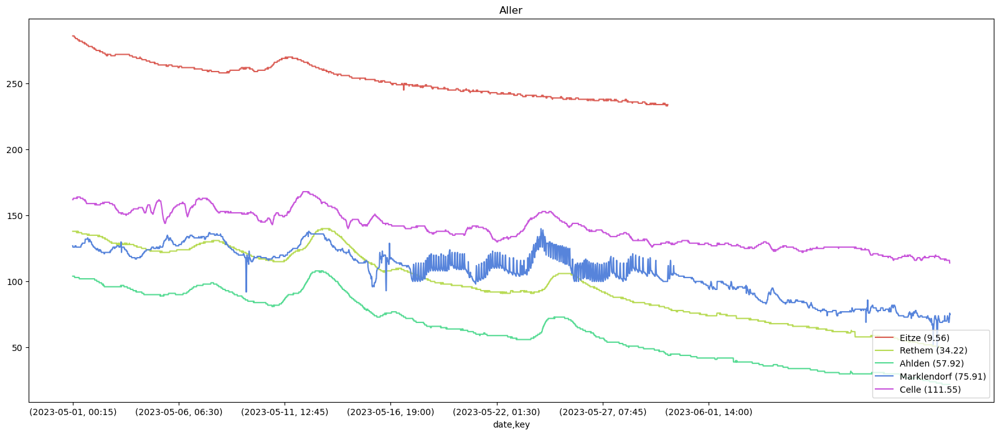

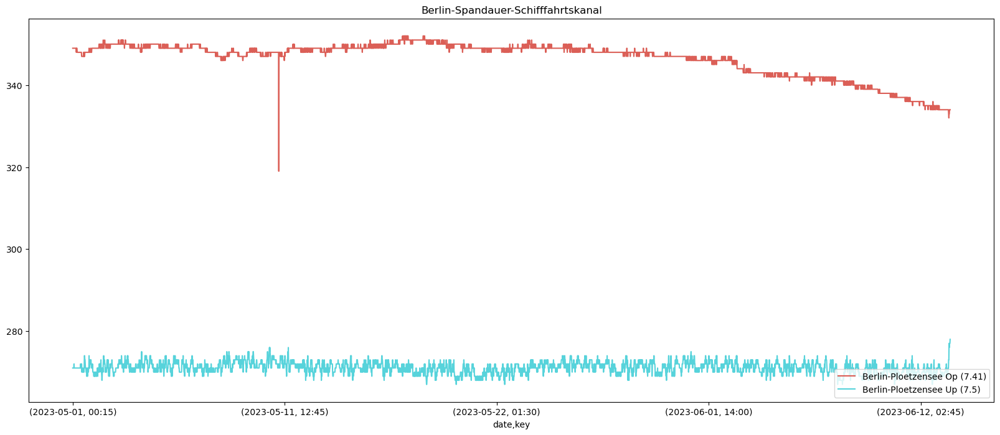

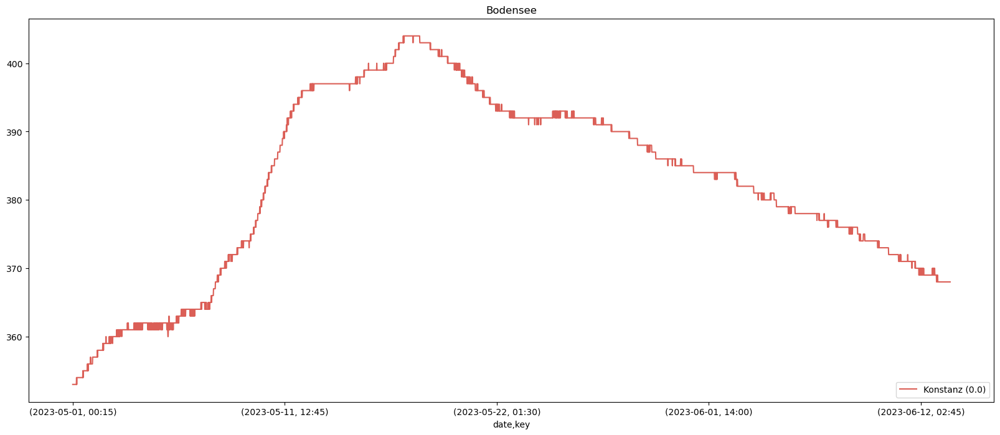

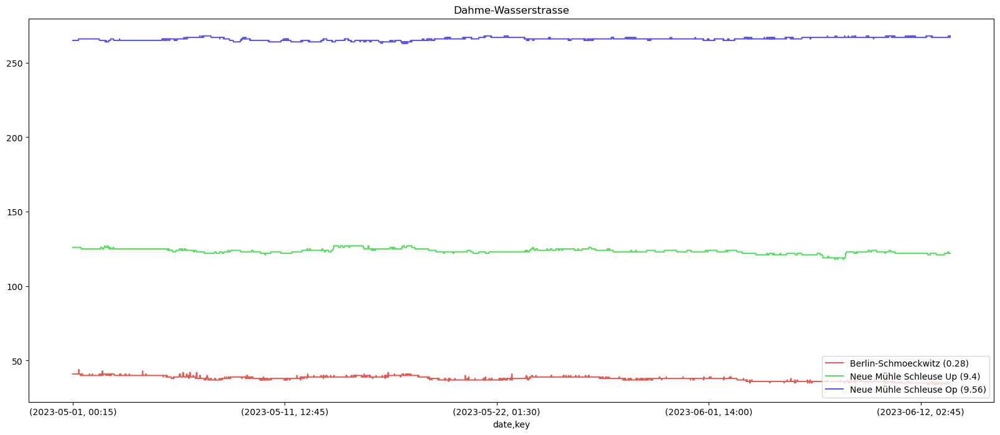

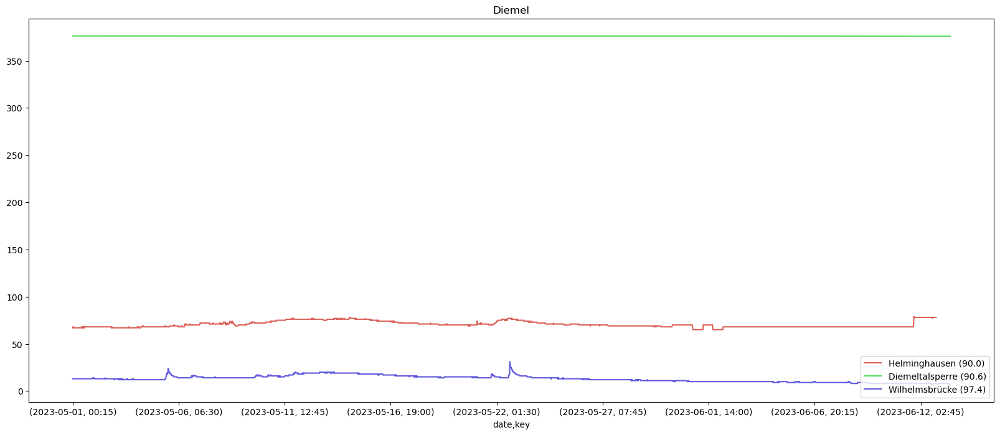

...

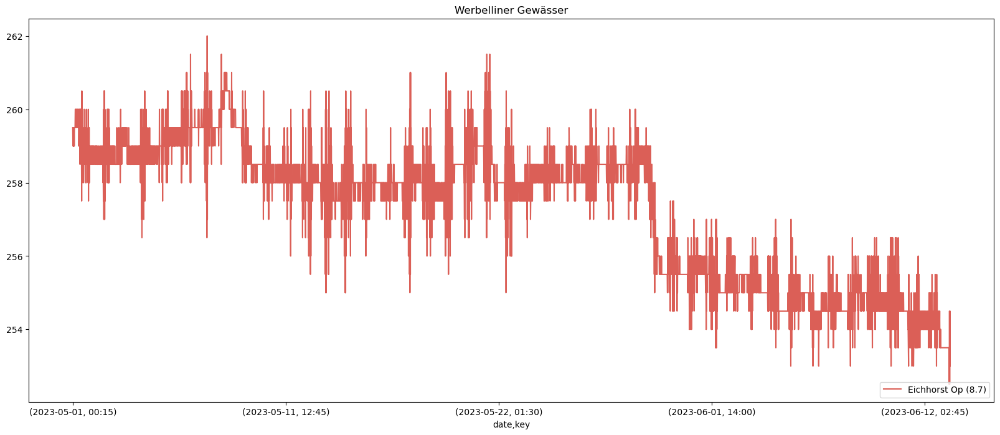

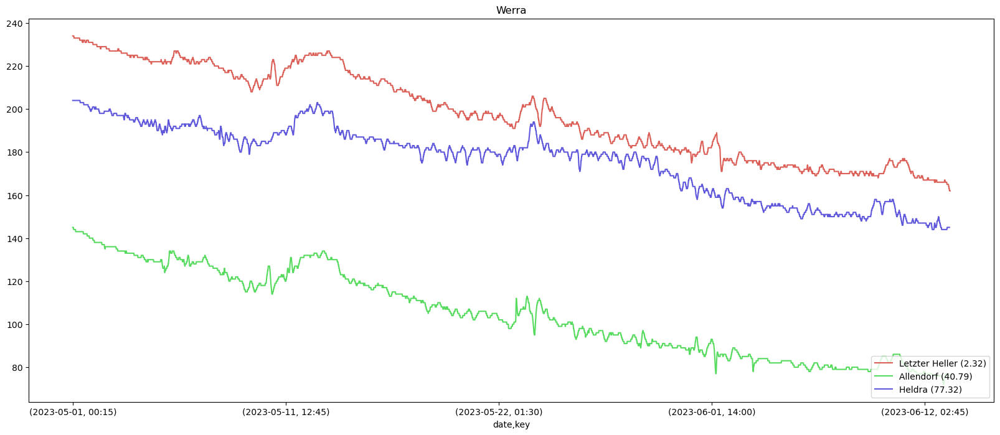

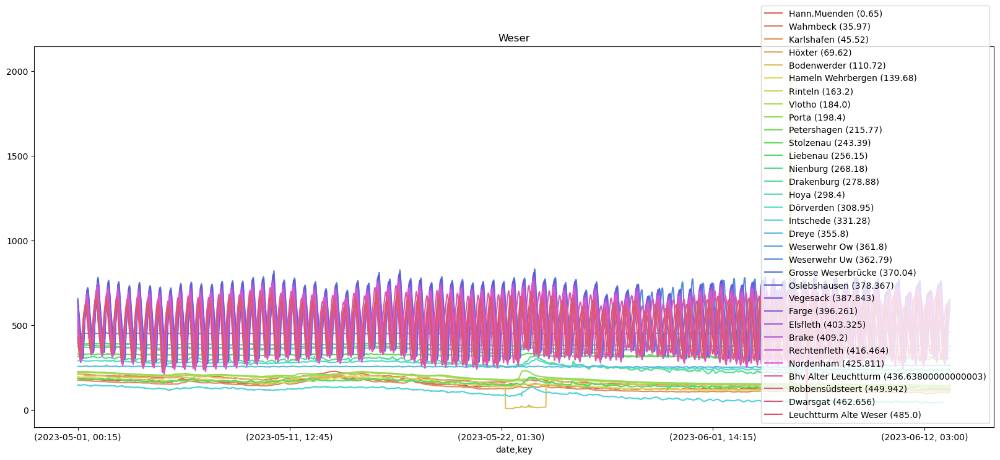

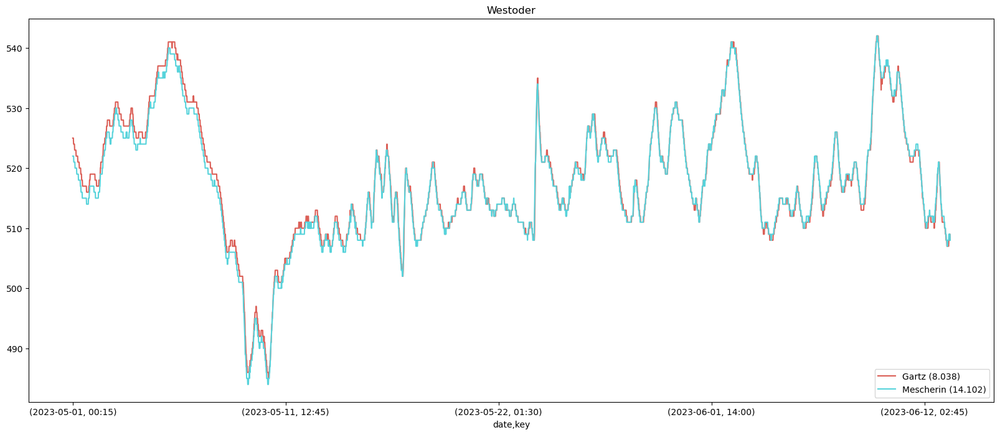

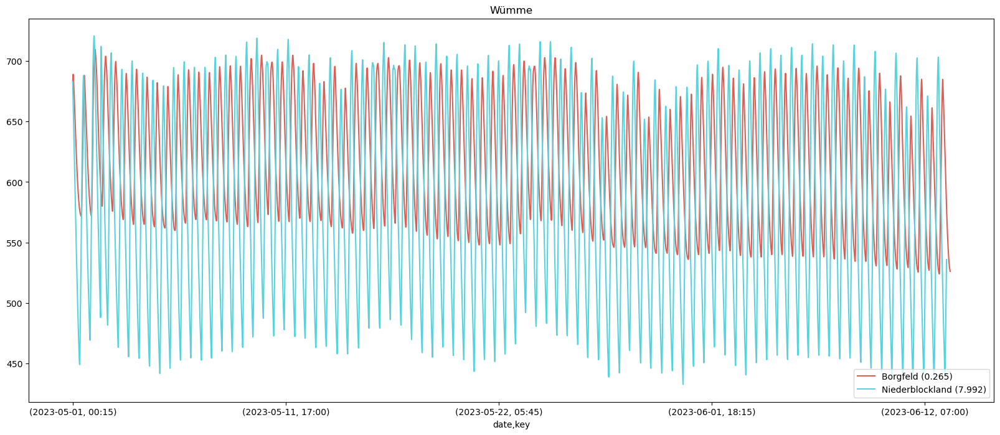

In [45]:

y = 0
for fluss, d1 in sorted(data.groupby("fluss")):

    # Generate a list of distinct colors using a seaborn palette
    num_colors = d1["km"].drop_duplicates().shape[0]
    color_palette = sns.color_palette("hls", num_colors)

    fig, axes = plt.subplots(1, 1, tight_layout=False, figsize = (20, 8))
    axes.set_title(fluss)
    i = 0
    for station, d2 in d1[d1.date <= "2023-06-13"].groupby("km"):

        if ~d2['key'].str.endswith(('0', '5')).all():
            print(f"Compress timeseries for the type {d2.type.values[0]} for {d2.name.values[0]} on river {fluss}")

            # Resample the group to 15-minute intervals and calculate the mean value
            d2['timestamp'] = pd.to_datetime(d2['date'] + ' ' + d2['key'])

            # Set 'timestamp' column as the DataFrame index
            dx = d2.set_index('timestamp')

            dx['value'] = dx['value'].resample('15T').mean()
            dx = dx.dropna(subset=['value'])
            d2 = dx.reset_index()
            
        g = d2.groupby(["date", "key"])["value"].mean().plot.line(color=color_palette[i], label=d2.name.values[0] + " (" + str(station) + ")")
        i += 1

    axes.legend(loc="lower right")
    y += 1

    # if y > 2:
    #     break


In [24]:
data[(data.fluss == "Diemel") & (data.name == "Diemeltalsperre")].head()


,fluss,id,name,uuid,river_id,number,km,agency,latitude,longitude,last_update,date,idx,type,key,value
48734,Diemel,7,Diemeltalsperre,5cdc6555-87d7-4fcd-834d-cbbe24c9d08b,7,44100104,90.60,Hann-Münden,51.38,8.73,2023-06-13 09:40:29,2023-05-01,0,W,00:15,376.18
48735,Diemel,7,Diemeltalsperre,5cdc6555-87d7-4fcd-834d-cbbe24c9d08b,7,44100104,90.60,Hann-Münden,51.38,8.73,2023-06-13 09:40:29,2023-05-01,1,W,00:30,376.18
48736,Diemel,7,Diemeltalsperre,5cdc6555-87d7-4fcd-834d-cbbe24c9d08b,7,44100104,90.60,Hann-Münden,51.38,8.73,2023-06-13 09:40:29,2023-05-01,2,W,00:45,376.18
48737,Diemel,7,Diemeltalsperre,5cdc6555-87d7-4fcd-834d-cbbe24c9d08b,7,44100104,90.60,Hann-Münden,51.38,8.73,2023-06-13 09:40:29,2023-05-01,3,W,01:00,376.18
48738,Diemel,7,Diemeltalsperre,5cdc6555-87d7-4fcd-834d-cbbe24c9d08b,7,44100104,90.60,Hann-Münden,51.38,8.73,2023-06-13 09:40:29,2023-05-01,4,W,01:15,376.18


In [8]:
i = 0
for fluss, d1 in sorted(data.groupby("fluss")):
    map = folium.Map(location=[51.1657, 10.4515], zoom_start=6)

    group = folium.FeatureGroup(name=fluss)
    locations = []
    for km, station in sorted(d1.groupby("km")):
        lat = station['latitude'].values[0]
        lng = station['longitude'].values[0]
        print(km, lat, lng)
        locations.append((lat, lng))
        folium.Marker(station[["latitude", "longitude"]].drop_duplicates(), 
                        popup=station.name.values[0] + " (" + str(km) + ")", #.title() + "  (" + row['longname'].title() + ") [" + row['agency'] + "]" + str(row['number']) + " / " + str(row['km']),
                        icon=folium.Icon(color='blue', icon='info-sign')).add_to(group)
    # Add the group to the map
    group.add_to(map)
    folium.PolyLine(locations, color='blue', weight=2.5).add_to(group)
    # Add layer control to the map
    folium.LayerControl().add_to(map)

    # Display the map
    #map
    map.save(fluss + ".html")

    i += 1

    if i > 1:
        break
#map

9.56 52.90406544743417 9.276769435375872
34.22 52.789097592149574 9.382840810129355
57.92 52.76243127485539 9.57088073000537
75.91 52.68275727270215 9.70345575731809
111.55 52.62270553213209 10.062164093638698
7.41 52.543699621319746 13.32314190907983
7.5 52.54303554469815 13.323858970566247
